# Pembangunan Distribusi GMSNBurr (PyMC dan Bambi)

## Kebutuhan Awal

Gunakan GPU untuk komputasi yang lebih cepat

In [1]:
import tensorflow as tf
import torch
import subprocess

print("Mengecek GPU dengan TensorFlow:")
# Menampilkan daftar perangkat fisik yang terlihat oleh TensorFlow
gpus_tf = tf.config.list_physical_devices('GPU')
if gpus_tf:
    try:
        # Menampilkan detail GPU
        for gpu in gpus_tf:
            print(f"- Nama GPU: {gpu.name}, Tipe: {tf.config.experimental.get_device_details(gpu)['device_name']}")
        # Memastikan TensorFlow dapat menggunakan GPU
        tf.config.experimental.set_memory_growth(gpus_tf[0], True) # Opsi untuk menghindari alokasi memori penuh sekaligus
        print("- TensorFlow dikonfigurasi untuk menggunakan GPU.")
        # Tes sederhana operasi di GPU
        with tf.device('/GPU:0'):
            a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
            b = tf.constant([[1.0, 1.0, 1.0], [1.0, 1.0, 1.0]])
            c = a + b
            print(f"- Hasil operasi TensorFlow di GPU: \n{c.numpy()}")
    except RuntimeError as e:
        print(f"- Error saat mengkonfigurasi GPU TensorFlow: {e}")
        print("- Mungkin ada masalah dengan driver atau instalasi CUDA.")
else:
    print("- Tidak ada GPU yang terdeteksi oleh TensorFlow.")

print("\n" + "="*30 + "\n")

print("Mengecek GPU dengan PyTorch:")
if torch.cuda.is_available():
    print(f"- PyTorch dapat menggunakan GPU.")
    # menampilkan jumlah GPU yang tersedia
    print(f"- Jumlah GPU yang tersedia untuk PyTorch: {torch.cuda.device_count()}")
    # menampilkan nama GPU yang sedang digunakan (GPU pertama secara default)
    print(f"- Nama GPU: {torch.cuda.get_device_name(0)}")
    # pindahkan tensor ke GPU dan lakukan operasi
    device = torch.device("cuda") # atau torch.device("cuda:0")
    a_torch = torch.tensor([[1.0, 2.0], [3.0, 4.0]], device=device)
    b_torch = torch.tensor([[1.0, 1.0], [1.0, 1.0]], device=device)
    c_torch = a_torch + b_torch
    print(f"- Hasil operasi PyTorch di GPU: \n{c_torch.cpu().numpy()}") # pindahkan kembali ke CPU untuk dicetak jika perlu
else:
    print("- Tidak ada GPU yang terdeteksi oleh PyTorch (CUDA tidak tersedia).")

print("\n" + "="*30 + "\n")

print("Informasi lebih lanjut (jika GPU terdeteksi):")
if gpus_tf or torch.cuda.is_available():
    print("Menjalankan nvidia-smi melalui subprocess untuk detail GPU dari sistem:")
    try:
        # Menjalankan perintah dan menangkap outputnya
        result = subprocess.run(['nvidia-smi'], capture_output=True, text=True, check=True, shell=True)
        print(result.stdout)
    except FileNotFoundError:
        print("Perintah 'nvidia-smi' tidak ditemukan. Pastikan driver NVIDIA terinstal dengan benar.")
    except subprocess.CalledProcessError as e:
        print(f"Error saat menjalankan nvidia-smi: {e.stderr}")
else:
    print("Tidak ada GPU yang aktif untuk menampilkan info nvidia-smi.")

Mengecek GPU dengan TensorFlow:
- Tidak ada GPU yang terdeteksi oleh TensorFlow.


Mengecek GPU dengan PyTorch:
- PyTorch dapat menggunakan GPU.
- Jumlah GPU yang tersedia untuk PyTorch: 1
- Nama GPU: NVIDIA GeForce MX450
- Hasil operasi PyTorch di GPU: 
[[2. 3.]
 [4. 5.]]


Informasi lebih lanjut (jika GPU terdeteksi):
Menjalankan nvidia-smi melalui subprocess untuk detail GPU dari sistem:
Wed Aug  6 08:55:57 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 576.57                 Driver Version: 576.57         CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=====================

Library atau package yang digunakan

In [ ]:
# pengembangan distribusi
import pymc as pm
import numpy as np
import pandas as pd
import pytensor.tensor as at
import arviz as az
import bambi as bmb
import warnings
from pytensor.tensor import gammaln, switch, isinf
from scipy.special import betaincinv, gammaln as np_gammaln
from typing import Optional, Tuple
from pymc.distributions.dist_math import check_parameters

# komponen pendukung
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import math
import scipy.stats as st
from scipy.stats import norm, skew, kurtosis, gaussian_kde
from scipy.integrate import quad
import gdown

In [3]:
# lihat versi PyMC yang digunakan
!pip show pymc
!pip show bambi
warnings.filterwarnings("ignore", message="PyTensor could not link to a BLAS installation.")

Name: pymc
Version: 5.23.0
Summary: Probabilistic Programming in Python: Bayesian Modeling and Probabilistic Machine Learning with PyTensor
Home-page: http://github.com/pymc-devs/pymc
Author: 
Author-email: 
License: Apache License, Version 2.0
Location: C:\Users\Ezra\OneDrive\Documents\Ezra\Kuliah\Skripsi\gpu-py-env\venv-py311\Lib\site-packages
Requires: arviz, cachetools, cloudpickle, numpy, pandas, pytensor, rich, scipy, threadpoolctl, typing-extensions
Required-by: bambi
Name: bambi
Version: 0.15.0
Summary: BAyesian Model Building Interface in Python
Home-page: https://bambinos.github.io/bambi
Author: 
Author-email: 
License: MIT License

Copyright (c) 2016 the developers of Bambi

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell

MSNBurr sebagai perbandingan model

In [4]:
def logpMSNBurr(y: at.TensorVariable, mu: at.TensorVariable, sigma: at.TensorVariable, alpha: at.TensorVariable, **kwargs):
  omega = (1 + (1 / alpha))**(alpha + 1) / np.sqrt(2 * np.pi)
  epart = -at.log(alpha) - (omega / sigma * (y - mu))
  logpdf = at.switch(at.eq(y, -np.inf), -np.inf, at.log(omega) - at.log(sigma) - (omega / sigma * (y - mu)) - ((alpha + 1) * at.log1pexp(epart)))
  return check_parameters(logpdf, alpha > 0, sigma > 0, msg=f"alpha must be more than 0, sigma must be more than 0")

def logcdfMSNBurr(y: at.TensorVariable, mu: at.TensorVariable, sigma: at.TensorVariable, alpha: at.TensorVariable, **kwargs):
  omega = (1+(1/alpha))**(alpha+1)/np.sqrt(2*np.pi)
  epart = -at.log(alpha) - (omega/sigma*(y-mu))
  logcdf= -alpha*at.log1pexp(epart)
  return check_parameters(logcdf, alpha > 0, sigma > 0, msg=f"alpha must more than 0, sigma must more than 0")

def randomMSNBurr(mu: np.ndarray | float, sigma: np.ndarray | float, alpha: np.ndarray | float, rng = np.random.default_rng(), size: Optional[Tuple[int]]=None):
  if sigma <= 0:
      raise ValueError("sigma must more than 0")
  if alpha <= 0:
      raise ValueError("alpha must more than 0")
  u = rng.uniform(low=0, high=1, size=size)
  omega = (1+(1/alpha))**(alpha+1)/np.sqrt(2*np.pi)
  random = mu - sigma/omega*(np.log(alpha)+np.log((u**(-1/alpha))-1))
  return np.asarray(random)

class MSNBurr:
  def main(name:str, mu, sigma, alpha, observed=None, **kwargs):
      return pm.CustomDist(name, mu, sigma, alpha, logp = logpMSNBurr, logcdf = logcdfMSNBurr, random = randomMSNBurr, observed = observed, **kwargs)
  def dist(mu, sigma, alpha, **kwargs):
      return pm.CustomDist.dist(mu, sigma, alpha, logp = logpMSNBurr, logcdf = logcdfMSNBurr, random = randomMSNBurr)

PDF MSNBurr

In [5]:
# definisi parameter
mu = at.scalar('mu')
sigma = at.scalar('sigma')
alpha = at.scalar('alpha')
value = at.scalar('value')

# definisi distribusi kustom
rv_msnburr = MSNBurr.dist(mu=mu, sigma=sigma, alpha=alpha)

# compile logp
rv_logpMSNBurr = pm.logp(rv_msnburr, value)
rv_logpMSNBurr_fn = pm.compile([value, mu, sigma, alpha], rv_logpMSNBurr)

MSNBurr-IIa sebagai perbandingan model

In [6]:
def quantiledMSNBurrIIa(p: int, mu, sigma, alpha) -> int:
  if sigma <= 0:
    raise ValueError("sigma must more than 0")
  if alpha <= 0:
    raise ValueError("alpha must more than 0")
  omega = (1 + (1 / alpha)) ** (alpha + 1) / np.sqrt(2 * np.pi)
  q = mu + sigma/omega * (np.log(alpha) + np.log((1 - p)**(-1/alpha)-1))
  return q

def logpMSNBurrIIa(y, mu, sigma, alpha, **kwargs):
  omega = (1 + (1 / alpha)) ** (alpha + 1) / np.sqrt(2 * np.pi)
  epart = omega / sigma * (y - mu) - at.log(alpha)
  logpdf = at.log(omega) - at.log(sigma) + (omega / sigma * (y - mu)) - ((alpha + 1) * at.log1pexp(epart))
  return check_parameters(logpdf, alpha > 0, sigma > 0, msg=f"alpha must more than 0, sigma must more than 0")

def logcdfMSNBurrIIa(y, mu, sigma, alpha):
  omega = (1 / np.sqrt(2 * np.pi)) * (1 + 1 / alpha) ** (alpha + 1)
  zoa = omega * ((y - mu) / sigma) - np.log(alpha)
  log1pexp = np.where(zoa > 0, zoa + np.log1p(np.exp(-zoa)), np.log1p(np.exp(zoa)))
  qs = -alpha * log1pexp
  log1mexp = np.where(qs > np.log(2), np.log1p(-np.exp(qs)), np.log(-np.expm1(qs)))
  return np.sum(log1mexp)

def randomMSNBurrIIa(mu, sigma, alpha, rng = np.random.default_rng(), size: Optional[Tuple[int]]=None):
  if sigma <= 0:
    raise ValueError("sigma must more than 0")
  if alpha <= 0:
    raise ValueError("alpha must more than 0")
  u = rng.uniform(low=0, high=1, size=size)
  random = quantiledMSNBurrIIa(u, mu, sigma, alpha)
  return np.asarray(random)

class MSNBurrIIa:
  def main(name:str, mu, sigma, alpha, observed=None, **kwargs):
      return pm.CustomDist(name, mu, sigma, alpha, logp = logpMSNBurrIIa, logcdf = logcdfMSNBurrIIa, random = randomMSNBurrIIa, observed = observed, **kwargs)
  def dist(mu, sigma, alpha, **kwargs):
      return pm.CustomDist.dist(mu, sigma, alpha, logp = logpMSNBurrIIa, logcdf = logcdfMSNBurrIIa, random = randomMSNBurrIIa)

PDF MSNBurr-IIa

In [7]:
# definisi parameter
mu = at.scalar('mu')
sigma = at.scalar('sigma')
alpha = at.scalar('alpha')
value = at.scalar('value')

# definisi distribusi kustom
rv_msnburriia = MSNBurrIIa.dist(mu=mu, sigma=sigma, alpha=alpha)

# compile logp
rv_logpMSNBurrIIa = pm.logp(rv_msnburriia, value)
rv_logpMSNBurrIIa_fn = pm.compile([value, mu, sigma, alpha], rv_logpMSNBurrIIa)

## Pembangunan Distribusi

### PyMC

Tiga komponen yang dibutuhkan, yaitu Logaritma Natural FKP, Logaritma Natural FDK, dan Random (Invers FDK). Tambahan komponen, yaitu Moment dan Kuantil

In [8]:
# KOMPONEN 1: Logaritma Natural PDF
def logp(y: at.TensorVariable,
        mu: at.TensorVariable,
        sigma: at.TensorVariable,
        alpha1: at.TensorVariable,
        alpha2: at.TensorVariable,
        log=True, **kwargs): # untuk output dalam logaritma natural PDF, jika false output PDF

  # hitung nilai logaritma natural beta(alpha1, alpha2)
  betaln_val = gammaln(alpha1) + gammaln(alpha2) - gammaln(alpha1 + alpha2)

  # hitung logaritma natural omega
  lomega = (
      -0.5 * at.log(2 * at.pi)
      + betaln_val
      - alpha2 * (at.log(alpha2) - at.log(alpha1))
      + (alpha1 + alpha2) * at.log1p(alpha2 / alpha1))

  # nilai omega
  omega = at.exp(lomega)

  # (y - mu) / sigma
  zo = -omega * ((y - mu) / sigma)
  zoa = zo + at.log(alpha2) - at.log(alpha1)

  # hitung logp
  logp = (
      lomega
      - at.log(sigma)
      + alpha2 * (at.log(alpha2) - at.log(alpha1))
      + alpha2 * zo
      - (alpha1 + alpha2) * at.log1p(at.exp(zoa))
      - betaln_val
  )

  # memeriksa zo apakah infinity
  lp = switch(isinf(zo), -at.inf, logp)

  if not log: # untuk nilai PDF sebenarnya
    lp = at.exp(lp)

  # periksa input parameter alpha1, alpha2, dan sigma
  return check_parameters(lp, alpha1 > 0, alpha2 > 0, sigma > 0, msg='alpha1, alpha2, and sigma must be more than 0')

# KOMPONEN 2: Logaritma Natural CDF
def logcdf(y: at.TensorVariable,
          mu: at.TensorVariable,
          sigma: at.TensorVariable,
          alpha1: at.TensorVariable,
          alpha2: at.TensorVariable,
          lower_tail=True, # untuk output lower tail, jika false upper tail
          log=True, # untuk output dalam logaritma natural CDF, jika false output CDF
          **kwargs):
  
  # hitung nilai logaritma natural beta(alpha1, alpha2)
  betaln_val = gammaln(alpha1) + gammaln(alpha2) - gammaln(alpha1 + alpha2)
  
  # hitung logaritma natural omega
  lomega = (
      -0.5 * at.log(2 * at.pi)
      + betaln_val
      - alpha2 * (at.log(alpha2) - at.log(alpha1))
      + (alpha1 + alpha2) * at.log1p(alpha2 / alpha1))

  # nilai omega
  omega = at.exp(lomega)
  
  epart = at.exp(-omega * ((y - mu) / sigma))
  ep = 1 / (1 + (alpha2 / alpha1) * epart)

  # hitung nilai CDF dengan incomplete beta ratio
  cdf_value = at.betainc(alpha1, alpha2, ep)

  # menghitung logaritma natural CDF
  if log:
    # output lower tail, jika false upper tail
    final_cdf_value = at.log(cdf_value) if lower_tail else at.log(1 - cdf_value)
  else: # untuk nilai CDF sebenarnya
    final_cdf_value = cdf_value if lower_tail else 1 - cdf_value

  # periksa input parameter alpha1, alpha2, dan sigma
  return check_parameters(final_cdf_value, alpha1 > 0, alpha2 > 0, sigma > 0, msg='alpha1, alpha2, and sigma must be more than 0')

# KOMPONEN 3: Random
def random(
      mu: np.ndarray | float,
      sigma: np.ndarray | float,
      alpha1: np.ndarray | float,
      alpha2: np.ndarray | float,
      rng = np.random.default_rng(),
      size: Optional[Tuple[int]]=None, **kwargs):

  # periksa input parameter alpha1, alpha2, dan sigma
  if any(param <= 0 for param in [sigma, alpha1, alpha2]):
    raise ValueError("sigma, alpha1, and alpha2 must be more than 0")

  # hitung nilai logaritma natural beta(alpha1, alpha2)
  betaln_val = np_gammaln(alpha1) + np_gammaln(alpha2) - np_gammaln(alpha1 + alpha2)

  # hitung logaritma natural omega
  lomega = (
      -0.5 * np.log(2 * np.pi)
      + betaln_val
      - alpha2 * (np.log(alpha2) - np.log(alpha1))
      + (alpha1 + alpha2) * np.log1p(alpha2 / alpha1))

  # nilai omega
  omega = np.exp(lomega)

  z1 = rng.chisquare(2 * alpha1, size=size) / (2 * alpha1)
  z2 = rng.chisquare(2 * alpha2, size=size) / (2 * alpha2)

  logzf = np.log(z2) - np.log(z1)
  random_variate = mu - (sigma / omega) * logzf

  return np.asarray(random_variate)

# KOMPONEN 4: Moment
def moment(y, size,
          mu: at.TensorVariable,
          sigma: at.TensorVariable,
          alpha1: at.TensorVariable,
          alpha2: at.TensorVariable):

  # cek shape input
  if size is None:
    size = y.shape

  # hitung nilai logaritma natural beta(alpha1, alpha2)
  betaln_val = gammaln(alpha1) + gammaln(alpha2) - gammaln(alpha1 + alpha2)

  # hitung logaritma natural omega
  lomega = (
    -0.5 * at.log(2 * at.pi)
    + betaln_val
    - alpha2 * (at.log(alpha2) - at.log(alpha1))
    + (alpha1 + alpha2) * at.log1p(alpha2 / alpha1))

  # nilai omega
  omega = at.exp(lomega)

  # komponen moment
  moment = mu + sigma/omega*(at.log(alpha2/alpha1) + at.digamma(alpha1)- at.digamma(alpha2))

  # cek dimensi dan periksa input parameter alpha1, alpha2, dan sigma
  return check_parameters(at.full(size, moment), alpha1 > 0, alpha2 > 0, sigma > 0, msg='alpha1, alpha2, and sigma must be more than 0')

# KOMPONEN 5: Quantile
def quantile(p, mu, sigma, alpha1, alpha2):
  # periksa input parameter alpha1, alpha2, sigma, dan p
  if any(param <= 0 for param in [sigma, alpha1, alpha2]):
    raise ValueError("sigma, alpha1, and alpha2 must be more than 0")
  if p < 0 or p > 1:
    raise ValueError("p must be between 0 and 1")

  # hitung nilai logaritma natural beta(alpha1, alpha2)
  betaln_val = np_gammaln(alpha1) + np_gammaln(alpha2) - np_gammaln(alpha1 + alpha2)

  # hitung logaritma natural omega
  lomega = (
      -0.5 * np.log(2 * at.pi)
      + betaln_val
      - alpha2 * (np.log(alpha2) - np.log(alpha1))
      + (alpha1 + alpha2) * np.log1p(alpha2 / alpha1))

  # nilai omega
  omega = np.exp(lomega)

  ib = betaincinv(alpha1, alpha2, p)
  s = (1 / ib) - 1
  quantile_value = mu - (sigma / omega) * (alpha1 / alpha2) * np.log(s)
  return quantile_value

class GMSNBurr(pm.Continuous):
  # definisi parameter kelas
  def __init__(self, mu, sigma, alpha1, alpha2, *args, **kwargs):
    super().__init__(*args, **kwargs)
    self.mu = at.as_tensor_variable(mu)
    self.sigma = at.as_tensor_variable(sigma)
    self.alpha1 = at.as_tensor_variable(alpha1)
    self.alpha2 = at.as_tensor_variable(alpha2)

  @staticmethod
  def main(name: str, mu, sigma, alpha1, alpha2, observed=None, **kwargs):
    return pm.CustomDist(
        name, mu, sigma, alpha1, alpha2, # parameter
        logp=logp,logcdf=logcdf, random=random, observed=observed, # fungsi
        **kwargs,
    )

  @staticmethod
  def dist(mu, sigma, alpha1, alpha2, **kwargs):
    return pm.CustomDist.dist(
        mu, sigma, alpha1, alpha2, # parameter
        logp=logp, logcdf=logcdf, random=random, # fungsi
        **kwargs,
    )

  # moment
  @staticmethod
  def moment(rv, size, mu, sigma, alpha1, alpha2):
    return moment(rv, size, mu, sigma, alpha1, alpha2)

  # quantile
  @staticmethod
  def quantile(q, mu, sigma, alpha1, alpha2):
    return quantile(q, mu, sigma, alpha1, alpha2)

Definisi distribusi kustom dengan PyMC

In [9]:
# definisi parameter
mu = at.scalar('mu')
sigma = at.scalar('sigma')
alpha1 = at.scalar('alpha1')
alpha2 = at.scalar('alpha2')
value = at.scalar('value')

# definisi distribusi kustom
rv = GMSNBurr.dist(mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2)

# FKP
rv_logp = pm.logp(rv, value)
rv_logp_fn = pm.compile([value, mu, sigma, alpha1, alpha2], rv_logp)

# FDK
rv_logcdf = pm.logcdf(rv, value)
rv_logcdf_fn = pm.compile([value, mu, sigma, alpha1, alpha2], rv_logcdf)

In [10]:
# contoh penggunaan
x, alpha1, alpha2, mu, sigma = 0.1, 0.3, 5, 0, 1
nilaifkp = np.exp(rv_logp_fn(x, mu, sigma, alpha1, alpha2))
print(f'FKP GMSNBurr(0,1|0,3; 5; 0; 1) = {nilaifkp}'.replace('.', ','))
nilaifdk = math.exp(rv_logcdf_fn(x, mu, sigma, alpha1, alpha2))
print(f'FDK GMSNBurr(0,1|0,3; 5; 0; 1) = {nilaifdk}'.replace('.', ','))
rv = GMSNBurr.dist(mu, sigma, alpha1, alpha2)
datarandom = pm.draw(rv, draws=1000, random_seed=42)
print(f'Lima data bangkitan GMSNBurr(0,3; 5; 0; 1) : {datarandom[:5]}'.replace('.', ','))

FKP GMSNBurr(0,1|0,3; 5; 0; 1) = 0,39551653838411593
FDK GMSNBurr(0,1|0,3; 5; 0; 1) = 0,7495354493251996
Lima data bangkitan GMSNBurr(0,3; 5; 0; 1) : [ 0,64210051 -1,67327419 -1,49314067 -5,32817065 -0,19993828]


### Bambi

In [11]:
# definisi GMSNBurr ke Bambi
pm.GMSNBurr = GMSNBurr

# likelihood
likelihood = bmb.Likelihood(
    "GMSNBurr",
    params=["mu", "sigma", "alpha1", "alpha2"],
    parent="mu")

# prior
priors = {"sigma": bmb.Prior("HalfCauchy", beta=2),
          "alpha1": bmb.Prior("Lognormal", mu=0.5, sigma=0.5),
          "alpha2": bmb.Prior("Lognormal", mu=0.5, sigma=0.5)}

# custom family
family = bmb.Family("GMSNBurr", likelihood, bmb.Link("identity"))

# default prior
bmb.Family.set_default_priors(family, priors)

## Computerized Model Verification

Tahapan ini digunakan untuk megecek apakah ada error dari komponen distribusi dan kode bdapat berjalan dengan baik.

In [13]:
# fungsi pengecekan output
def is_valid_number(value):
    return np.isfinite(value) and not np.isnan(value)

# fungsi untuk menghitung kemencengan pada FKP
def skew_pdf(x, y):
  weights = y / np.sum(y)
  mean = np.sum(x * weights)
  variance = np.sum(weights * (x - mean)**2)
  std_dev = np.sqrt(variance)
  third_central_moment = np.sum(weights * (x - mean)**3)
  skewness = third_central_moment / (std_dev**3)
  return round(skewness, 3)

### FKP GMSNBurr

#### Evaluasi Titik

Skenario Menceng Kiri

In [8]:
# kasus 1
x, alpha1, alpha2, mu, sigma = 4, 0.1, 4, 3, 1
fkp1a = np.exp(rv_logp_fn(x, mu, sigma, alpha1, alpha2))
valid_a = is_valid_number(fkp1a)
print(f'FKP GMSNBurr({x}|{alpha1}; {alpha2}; {mu}; {sigma}) = {fkp1a}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_a}')

# kasus 2
x, alpha1, alpha2, mu, sigma = 5, 1, 5, 2, 1
fkp1b = np.exp(rv_logp_fn(x, mu, sigma, alpha1, alpha2))
valid_b = is_valid_number(fkp1b)
print(f'FKP GMSNBurr({x}|{alpha1}, {alpha2}, {mu}, {sigma}) = {fkp1b}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_b}')

FKP GMSNBurr(4|0,1; 4; 3; 1) = 0,0004087348767133154
Valid (numerik & bukan NaN): True
FKP GMSNBurr(5|1, 5, 2, 1) = 0,00014709368847853064
Valid (numerik & bukan NaN): True


Skenario Menceng Kanan

In [9]:
# kasus 1
x, alpha1, alpha2, mu, sigma = 4, 2, 0.3, 4, 1
fkp2a = np.exp(rv_logp_fn(x, mu, sigma, alpha1, alpha2))
valid_a = is_valid_number(fkp2a)
print(f'FKP GMSNBurr({x}|{alpha1}; {alpha2}; {mu}; {sigma}) = {fkp2a}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_a}')

# kasus 2
x, alpha1, alpha2, mu, sigma = 5, 8, 6, 3, 2
fkp2b = np.exp(rv_logp_fn(x, mu, sigma, alpha1, alpha2))
valid_b = is_valid_number(fkp2b)
print(f'FKP GMSNBurr({x}|{alpha1}, {alpha2}, {mu}, {sigma}) = {fkp2b}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_b}')

FKP GMSNBurr(4|2; 0,3; 4; 1) = 0,3989422804014327
Valid (numerik & bukan NaN): True
FKP GMSNBurr(5|8, 6, 3, 2) = 0,12105202007566053
Valid (numerik & bukan NaN): True


Skenario Simetris

In [10]:
# kasus 1
x, alpha1, alpha2, mu, sigma = 4, 18, 18, 0, 2
fkp3a = np.exp(rv_logp_fn(x, mu, sigma, alpha1, alpha2))
valid_a = is_valid_number(fkp3a)
print(f'FDK GMSNBurr({x}|{alpha1}; {alpha2}; {mu}; {sigma}) = {fkp3a}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_a}')

# kasus 2
x, alpha1, alpha2, mu, sigma = 5, 1, 1, 3, 2
fkp3b = np.exp(rv_logp_fn(x, mu, sigma, alpha1, alpha2))
valid_b = is_valid_number(fkp3b)
print(f'FDK GMSNBurr({x}|{alpha1}, {alpha2}, {mu}, {sigma}) = {fkp3b}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_b}')

FDK GMSNBurr(4|18; 18; 0; 2) = 0,02723969850961951
Valid (numerik & bukan NaN): True
FDK GMSNBurr(5|1, 1, 3, 2) = 0,1118288300611434
Valid (numerik & bukan NaN): True


#### Visualisasi

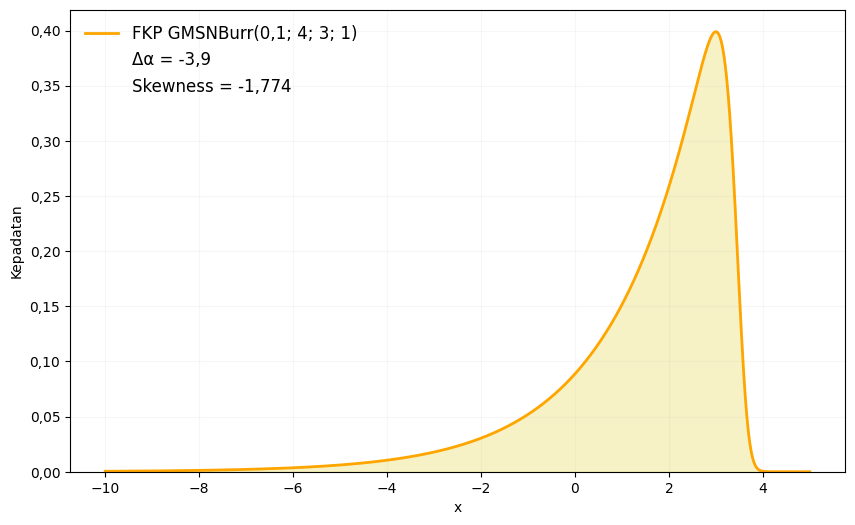

In [13]:
# Skenario Menceng Kiri
alpha1, alpha2, mu, sigma = 0.1, 4, 3, 1
x = np.linspace(-10, 5, 10000)
y = [np.exp(rv_logp_fn(x, mu, sigma, alpha1, alpha2)) for x in x]
delta_alpha_pdf = alpha1 - alpha2

# visualisasi dengan plot
with plt.style.context('fast'):
  plt.figure(figsize=(10,6))
  plt.plot(x, y, label=f'FKP GMSNBurr({alpha1}; {alpha2}; {mu}; {sigma})'.replace('.',','), color='orange',linewidth=2.0)
  plt.plot([], [], ' ', label=f'\u0394\u03B1 = {delta_alpha_pdf}'.replace('.',','))
  plt.plot([], [], ' ', label=f'Skewness = {skew_pdf(x, y)}'.replace('.',','))
  plt.xlabel("x")
  plt.ylabel("Kepadatan")
  plt.legend(loc="upper left", fontsize=12, frameon=False)
  plt.fill_between(x, y, color="khaki", alpha=0.5)
  plt.grid(alpha=0.1)
  plt.ylim(bottom=0)
  comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
  plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.show()

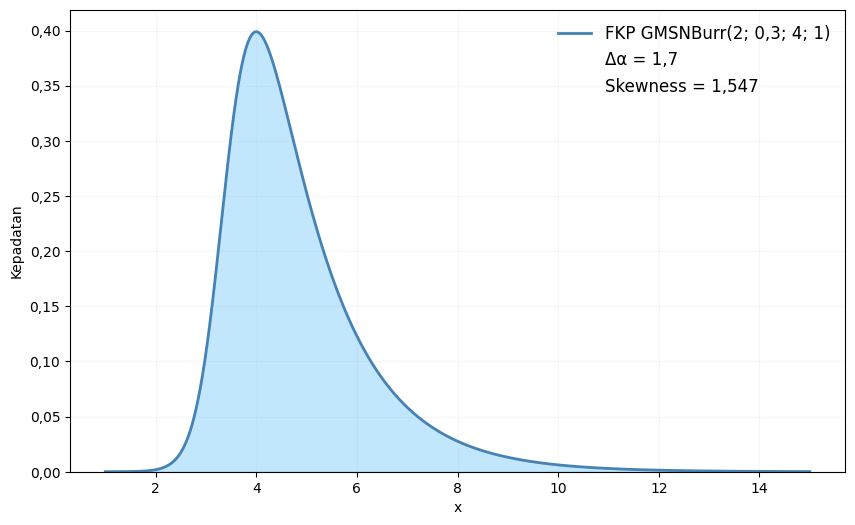

In [18]:
# Skenario Menceng Kanan
x = np.linspace(1, 15, 10000)
alpha1, alpha2, mu, sigma = 2, 0.3, 4, 1
y = [np.exp(rv_logp_fn(x, mu, sigma, alpha1, alpha2)) for x in x]
delta_alpha_pdf = alpha1 - alpha2

# visualisasi dengan plot
with plt.style.context('fast'):
  plt.figure(figsize=(10,6))
  plt.plot(x, y, label=f'FKP GMSNBurr({alpha1}; {alpha2}; {mu}; {sigma})'.replace('.',','), color='steelblue',linewidth=2.0)
  plt.plot([], [], ' ', label=f'\u0394\u03B1 = {delta_alpha_pdf}'.replace('.',','))
  plt.plot([], [], ' ', label=f'Skewness = {skew_pdf(x, y)}'.replace('.',','))
  plt.xlabel("x")
  plt.ylabel("Kepadatan")
  plt.legend(loc="upper right", fontsize=12, frameon=False)
  plt.fill_between(x, y, color="lightskyblue", alpha=0.5)
  plt.grid(alpha=0.1)
  plt.ylim(bottom=0)
  comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
  plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.show()

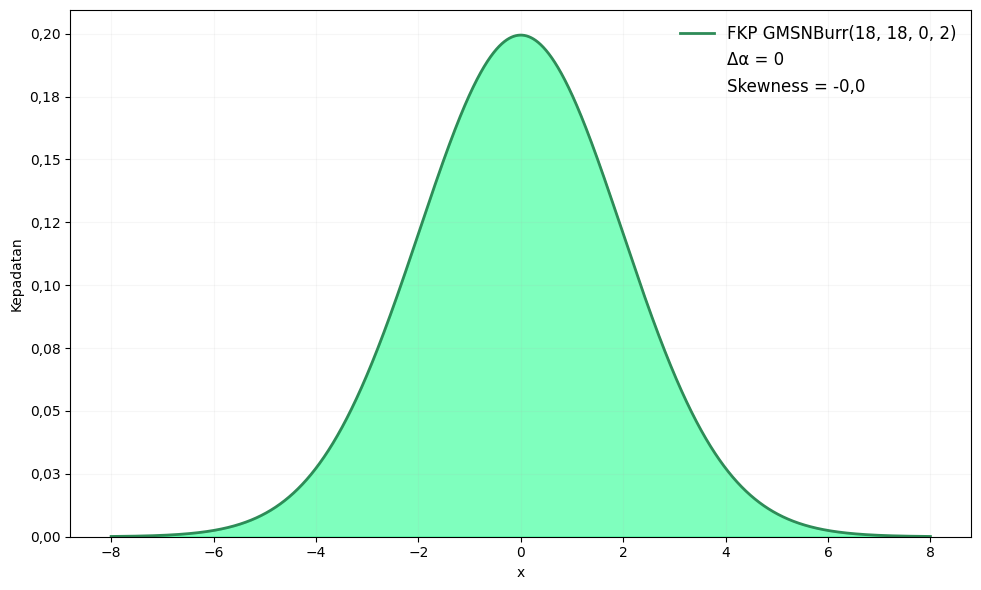

In [17]:
# Skenario Simetris
x = np.linspace(-8, 8, 10000)
alpha1, alpha2, mu, sigma = 18, 18, 0, 2
y = [np.exp(rv_logp_fn(x, mu, sigma, alpha1, alpha2)) for x in x]
delta_alpha_pdf = alpha1 - alpha2

# visualisasi dengan plot
with plt.style.context('fast'):
  plt.figure(figsize=(10,6))
  plt.plot(x, y, label=f'FKP GMSNBurr({alpha1}, {alpha2}, {mu}, {sigma})', color='seagreen',linewidth=2.0)
  plt.plot([], [], ' ', label=f'\u0394\u03B1 = {delta_alpha_pdf}')
  plt.plot([], [], ' ', label=f'Skewness = {skew_pdf(x, y)}'.replace('.',','))
  plt.xlabel("x")
  plt.ylabel("Kepadatan")
  plt.legend(loc="upper right", fontsize=12, frameon=False)
  plt.fill_between(x, y, color="springgreen", alpha=0.5)
  plt.grid(alpha=0.1)
  plt.ylim(bottom=0)
  plt.tight_layout()
  comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
  plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.show()

### FDK GMSNBurr

#### Evaluasi Titik

Skenario Menceng Kiri

In [26]:
# kasus 1
x, alpha1, alpha2, mu, sigma = 4, 0.1, 4, 3, 1
fdk1a = np.exp(rv_logcdf_fn(x, mu, sigma, alpha1, alpha2))
valid_a = is_valid_number(fdk1a)
print(f'FDK GMSNBurr({x}|{alpha1}; {alpha2}; {mu}; {sigma}) = {fdk1a}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_a}')

# kasus 2
x, alpha1, alpha2, mu, sigma = 5, 1, 5, 2, 1
fdk1b = np.exp(rv_logcdf_fn(x, mu, sigma, alpha1, alpha2))
valid_b = is_valid_number(fdk1b)
print(f'FDK GMSNBurr({x}|{alpha1}, {alpha2}, {mu}, {sigma}) = {fdk1b}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_b}')

FDK GMSNBurr(4|0,1; 4; 3; 1) = 0,9999779984278843
Valid (numerik & bukan NaN): True
FDK GMSNBurr(5|1, 5, 2, 1) = 0,9999718401833155
Valid (numerik & bukan NaN): True


Skenario Menceng Kanan

In [27]:
# kasus 1
x, alpha1, alpha2, mu, sigma = 4, 2, 0.3, 4, 1
fdk2a = np.exp(rv_logcdf_fn(x, mu, sigma, alpha1, alpha2))
valid_a = is_valid_number(fdk2a)
print(f'FDK GMSNBurr({x}|{alpha1}; {alpha2}; {mu}; {sigma}) = {fdk2a}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_a}')

# kasus 2
x, alpha1, alpha2, mu, sigma = 5, 8, 6, 3, 2
fdk2b = np.exp(rv_logcdf_fn(x, mu, sigma, alpha1, alpha2))
valid_b = is_valid_number(fdk2b)
print(f'FDK GMSNBurr({x}|{alpha1}, {alpha2}, {mu}, {sigma}) = {fdk2b}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_b}')

FDK GMSNBurr(4|2; 0,3; 4; 1) = 0,31563437460289834
Valid (numerik & bukan NaN): True
FDK GMSNBurr(5|8, 6, 3, 2) = 0,8304303066844165
Valid (numerik & bukan NaN): True


Skenario Simetris

In [29]:
# kasus 1
x, alpha1, alpha2, mu, sigma = 4, 18, 18, 0, 2
fdk3a = np.exp(rv_logcdf_fn(x, mu, sigma, alpha1, alpha2))
valid_a = is_valid_number(fdk3a)
print(f'FDK GMSNBurr({x}|{alpha1}; {alpha2}; {mu}; {sigma}) = {fdk3a}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_a}')

# kasus 2
x, alpha1, alpha2, mu, sigma = 5, 1, 1, 3, 2
fdk3b = np.exp(rv_logcdf_fn(x, mu, sigma, alpha1, alpha2))
valid_b = is_valid_number(fdk3b)
print(f'FDK GMSNBurr({x}|{alpha1}, {alpha2}, {mu}, {sigma}) = {fdk3b}'.replace('.',','))
print(f'Valid (numerik & bukan NaN): {valid_b}')

FDK GMSNBurr(4|18; 18; 0; 2) = 0,9762498975663695
Valid (numerik & bukan NaN): True
FDK GMSNBurr(5|1, 1, 3, 2) = 0,8314262305927465
Valid (numerik & bukan NaN): True


#### Visualisasi

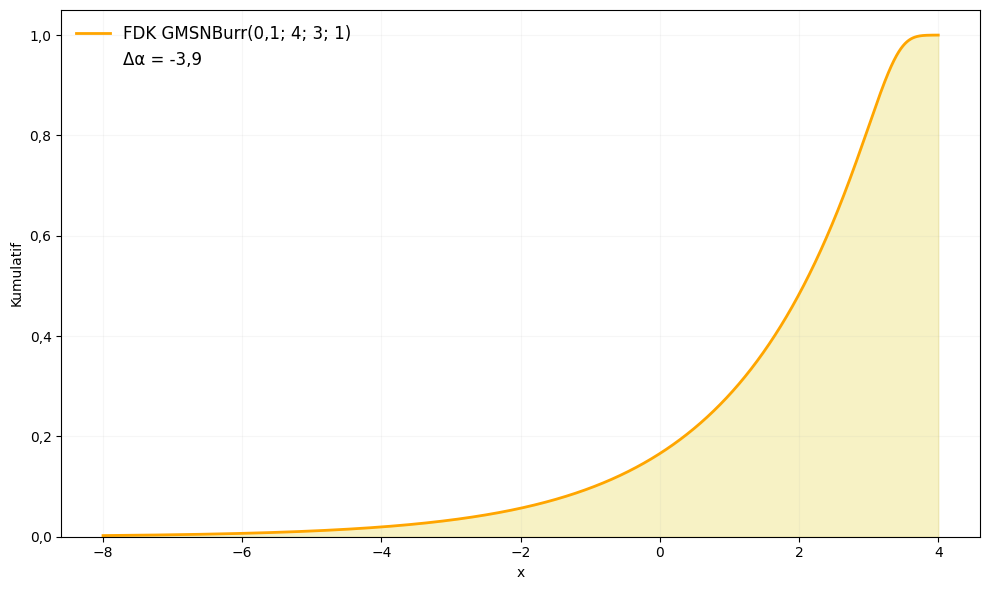

In [20]:
# Skenario Menceng Kiri
x = np.linspace(-8, 4, 10000)
alpha1, alpha2, mu, sigma = 0.1, 4, 3, 1
delta_alpha_cdf = alpha1 - alpha2
y = [math.exp(rv_logcdf_fn(x, mu, sigma, alpha1, alpha2)) for x in x]

# visualisasi dengan plot
with plt.style.context('fast'):
  plt.figure(figsize=(10,6))
  plt.plot(x, y, label=f'FDK GMSNBurr({alpha1}; {alpha2}; {mu}; {sigma})'.replace('.',','), color='orange',linewidth=2.0)
  plt.plot([], [], ' ', label=f'\u0394\u03B1 = {delta_alpha_cdf}'.replace('.',','))
  plt.xlabel("x")
  plt.ylabel("Kumulatif")
  plt.legend(loc="upper left", fontsize=12, frameon=False)
  plt.grid(alpha=0.1)
  plt.fill_between(x, y, color="khaki", alpha=0.5)
  plt.ylim(bottom=0)
  plt.tight_layout()
  comma_formatter = FuncFormatter(lambda x, _: f"{x:.1f}".replace('.', ','))
  plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.show()

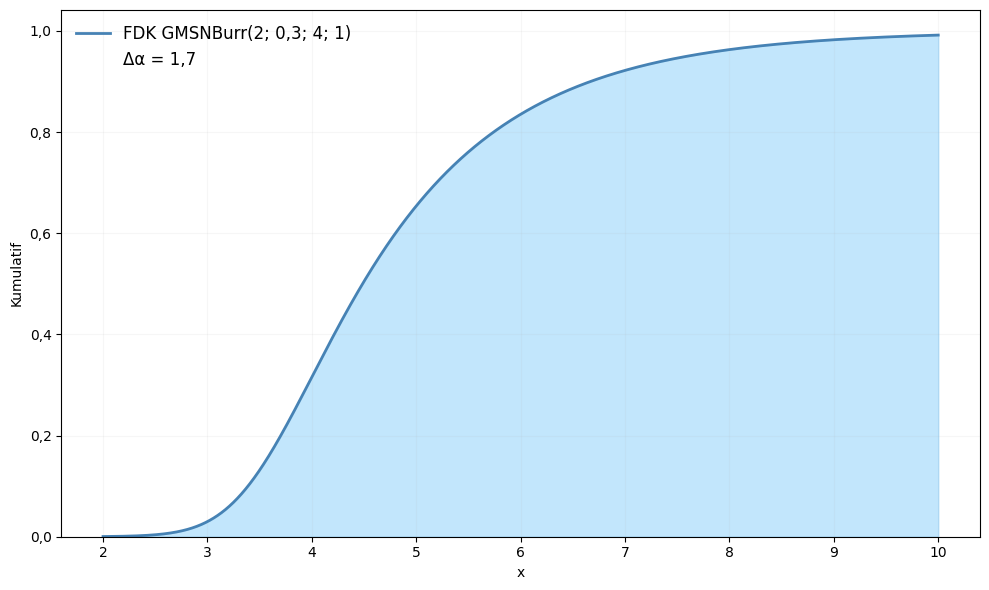

In [36]:
# Skenario Menceng Kanan
x = np.linspace(2, 10, 10000)
alpha1, alpha2, mu, sigma = 2, 0.3, 4, 1
delta_alpha_cdf = alpha1 - alpha2
y = [math.exp(rv_logcdf_fn(x, mu, sigma, alpha1, alpha2)) for x in x]

# visualisasi dengan plot
with plt.style.context('fast'):
  plt.figure(figsize=(10,6))
  plt.plot(x, y, label=f'FDK GMSNBurr({alpha1}; {alpha2}; {mu}; {sigma})'.replace('.',','), color='steelblue',linewidth=2.0)
  plt.plot([], [], ' ', label=f'\u0394\u03B1 = {delta_alpha_cdf}'.replace('.',','))
  plt.xlabel("x")
  plt.ylabel("Kumulatif")
  plt.legend(loc="upper left", fontsize=12, frameon=False)
  plt.grid(alpha=0.1)
  plt.fill_between(x, y, color="lightskyblue", alpha=0.5)
  plt.ylim(bottom=0)
  plt.tight_layout()
  comma_formatter_1 = FuncFormatter(lambda x, _: f"{x:.1f}".replace('.', ','))
  plt.gca().yaxis.set_major_formatter(comma_formatter_1)
plt.show()

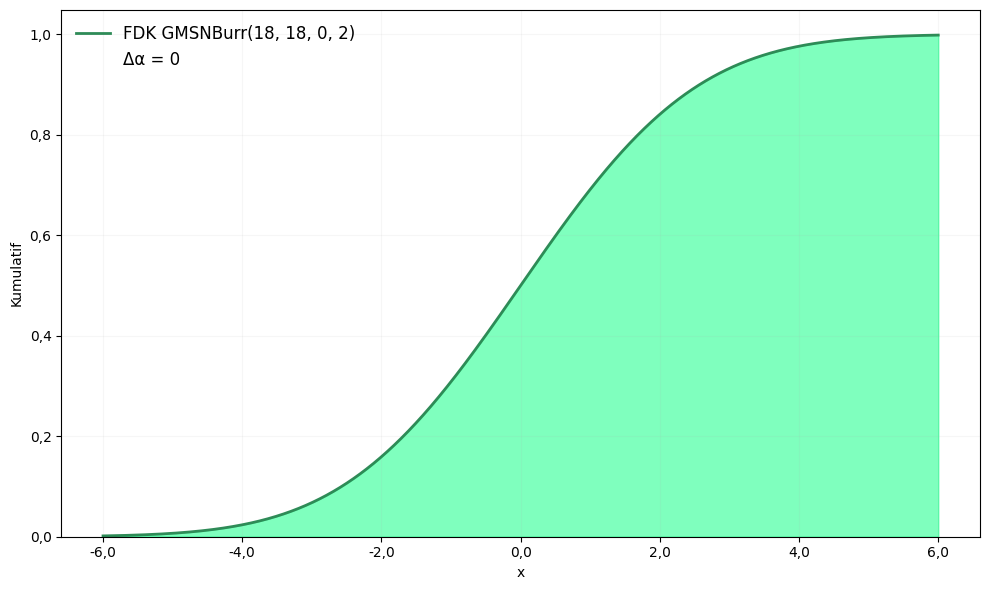

In [39]:
# Skenario Simetris
x = np.linspace(-6, 6, 10000)
alpha1, alpha2, mu, sigma = 18, 18, 0, 2
delta_alpha_cdf = alpha1 - alpha2
y = [math.exp(rv_logcdf_fn(x, mu, sigma, alpha1, alpha2)) for x in x]

# visualisasi dengan plot
with plt.style.context('fast'):
  plt.figure(figsize=(10,6))
  plt.plot(x, y, label=f'FDK GMSNBurr({alpha1}, {alpha2}, {mu}, {sigma})'.replace('.',','), color='seagreen',linewidth=2.0)
  plt.plot([], [], ' ', label=f'\u0394\u03B1 = {delta_alpha_cdf}'.replace('.',','))
  plt.xlabel("x")
  plt.ylabel("Kumulatif")
  plt.legend(loc="upper left", fontsize=12, frameon=False)
  plt.grid(alpha=0.1)
  plt.fill_between(x, y, color="springgreen", alpha=0.5)
  plt.ylim(bottom=0)
  plt.tight_layout()
  comma_formatter = FuncFormatter(lambda x, _: f"{x:.1f}".replace('.', ','))
  plt.gca().xaxis.set_major_formatter(comma_formatter)
  plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.show()

### Pembangkit Bilangan Acak GMSNBurr

#### Skenario Menceng Kiri

In [13]:
# parameter GMSNBurr(0,1; 4; 3; 1)
alpha1, alpha2, mu, sigma = 0.1, 4, 3, 1
delta_alpha_1 = alpha1 - alpha2
delta_alpha_1_str = str(round(delta_alpha_1, 1)).replace('.', ',')

# data random
rv = GMSNBurr.dist(mu, sigma, alpha1, alpha2)
datarandom1 = pm.draw(rv, draws=10000, random_seed=42)

# min dan max data random
min_datarandom1 = np.min(datarandom1)
max_datarandom1 = np.max(datarandom1)

# cek valid
cek_valid = np.all(np.isfinite(datarandom1)) and not np.all(np.isnan(datarandom1))
print(f'Valid (numerik & bukan NaN): {cek_valid}')

Valid (numerik & bukan NaN): True


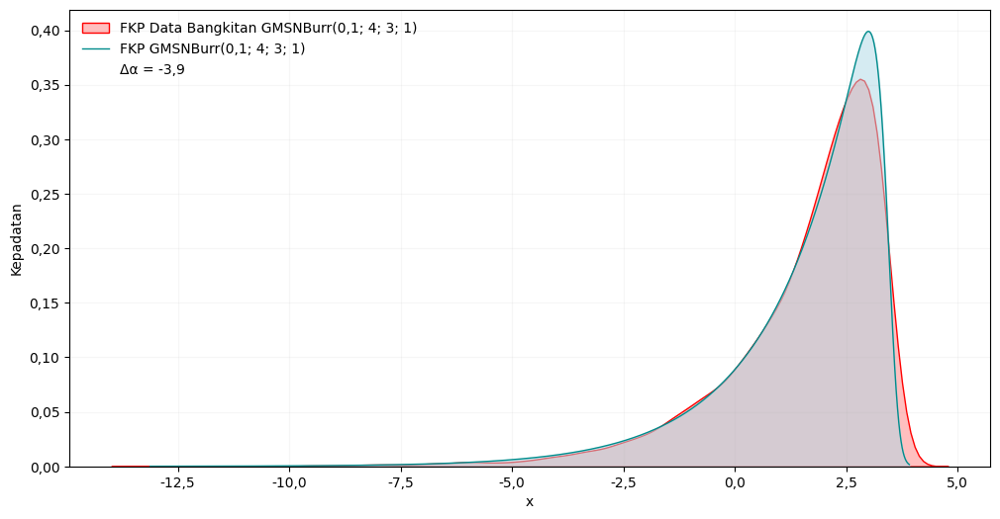

In [14]:
# visualisasi
fig = plt.subplots(figsize=(12,6))

x = np.linspace(min_datarandom1, max_datarandom1, 10000)
y = [np.exp(rv_logp_fn(value=x, mu=3, sigma=1, alpha1=0.1, alpha2=4)) for x in x]

# data bangkitan
sns.kdeplot(datarandom1, fill=True, color="red", label=f'FKP Data Bangkitan GMSNBurr({alpha1}; {alpha2}; {mu}; {sigma})'.replace('.',','))

# visualisasi
with plt.style.context('seaborn-v0_8-bright'):
  plt.plot(x, y, label=f'FKP GMSNBurr({alpha1}; {alpha2}; {mu}; {sigma})'.replace('.',','), color='darkcyan', linewidth=1.0)
  plt.plot([], [], ' ', label=f'\u0394\u03B1 = {delta_alpha_1_str}')
  plt.xlabel("x")
  plt.ylabel("Kepadatan")
  plt.fill_between(x, y, color="lightblue", alpha=0.5)
  plt.grid(alpha=0.1)
  comma_formatter_2 = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
  comma_formatter_1 = FuncFormatter(lambda x, _: f"{x:.1f}".replace('.', ','))
  plt.gca().xaxis.set_major_formatter(comma_formatter_1)
  plt.gca().yaxis.set_major_formatter(comma_formatter_2)
  plt.legend(loc="upper left", fontsize=10, frameon=False)
plt.show()

#### Skenario Menceng Kanan

In [8]:
# parameter GMSNBurr(2; 0,3; 4; 1)
alpha1, alpha2, mu, sigma = 2, 0.3, 4, 1
delta_alpha_2 = alpha1 - alpha2
delta_alpha_2_str = str(round(delta_alpha_2, 1)).replace('.', ',')

# data random
rv = GMSNBurr.dist(mu, sigma, alpha1, alpha2)
datarandom2 = pm.draw(rv, draws=10000, random_seed=42)

# min dan max data random
min_datarandom2 = np.min(datarandom2)
max_datarandom2 = np.max(datarandom2)

# cek valid
cek_valid = np.all(np.isfinite(datarandom2)) and not np.all(np.isnan(datarandom2))
print(f'Valid (numerik & bukan NaN): {cek_valid}')

Valid (numerik & bukan NaN): True


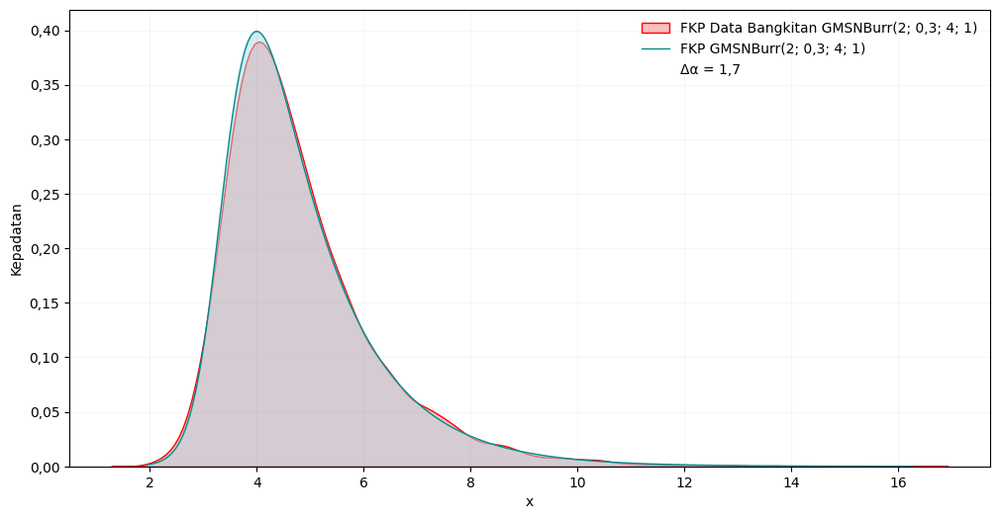

In [25]:
# visualisasi
fig = plt.subplots(figsize=(12,6))

x = np.linspace(min_datarandom2, max_datarandom2, 10000)
y = [np.exp(rv_logp_fn(value=x, mu=4, sigma=1, alpha1=2, alpha2=0.3)) for x in x]

# data bangkitan
sns.kdeplot(datarandom2, fill=True, color="red", label=f'FKP Data Bangkitan GMSNBurr({alpha1}; {alpha2}; {mu}; {sigma})'.replace('.',','))

# visualisasi
with plt.style.context('seaborn-v0_8-bright'):
  plt.plot(x, y, label=f'FKP GMSNBurr({alpha1}; {alpha2}; {mu}; {sigma})'.replace('.',','), color='darkcyan', linewidth=1.0)
  plt.plot([], [], ' ', label=f'\u0394\u03B1 = {delta_alpha_2_str}')
  plt.xlabel("x")
  plt.ylabel("Kepadatan")
  plt.fill_between(x, y, color="lightblue", alpha=0.5)
  plt.grid(alpha=0.1)
  comma_formatter_2 = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
  plt.gca().yaxis.set_major_formatter(comma_formatter_2)
  plt.legend(loc="upper right", fontsize=10, frameon=False)
plt.show()

#### Skenario Simetris

In [9]:
# parameter GMSNBurr(18; 18; 0; 2)
alpha1, alpha2, mu, sigma = 18, 18, 0, 2
delta_alpha_3 = alpha1 - alpha2
delta_alpha_3_str = str(round(delta_alpha_3, 1)).replace('.', ',')

# data random
rv = GMSNBurr.dist(mu, sigma, alpha1, alpha2)
datarandom3 = pm.draw(rv, draws=10000, random_seed=42)

# min dan max data random
min_datarandom3 = np.min(datarandom3)
max_datarandom3 = np.max(datarandom3)

# cek valid
cek_valid = np.all(np.isfinite(datarandom3)) and not np.all(np.isnan(datarandom3))
print(f'Valid (numerik & bukan NaN): {cek_valid}')

Valid (numerik & bukan NaN): True


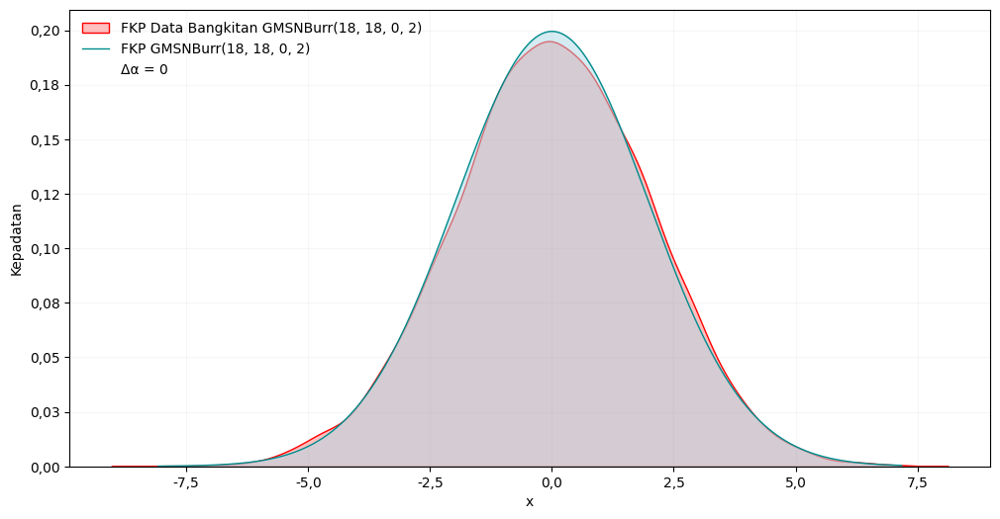

In [30]:
# visualisasi
fig = plt.subplots(figsize=(12,6))

x = np.linspace(min_datarandom3, max_datarandom3, 10000)
y = [np.exp(rv_logp_fn(value=x, mu=0, sigma=2, alpha1=18, alpha2=18)) for x in x]

# data bangkitan
sns.kdeplot(datarandom3, fill=True, color="red", label=f'FKP Data Bangkitan GMSNBurr({alpha1}, {alpha2}, {mu}, {sigma})'.replace('.',','))

# visualisasi
with plt.style.context('seaborn-v0_8-bright'):
  plt.plot(x, y, label=f'FKP GMSNBurr({alpha1}, {alpha2}, {mu}, {sigma})'.replace('.',','), color='darkcyan', linewidth=1.0)
  plt.plot([], [], ' ', label=f'\u0394\u03B1 = {delta_alpha_3_str}')
  plt.xlabel("x")
  plt.ylabel("Kepadatan")
  plt.fill_between(x, y, color="lightblue", alpha=0.5)
  plt.grid(alpha=0.1)
  comma_formatter_2 = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
  comma_formatter_1 = FuncFormatter(lambda x, _: f"{x:.1f}".replace('.', ','))
  plt.gca().xaxis.set_major_formatter(comma_formatter_1)
  plt.gca().yaxis.set_major_formatter(comma_formatter_2)
  plt.legend(loc="upper left", fontsize=10, frameon=False)
plt.show()

## Conceptual Model Validation

### (1) Definisi 3.2.2

$$\int_{-\infty}^{\infty} f(x) \, dx = 1$$

In [33]:
# misal pada GMSNBurr(2, 2, 0, 1)
pdf, error = quad(lambda x: np.exp(rv_logp_fn(value=x, mu=0.0, sigma=1.0, alpha1=2, alpha2=2)), -np.inf, np.inf)
print(f'Hasil integral = {pdf:.5f}')
print(f'Error = {error:5f}')

Hasil integral = 1.00000
Error = 0.000000


### (2) Teorema 3.3.1

Jika $x_1 < x_2$, maka $F(x_1) \leq F(x_2)$


In [40]:
# misal pada GMSNBurr(2, 2, 0, 1) dengan x1 = 4 dan x2 = 5
f4 = [math.exp(rv_logcdf_fn(value=4, mu=0, sigma=1, alpha1=2, alpha2=2))]
f5 = [math.exp(rv_logcdf_fn(value=5, mu=0, sigma=1, alpha1=2, alpha2=2))]
is_increasing = f5[0] > f4[0]
print(f'Hasil F(4) = {f4}')
print(f'Hasil F(5) = {f5}')
print(f'F(5) > F(4) : {is_increasing}')

Hasil F(4) = [0.9994183851496602]
Hasil F(5) = [0.9999290028905682]
F(5) > F(4) : True


### (3) Teorema 3.3.1

$$\lim_{x \to \infty} F(x) = 1 \quad \text{dan} \quad \lim_{x \to -\infty} F(x) = 0$$

In [ ]:
# misal pada GMSNBurr(2, 2, 0, 1) dengan x1 = inf dan x2 = -inf
nilai_inf = np.inf
nilai_minf = -np.inf
finf = [math.exp(rv_logcdf_fn(value=nilai_inf, mu=0, sigma=1, alpha1=2, alpha2=2))]
fminf = [math.exp(rv_logcdf_fn(value=nilai_minf, mu=0, sigma=1, alpha1=2, alpha2=2))]
print(f'Hasil F(inf)= {finf}')
print(f'Hasil F(-inf) = {fminf}')

Hasil F(inf)= [1.0]
Hasil F(-inf) = [0.0]


### (4) Teorema 3.3.3

$$\int_a^b f(x) \, dx = F(b) - F(a)$$

In [19]:
# misal pada GMSNBurr(0, 1, 2, 2) dengan b = 5 dan a = 4
pdf, error = quad(lambda x: np.exp(rv_logp_fn(value=x, mu=0.0, sigma=1.0, alpha1=2, alpha2=2)), 4, 5)
print(f'Error PDF = {error}')
print(f'Hasil integral PDF = {pdf}')

log_cdf_result4 = rv_logcdf_fn(4, 0, 1, 2, 2)
log_cdf_result5 = rv_logcdf_fn(5, 0, 1, 2, 2)
cdf_4 = np.exp(log_cdf_result4)
cdf_5 = np.exp(log_cdf_result5)
cdf_result = cdf_5 - cdf_4

print(f'Hasil CDF = {cdf_result}')

Error PDF = 5.668995727382296e-18
Hasil integral PDF = 0.0005106177409080769
Hasil CDF = 0.0005106177409079926


### (5) Teorema 3.3.5

$$P(X \leq x) = \int_{-\infty}^{x} f(t) \, dt$$

In [18]:
# misal pada GMSNBurr(0, 1, 2, 2) nilai CDF untuk x <= 4
pdf, error = quad(lambda x: np.exp(rv_logp_fn(value=x, mu=0.0, sigma=1.0, alpha1=2, alpha2=2)), -np.inf, 4)
print(f'Error PDF = {error}')
print(f'Hasil integral PDF = {pdf}')

log_cdf_result = rv_logcdf_fn(4, 0, 1, 2, 2)
cdf_result = np.exp(log_cdf_result)

print(f'Hasil CDF = {cdf_result}')

Error PDF = 4.40153188934908e-09
Hasil integral PDF = 0.9994183851496603
Hasil CDF = 0.9994183851496602


### (6) Definisi 4.1.3

$$E[X] = \int_{-\infty}^{\infty} x f(x) \, dx$$

In [ ]:
# misal pada GMSNBurr(4, 1, 2, 2)
# hitung integral manual komponen fkp
result, error = quad(lambda x: x*(np.exp(rv_logp_fn(value=x, mu=4, sigma=1.0, alpha1=2, alpha2=2))), -np.inf, np.inf)
print(f'Error = {error}')
print(f'Hasil integral = {result}')

# menggunakan fungsi moment yang sudah dibangun
mu = at.as_tensor_variable(4)
sigma = at.as_tensor_variable(1.0)
alpha1 = at.as_tensor_variable(2.0)
alpha2 = at.as_tensor_variable(2.0)
size = (1,)

# hitung moment
moment_gmsnburr_valid = GMSNBurr.moment(None, size, mu, sigma, alpha1, alpha2)

# nilai moment
moment_value = moment_gmsnburr_valid.eval().item()
print(f'Hasil moment = {moment_value}')

Error = 2.9557159434443012e-08
Hasil integral = 4.000000000000002
Hasil moment = 4.0


### (7) Definisi 3.3.4

$$P(X \leq Q_p) = p$$

In [42]:
# misal mencari kuantil 0,9 GMSNBurr(0, 1, 2, 2)
mu, sigma, alpha1, alpha2, q = 0, 1, 2, 2, 0.9

# nilai kuantil 0,9
quantile_90 = GMSNBurr.quantile(q, mu, sigma, alpha1, alpha2)
print(f'Nilai Quantile ke-90 = {quantile_90}')

# hasil kuantil dimasukkan ke dalam CDF
cdf_quantile90 = np.exp(rv_logcdf_fn(quantile_90, mu, sigma, alpha1, alpha2))
print(f'Nilai CDF Quantile ke-90 = {cdf_quantile90}')

Nilai Quantile ke-90 = 1.3279680383214751
Nilai CDF Quantile ke-90 = 0.9


### (8) Teorema 6.2.4

$$P\left( \lim_{n \to \infty} \overline{X}_n = \mu \right) = 1$$

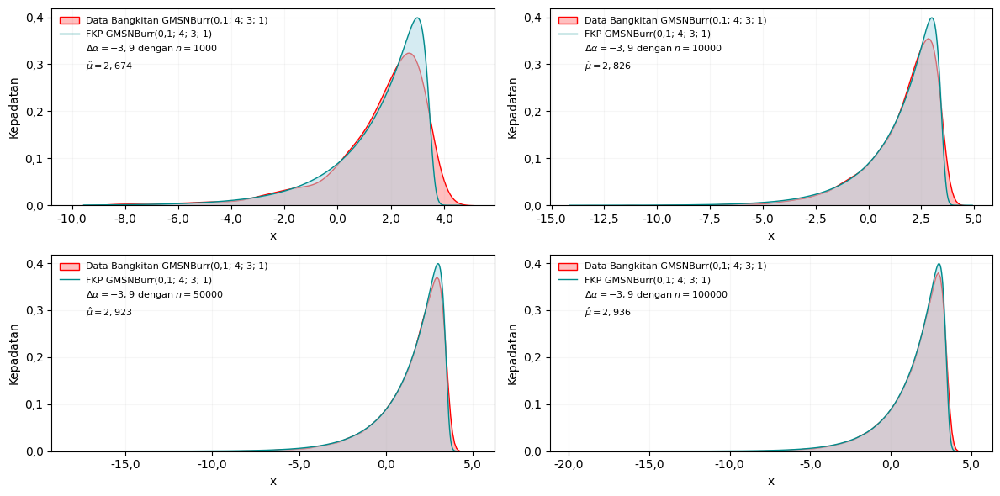

In [43]:
# nilai parameter GMSNBurr(3; 1; 0,1; 4)
alpha1, alpha2, mu, sigma = 0.1, 4, 3, 1
delta_alpha_comp = alpha1 - alpha2

# data random
rv = GMSNBurr.dist(mu, sigma, alpha1, alpha2)
datarandomcomp1 = pm.draw(rv, draws=1000, random_seed=42)
datarandomcomp2 = pm.draw(rv, draws=10000, random_seed=42)
datarandomcomp3 = pm.draw(rv, draws=50000, random_seed=42)
datarandomcomp4 = pm.draw(rv, draws=100000, random_seed=42)

# min dan max data random
min_datarandomcomp1, max_datarandomcomp1 = np.min(datarandomcomp1), np.max(datarandomcomp1)
min_datarandomcomp2, max_datarandomcomp2 = np.min(datarandomcomp2), np.max(datarandomcomp2)
min_datarandomcomp3, max_datarandomcomp3 = np.min(datarandomcomp3), np.max(datarandomcomp3)
min_datarandomcomp4, max_datarandomcomp4 = np.min(datarandomcomp4), np.max(datarandomcomp4)

fig, axes = plt.subplots(2, 2, figsize=(12, 6))
for i, ax in enumerate(axes.flatten()):
  if i == 0:
      datarandom = datarandomcomp1
      min_datarandom, max_datarandom = min_datarandomcomp1, max_datarandomcomp1
      size = 1000
  elif i == 1:
      datarandom = datarandomcomp2
      min_datarandom, max_datarandom = min_datarandomcomp2, max_datarandomcomp2
      size = 10000
  elif i == 2:
      datarandom = datarandomcomp3
      min_datarandom, max_datarandom = min_datarandomcomp3, max_datarandomcomp3
      size = 50000
  else:
      datarandom = datarandomcomp4
      min_datarandom, max_datarandom = min_datarandomcomp4, max_datarandomcomp4
      size = 100000

  x = np.linspace(min_datarandom - 1, max_datarandom + 1, 10000)
  y = [np.exp(rv_logp_fn(value=x_value, mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2)) for x_value in x]
  sns.kdeplot(datarandom, fill=True, color="red", label=f'Data Bangkitan GMSNBurr({alpha1}; {alpha2}; {mu}; {sigma})'.replace('.', ','), ax=ax)
  kde = gaussian_kde(datarandom)
  x_vals = np.linspace(min_datarandom, max_datarandom, 10000)
  y_vals = kde(x_vals)
  x_puncak_kde = x_vals[np.argmax(y_vals)]
  with plt.style.context('seaborn-v0_8-bright'):
      ax.plot(x, y, label=f'FKP GMSNBurr({alpha1}; {alpha2}; {mu}; {sigma})'.replace('.', ','), color='darkcyan', linewidth=1.0)
      ax.plot([], [], ' ', label=rf'$\Delta\alpha = {delta_alpha_comp}$ dengan $n = {size}$'.replace('.', ','))
      ax.plot([], [], " ", label=rf'$\hat{{\mu}} = {x_puncak_kde:.3f}$'.replace('.', ',')) 
      ax.set_xlabel("x")
      ax.set_ylabel("Kepadatan")
      comma_formatter_1 = FuncFormatter(lambda x, _: f"{x:.1f}".replace('.', ','))
      ax.xaxis.set_major_formatter(comma_formatter_1)
      ax.yaxis.set_major_formatter(comma_formatter_1)
      ax.fill_between(x, y, color="lightblue", alpha=0.5)
      ax.legend(loc="upper left", fontsize=8, frameon=False)
      ax.grid(alpha=0.1)
plt.tight_layout()
plt.show()

### (9) FKP GMSNBurr

A. FKP GMSNBurr dengan FKP MSNBurr-IIa

$$f_{\text{GMSNBurr}}(x;\alpha_1 = 1,\alpha_2,\mu,\sigma) = f_{\text{MSNBurr-IIa}}(x;\alpha = \alpha_2,\mu,\sigma)$$

In [44]:
# fungsi FKP MSNBurr-IIa
def logp_msnburriia(y, mu, sigma, alpha, **kwargs):
  omega = (1 + (1 / alpha)) ** (alpha + 1) / np.sqrt(2 * np.pi)
  epart = omega / sigma * (y - mu) - at.log(alpha)
  logpdf = at.log(omega) - at.log(sigma) + (omega / sigma * (y - mu)) - ((alpha + 1) * at.log1pexp(epart))
  return check_parameters(logpdf, alpha > 0, sigma > 0, msg=f"alpha must more than 0, sigma must more than 0")

# misal GMSNBurr(1, 2, 0, 1) dan MSNBurr-IIa(2, 0, 1) pada x = 4
x, alpha1, alpha2, mu, sigma = 4, 1, 2, 0, 1

# FKP
y_gmsnburr1 = np.exp(rv_logp_fn(value=x, mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2)) # GMSNBurr
y_msnburriia = np.exp(logp_msnburriia(y=x, mu=mu, sigma=sigma, alpha=alpha2)) # MSNBurr-IIa

# output
print(f"Nilai GMSNBurr = {y_gmsnburr1:.10f}")
print(f"Nilai MSNBurr-IIa = {y_msnburriia.eval():.10f}")

Nilai GMSNBurr = 0.0002199947
Nilai MSNBurr-IIa = 0.0002199947


B. FKP GMSNBurr dengan FKP MSNBurr

$$f_{\text{GMSNBurr}}(x;\alpha_1,\alpha_2 = 1,\mu,\sigma) = f_{\text{MSNBurr}}(x;\alpha = \alpha_1,\mu,\sigma)$$

In [45]:
# fungsi FKP MSNBurr
def logp_msnburr(y, mu, sigma, alpha):
    omega = (1 + (1 / alpha))**(alpha + 1) / np.sqrt(2 * np.pi)
    epart = -at.log(alpha) - (omega / sigma * (y - mu))
    logpdf = at.switch(at.eq(y, -np.inf), -np.inf,
        at.log(omega) - at.log(sigma) - (omega / sigma * (y - mu)) - ((alpha + 1) * at.log1pexp(epart)))
    return check_parameters(logpdf, alpha > 0, sigma > 0, msg=f"alpha must be more than 0, sigma must be more than 0")

# misal GMSNBurr(2, 1, 0, 1) dan MSNBurr(2, 0, 1) pada x = 4
x, alpha1, alpha2, mu, sigma = 4, 2, 1, 0, 1

# FKP
y_gmsnburr2 = np.exp(rv_logp_fn(value=x, mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2)) # GMSNBurr
y_msnburr = np.exp(logp_msnburr(y=x, mu=mu, sigma=sigma, alpha=alpha1)) # MSNBurr

# output
print(f"Nilai GMSNBurr = {y_gmsnburr2:.10f}")
print(f"Nilai MSNBurr = {y_msnburr.eval():.10f}")

Nilai GMSNBurr = 0.0061265197
Nilai MSNBurr = 0.0061265197


### (10) FDK GMSNBurr

A. FDK GMSNBurr dengan FDK MSNBurr-IIa

$F_{\text{GMSNBurr}}(x;\alpha_1 = 1,\alpha_2,\mu,\sigma) = F_{\text{MSNBurr-IIa}}(x;\alpha = \alpha_2,\mu,\sigma)$

In [10]:
# fungsi FDK MSNBurr-IIa
def logcdf_msnburriia(y, mu, sigma, alpha):
    omega = (1 / np.sqrt(2 * np.pi)) * (1 + 1 / alpha) ** (alpha + 1)
    zoa = omega * ((y - mu) / sigma) - np.log(alpha)
    log1pexp = np.where(zoa > 0, zoa + np.log1p(np.exp(-zoa)), np.log1p(np.exp(zoa)))
    qs = -alpha * log1pexp
    log1mexp = np.where(qs > np.log(2), np.log1p(-np.exp(qs)), np.log(-np.expm1(qs)))
    return np.sum(log1mexp)

# misal GMSNBurr(1, 2, 0, 1) dan MSNBurr-IIa(2, 0, 1) pada x = 4
x, alpha1, alpha2, mu, sigma = 4, 1, 2, 0, 1

# FDK
y_cdfgmsnburr2 = np.exp(rv_logcdf_fn(value=x, mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2)) # GMSNBurr
y_cdfmsnburriia = np.exp(logcdf_msnburriia(y=x, mu=mu, sigma=sigma, alpha=alpha2)) # MSNBurr-IIa

# output
print(f"Nilai GMSNBurr = {y_cdfgmsnburr2:.10f}")
print(f"Nilai MSNBurr-IIa = {y_cdfmsnburriia:.10f}")

Nilai GMSNBurr = 0.9999175559
Nilai MSNBurr-IIa = 0.9999175559


B. FDK GMSNBurr dengan FDK MSNBurr

$F_{\text{GMSNBurr}}(x;\alpha_1,\alpha_2 = 1,\mu,\sigma) = F_{\text{MSNBurr}}(x;\alpha = \alpha_1,\mu,\sigma)$

In [7]:
# fungsi FDK MSNBurr
def logcdf_msnburr(y, mu, sigma, alpha):
  omega = (1+(1/alpha))**(alpha+1)/np.sqrt(2*np.pi)
  epart = -np.log(alpha) - (omega/sigma*(y-mu))
  logcdf = -alpha*np.log1p(np.exp(epart))
  return logcdf

# misal GMSNBurr(2, 1, 0, 1) dan MSNBurr(1, 0, 1) pada x = 4
x, alpha1, alpha2, mu, sigma = 4, 2, 1, 0, 1

# FDK
y_cdfgmsnburr1 = math.exp(rv_logcdf_fn(value=x, mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2)) # GMSNBurr
y_cdfmsnburr = np.exp(logcdf_msnburr(y=x, mu=mu, sigma=sigma, alpha=alpha1)) # MSNBurr

# output
print(f"Nilai GMSNBurr = {y_cdfgmsnburr1:.10f}")
print(f"Nilai MSNBurr = {y_cdfmsnburr:.10f}")

Nilai GMSNBurr = 0.9954341581
Nilai MSNBurr = 0.9954341581


## Operational Validity

### Estimasi Parameter

#### Pemilihan Sampler

Uji coba sampler pertama

In [10]:
sampler_kwargs1 = {
    "chains": 4,
    "cores": 4,
    "return_inferencedata": True,
    "random_seed": 42,
    "tune": 1000,
    "draws": 1000,
    "nuts_sampler_kwargs":{"target_accept": 0.9}
}

In [11]:
with pm.Model() as modelSamp1:
  mu = pm.Normal("mu", mu=3, sigma=1)
  sigma = pm.HalfCauchy("sigma", beta=2)
  alpha1 = pm.Lognormal("alpha1", mu=-2, sigma=0.5)
  alpha2 = pm.Lognormal("alpha2", mu=1.3, sigma=0.5)
  y = GMSNBurr.main("GMSNBurrDist", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=datarandom1)
  traceSamp1 = pm.sample(**sampler_kwargs1)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 121 seconds.


In [12]:
summarySamp1 = az.summary(traceSamp1, round_to=3, hdi_prob=0.95)
summarySamp1

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,2.979,0.021,2.936,3.018,0.001,0.00,1212.720,1315.451,1.003
sigma,0.996,0.012,0.970,1.018,0.000,0.00,1352.625,1559.039,1.001
alpha1,0.109,0.009,0.091,0.127,0.000,0.00,1111.443,1269.007,1.001
alpha2,4.562,1.636,2.113,7.814,0.045,0.05,1276.795,1460.823,1.002


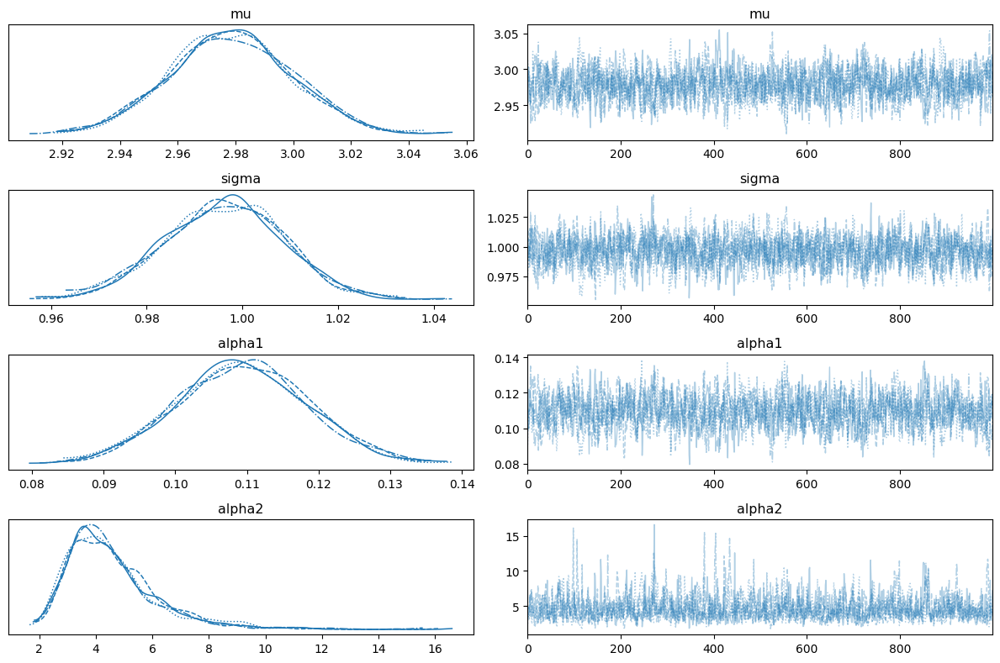

In [13]:
az.plot_trace(traceSamp1)
plt.tight_layout()
plt.show()

arviz - WARNING - Shape validation failed: input_shape: (4, 2), minimum_shape: (chains=2, draws=4)


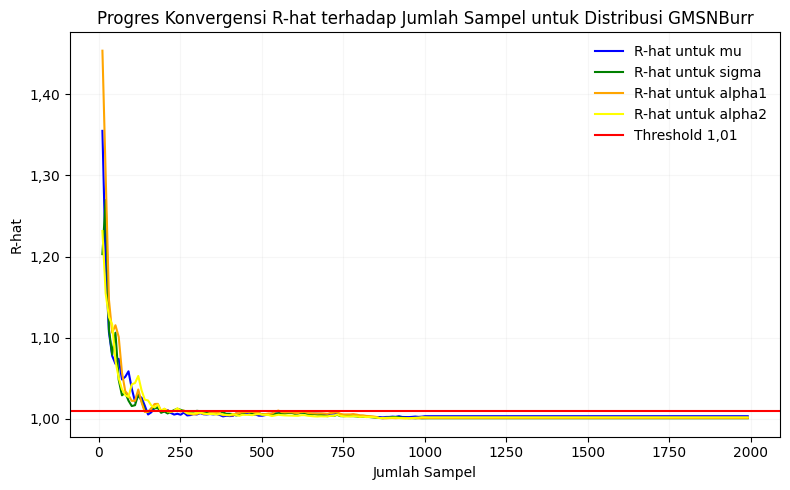

In [14]:
steps = range(1, 2001, 10)
mu_rhat_progress = []
sigma_rhat_progress = []
alpha1_rhat_progress = []
alpha2_rhat_progress = []

for step in steps:
    trace_subset = traceSamp1.sel(draw=slice(0, step))
    rhat = az.rhat(trace_subset)
    mu_rhat_progress.append(rhat["mu"].values)
    sigma_rhat_progress.append(rhat["sigma"].values)
    alpha1_rhat_progress.append(rhat["alpha1"].values)
    alpha2_rhat_progress.append(rhat["alpha2"].values)

# Plot gabungan R-hat untuk mu, sigma, alpha1, dan alpha2
plt.figure(figsize=(8, 5))
plt.plot(steps, mu_rhat_progress, label='R-hat untuk mu', color='blue')
plt.plot(steps, sigma_rhat_progress, label='R-hat untuk sigma', color='green')
plt.plot(steps, alpha1_rhat_progress, label='R-hat untuk alpha1', color='orange')
plt.plot(steps, alpha2_rhat_progress, label='R-hat untuk alpha2', color='yellow')
plt.axhline(1.01, color='red', label='Threshold 1,01')
plt.xlabel("Jumlah Sampel")
plt.ylabel("R-hat")
plt.title("Progres Konvergensi R-hat terhadap Jumlah Sampel untuk Distribusi GMSNBurr")
plt.legend(frameon=False)
plt.grid(alpha=0.1)
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.tight_layout()
plt.show()

Trace plot masih kurang konvergen: grafik belum halus dan masih cukup renggang, Rhat rata-rata berada di angka 1,004

Uji coba sampler kedua

In [15]:
sampler_kwargs2 = {
    "chains": 4,
    "cores": 4,
    "return_inferencedata": True,
    "random_seed": 42,
    "tune": 1000,
    "draws": 2000,
    "nuts_sampler_kwargs":{"target_accept": 0.9}
}

In [16]:
with pm.Model() as modelSamp2:
  mu = pm.Normal("mu", mu=3, sigma=1)
  sigma = pm.HalfCauchy("sigma", beta=2)
  alpha1 = pm.Lognormal("alpha1", mu=-2, sigma=0.5)
  alpha2 = pm.Lognormal("alpha2", mu=1.3, sigma=0.5)
  y = GMSNBurr.main("GMSNBurrDist", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=datarandom1)
  traceSamp2 = pm.sample(**sampler_kwargs2)
summarySamp2 = az.summary(traceSamp2, round_to=3, hdi_prob=0.95)
summarySamp2

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 173 seconds.


,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,2.979,0.021,2.940,3.020,0.000,0.000,2626.049,3112.342,1.001
sigma,0.996,0.012,0.971,1.020,0.000,0.000,2955.921,3442.360,1.000
alpha1,0.109,0.009,0.092,0.128,0.000,0.000,2410.243,2715.821,1.000
alpha2,4.553,1.637,2.065,7.761,0.031,0.037,2803.820,3721.099,1.001


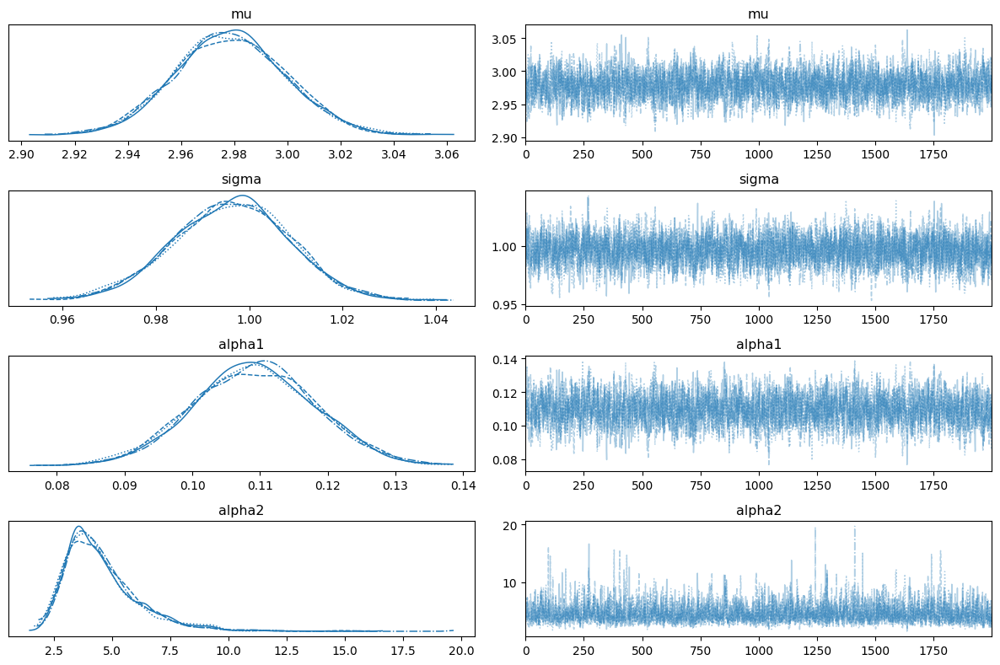

In [17]:
az.plot_trace(traceSamp2)
plt.tight_layout()
plt.show()

arviz - WARNING - Shape validation failed: input_shape: (4, 2), minimum_shape: (chains=2, draws=4)


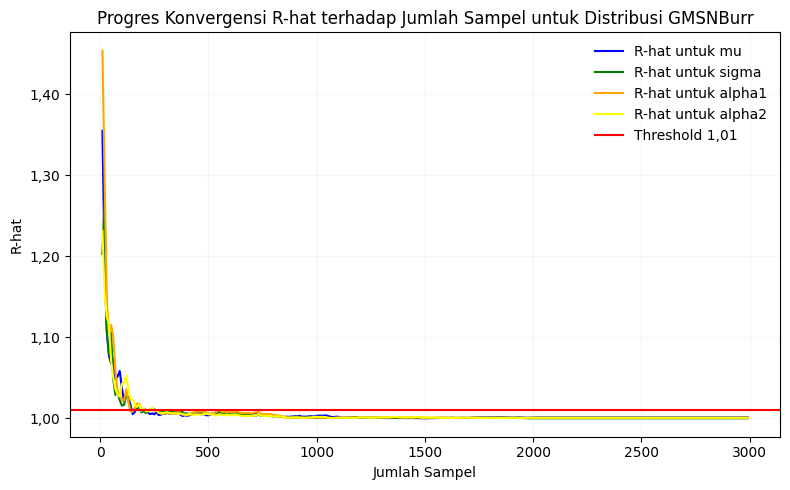

In [18]:
steps = range(1, 3001, 10)
mu_rhat_progress = []
sigma_rhat_progress = []
alpha1_rhat_progress = []
alpha2_rhat_progress = []

for step in steps:
    trace_subset = traceSamp2.sel(draw=slice(0, step))
    rhat = az.rhat(trace_subset)
    mu_rhat_progress.append(rhat["mu"].values)
    sigma_rhat_progress.append(rhat["sigma"].values)
    alpha1_rhat_progress.append(rhat["alpha1"].values)
    alpha2_rhat_progress.append(rhat["alpha2"].values)

# Plot gabungan R-hat untuk mu, sigma, alpha1, dan alpha2
plt.figure(figsize=(8, 5))
plt.plot(steps, mu_rhat_progress, label='R-hat untuk mu', color='blue')
plt.plot(steps, sigma_rhat_progress, label='R-hat untuk sigma', color='green')
plt.plot(steps, alpha1_rhat_progress, label='R-hat untuk alpha1', color='orange')
plt.plot(steps, alpha2_rhat_progress, label='R-hat untuk alpha2', color='yellow')
plt.axhline(1.01, color='red', label='Threshold 1,01')
plt.xlabel("Jumlah Sampel")
plt.ylabel("R-hat")
plt.title("Progres Konvergensi R-hat terhadap Jumlah Sampel untuk Distribusi GMSNBurr")
plt.legend(frameon=False)
plt.grid(alpha=0.1)
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.tight_layout()
plt.show()

Trace plot masih belum konvergen: grafik belum halus dan masih cukup renggang, Rhat menurun dengan rata-tara berada di angka 1,001

Uji coba sampler ketiga

In [20]:
sampler_kwargs3 = {
    "chains": 4,
    "cores": 4,
    "return_inferencedata": True,
    "random_seed": 42,
    "tune": 1000,
    "draws": 3000,
    "nuts_sampler_kwargs":{"target_accept": 0.9}
}

In [22]:
with pm.Model() as modelSamp3:
  mu = pm.Normal("mu", mu=3, sigma=1)
  sigma = pm.HalfCauchy("sigma", beta=2)
  alpha1 = pm.Lognormal("alpha1", mu=-2, sigma=0.5)
  alpha2 = pm.Lognormal("alpha2", mu=1.3, sigma=0.5)
  y = GMSNBurr.main("GMSNBurrDist", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=datarandom1)
  traceSamp3 = pm.sample(**sampler_kwargs3)
summarySamp3 = az.summary(traceSamp3, round_to=3, hdi_prob=0.95)
summarySamp3

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 1_000 tune and 3_000 draw iterations (4_000 + 12_000 draws total) took 225 seconds.


,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,2.979,0.021,2.940,3.020,0.000,0.000,3922.104,4600.949,1.001
sigma,0.996,0.012,0.971,1.020,0.000,0.000,4480.897,5035.471,1.000
alpha1,0.109,0.009,0.092,0.127,0.000,0.000,3526.130,4264.317,1.001
alpha2,4.523,1.627,2.190,7.827,0.025,0.033,4014.498,5230.961,1.001


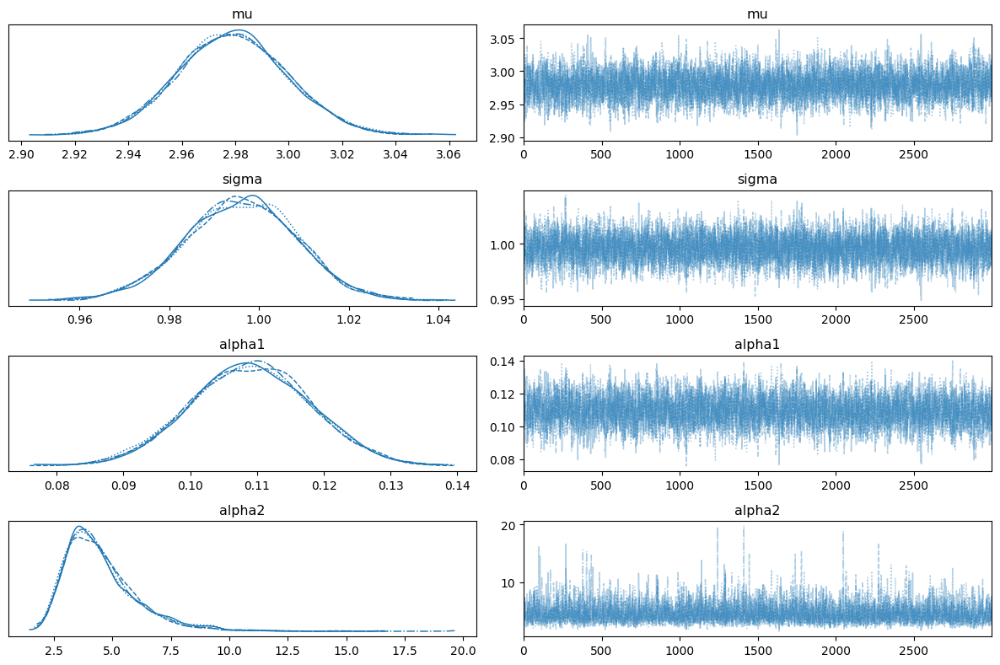

In [23]:
az.plot_trace(traceSamp3)
plt.tight_layout()
plt.show()

arviz - WARNING - Shape validation failed: input_shape: (4, 2), minimum_shape: (chains=2, draws=4)


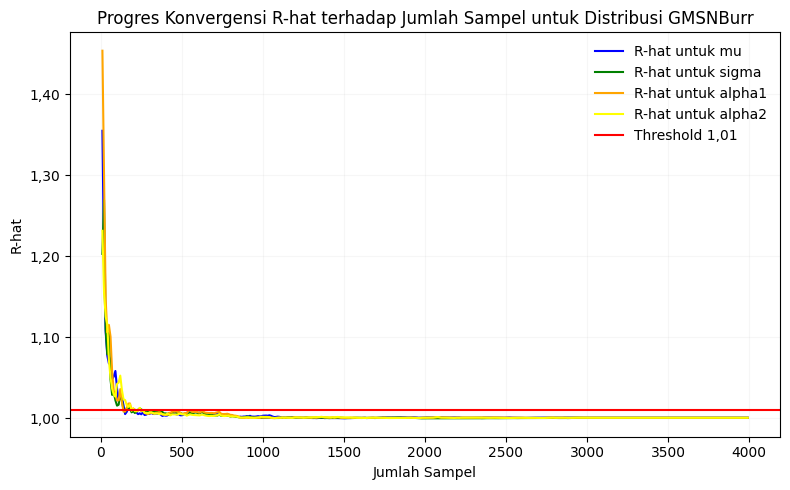

In [24]:
steps = range(1, 4001, 10)
mu_rhat_progress = []
sigma_rhat_progress = []
alpha1_rhat_progress = []
alpha2_rhat_progress = []

for step in steps:
    trace_subset = traceSamp3.sel(draw=slice(0, step))
    rhat = az.rhat(trace_subset)
    mu_rhat_progress.append(rhat["mu"].values)
    sigma_rhat_progress.append(rhat["sigma"].values)
    alpha1_rhat_progress.append(rhat["alpha1"].values)
    alpha2_rhat_progress.append(rhat["alpha2"].values)

# Plot gabungan R-hat untuk mu, sigma, alpha1, dan alpha2
plt.figure(figsize=(8, 5))
plt.plot(steps, mu_rhat_progress, label='R-hat untuk mu', color='blue')
plt.plot(steps, sigma_rhat_progress, label='R-hat untuk sigma', color='green')
plt.plot(steps, alpha1_rhat_progress, label='R-hat untuk alpha1', color='orange')
plt.plot(steps, alpha2_rhat_progress, label='R-hat untuk alpha2', color='yellow')
plt.axhline(1.01, color='red', label='Threshold 1,01')
plt.xlabel("Jumlah Sampel")
plt.ylabel("R-hat")
plt.title("Progres Konvergensi R-hat terhadap Jumlah Sampel untuk Distribusi GMSNBurr")
plt.legend(frameon=False)
plt.grid(alpha=0.1)
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.tight_layout()
plt.show()

Trace plot sudah mulai konvergen dengan grafik yang sudah mulai rapat, tetapi masih belum halus, Rhat untuk beberapa parameter bernilai 1,001 dan masih ada yang 1,002

Uji coba sampler keempat

In [14]:
sampler_kwargs4 = {
    "chains": 4,
    "cores": 4,
    "return_inferencedata": True,
    "random_seed": 42,
    "tune": 2000,
    "draws": 5000,
    "nuts_sampler_kwargs":{"target_accept": 0.9}
}

In [26]:
with pm.Model() as modelSamp4:
  mu = pm.Normal("mu", mu=3, sigma=1)
  sigma = pm.HalfCauchy("sigma", beta=2)
  alpha1 = pm.Lognormal("alpha1", mu=-2, sigma=0.5)
  alpha2 = pm.Lognormal("alpha2", mu=1.3, sigma=0.5)
  y = GMSNBurr.main("GMSNBurrDist", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=datarandom1)
  traceSamp4 = pm.sample(**sampler_kwargs4)
summarySamp4 = az.summary(traceSamp4, round_to=3, hdi_prob=0.95)
summarySamp4

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 356 seconds.


,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,2.980,0.020,2.940,3.020,0.000,0.000,6786.464,7828.078,1.0
sigma,0.996,0.012,0.971,1.020,0.000,0.000,7127.820,8132.078,1.0
alpha1,0.109,0.009,0.091,0.126,0.000,0.000,5907.859,6621.802,1.0
alpha2,4.499,1.594,2.060,7.626,0.019,0.022,6834.030,8556.331,1.0


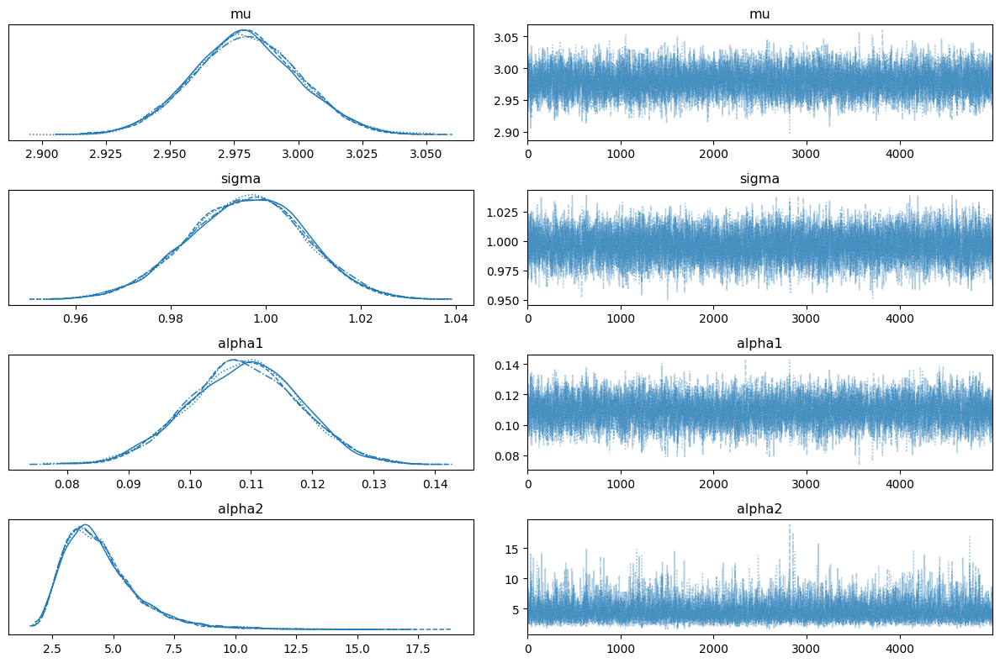

In [27]:
az.plot_trace(traceSamp4)
plt.tight_layout()
plt.show()

arviz - WARNING - Shape validation failed: input_shape: (4, 2), minimum_shape: (chains=2, draws=4)


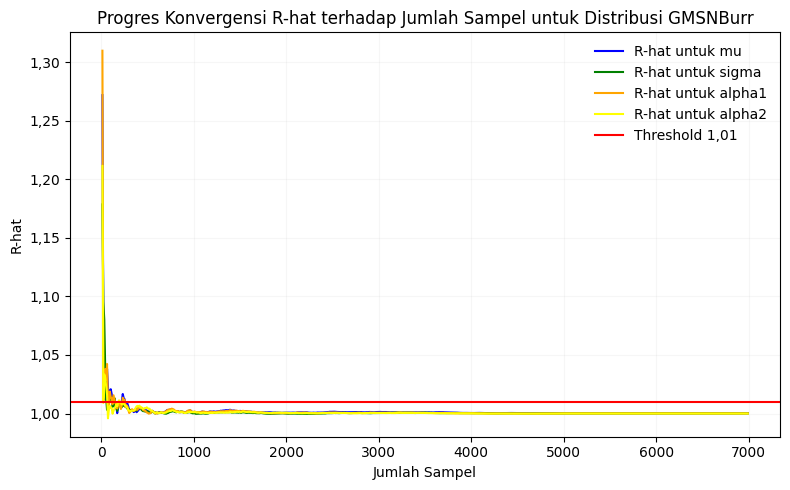

In [28]:
steps = range(1, 7001, 10)
mu_rhat_progress = []
sigma_rhat_progress = []
alpha1_rhat_progress = []
alpha2_rhat_progress = []

for step in steps:
    trace_subset = traceSamp4.sel(draw=slice(0, step))
    rhat = az.rhat(trace_subset)
    mu_rhat_progress.append(rhat["mu"].values)
    sigma_rhat_progress.append(rhat["sigma"].values)
    alpha1_rhat_progress.append(rhat["alpha1"].values)
    alpha2_rhat_progress.append(rhat["alpha2"].values)

# Plot gabungan R-hat untuk mu, sigma, alpha1, dan alpha2
plt.figure(figsize=(8, 5))
plt.plot(steps, mu_rhat_progress, label='R-hat untuk mu', color='blue')
plt.plot(steps, sigma_rhat_progress, label='R-hat untuk sigma', color='green')
plt.plot(steps, alpha1_rhat_progress, label='R-hat untuk alpha1', color='orange')
plt.plot(steps, alpha2_rhat_progress, label='R-hat untuk alpha2', color='yellow')
plt.axhline(1.01, color='red', label='Threshold 1,01')
plt.xlabel("Jumlah Sampel")
plt.ylabel("R-hat")
plt.title("Progres Konvergensi R-hat terhadap Jumlah Sampel untuk Distribusi GMSNBurr")
plt.legend(frameon=False)
plt.grid(alpha=0.1)
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.tight_layout()
plt.show()

Trace plot sudah konvergen dengan grafik sudah halus dan rapat, Rhat seluruh parameter berada di angka 1,0

In [15]:
sampler_kwargs = sampler_kwargs4

#### Proses Estimasi Parameter

##### Skenario Menceng Kiri

In [30]:
# estimasi
with pm.Model() as modelRandom1:
  # prior untuk parameter
  mu = pm.Normal("mu", mu=3, sigma=1)
  sigma = pm.HalfCauchy("sigma", beta=2)
  alpha1 = pm.Lognormal("alpha1", mu=-2, sigma=0.5)
  alpha2 = pm.Lognormal("alpha2", mu=1.3, sigma=0.5)

  # likelihood
  y = GMSNBurr.main("GMSNBurrDist", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=datarandom1)

  # posterior
  traceRandom1 = pm.sample(**sampler_kwargs)

# summary
summaryRandom1 = az.summary(traceRandom1, round_to=3, hdi_prob=0.95)
summaryRandom1

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 436 seconds.


,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,2.980,0.020,2.940,3.020,0.000,0.000,6786.464,7828.078,1.0
sigma,0.996,0.012,0.971,1.020,0.000,0.000,7127.820,8132.078,1.0
alpha1,0.109,0.009,0.091,0.126,0.000,0.000,5907.859,6621.802,1.0
alpha2,4.499,1.594,2.060,7.626,0.019,0.022,6834.030,8556.331,1.0


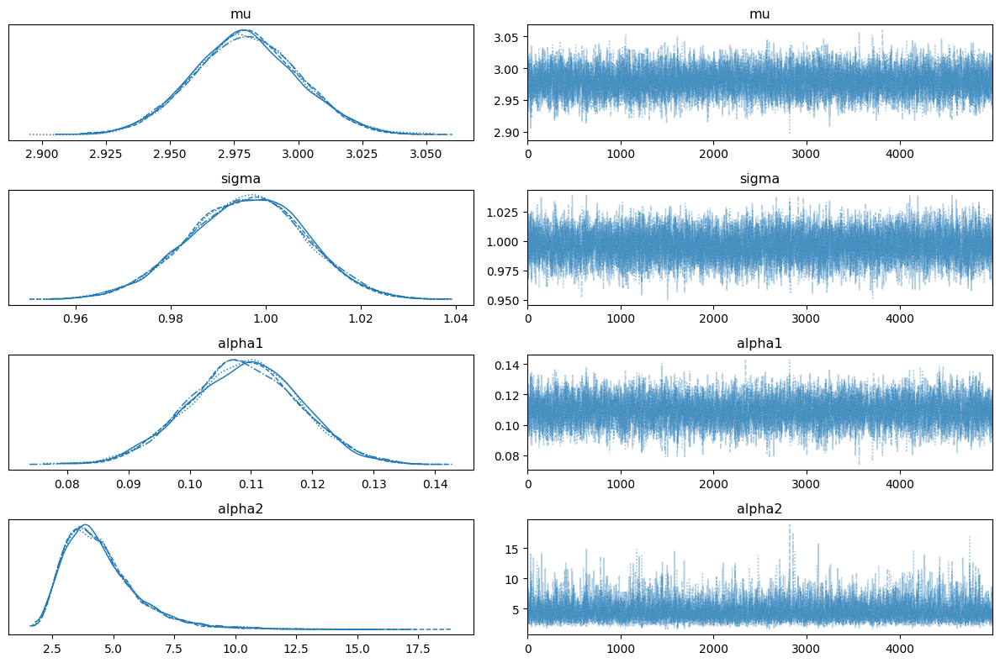

In [31]:
# plot trace
az.plot_trace(traceRandom1)
plt.tight_layout()
plt.show()

##### Skenario Menceng Kanan

In [32]:
# parameter GMSNBurr(2; 0,3; 4; 1)
with pm.Model() as modelRandom2:
  # prior untuk parameter
  mu = pm.Normal("mu", mu=4, sigma=1)
  sigma = pm.HalfCauchy("sigma", beta=2)
  alpha1 = pm.Lognormal("alpha1", mu=0.7, sigma=0.2)
  alpha2 = pm.Lognormal("alpha2", mu=-1.3, sigma=0.2)

  # likelihood
  y = GMSNBurr.main("GMSNBurr", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=datarandom2)

  # posterior
  traceRandom2 = pm.sample(**sampler_kwargs)

# summary
summaryRandom2 = az.summary(traceRandom2, round_to=3, hdi_prob=0.95)
summaryRandom2

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 439 seconds.


,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,4.011,0.017,3.979,4.044,0.000,0.000,9491.414,10625.503,1.000
sigma,0.987,0.011,0.966,1.010,0.000,0.000,8147.310,10278.804,1.001
alpha1,1.894,0.235,1.451,2.360,0.003,0.002,6859.025,9129.650,1.000
alpha2,0.291,0.019,0.254,0.328,0.000,0.000,6539.517,8526.281,1.000


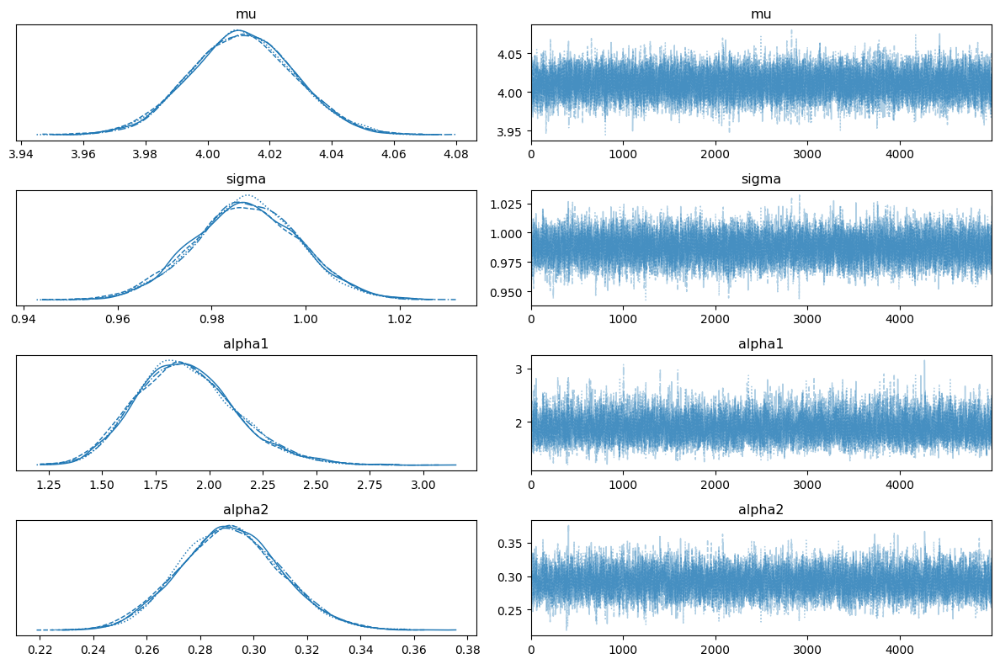

In [33]:
# plot trace
az.plot_trace(traceRandom2)
plt.tight_layout()
plt.show()

##### Skenario Simetris

In [34]:
# parameter GMSNBurr(18; 18; 0; 2)
with pm.Model() as modelRandom3:
  # prior untuk parameter
  mu = pm.Normal("mu", mu=0, sigma=1)
  sigma = pm.HalfCauchy("sigma", beta=2)
  alpha1 = pm.Lognormal("alpha1", mu=3, sigma=0.2)
  alpha2 = pm.Lognormal("alpha2", mu=3, sigma=0.2)

  # likelihood
  y = GMSNBurr.main("GMSNBurr", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=datarandom3)

  # posterior
  traceRandom3 = pm.sample(**sampler_kwargs)

# summary
summaryRandom3 = az.summary(traceRandom3, round_to=3, hdi_prob=0.95)
summaryRandom3

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 263 seconds.


,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,0.044,0.030,-0.016,0.100,0.000,0.000,19126.040,13785.696,1.001
sigma,2.007,0.014,1.978,2.035,0.000,0.000,17855.978,12919.396,1.001
alpha1,18.239,2.814,13.044,23.834,0.023,0.024,15093.843,12779.942,1.001
alpha2,23.055,3.720,16.378,30.576,0.030,0.031,15770.170,13209.987,1.000


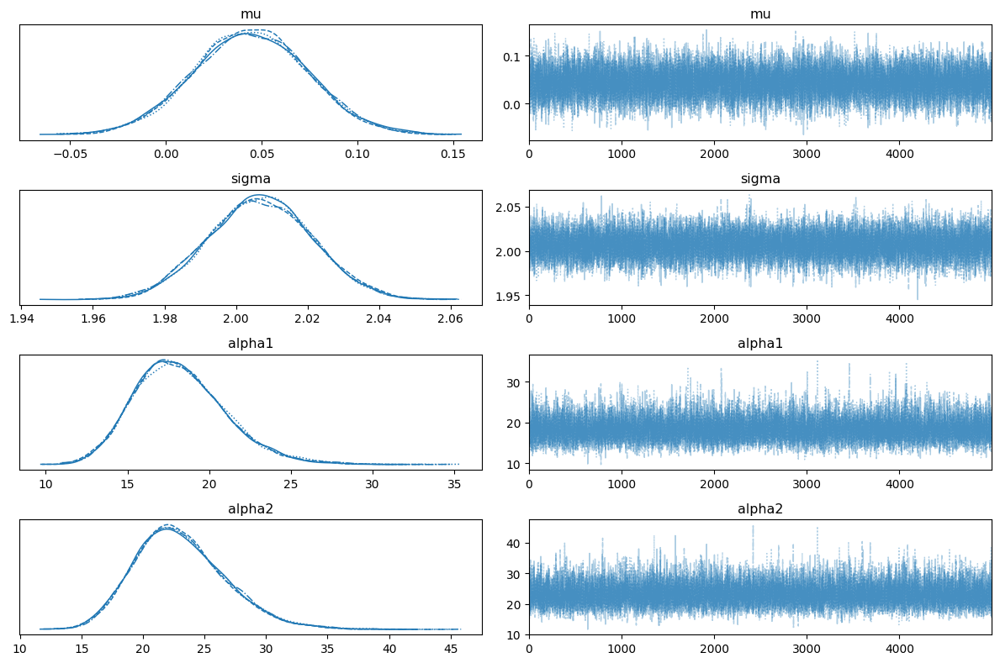

In [35]:
# plot trace
az.plot_trace(traceRandom3)
plt.tight_layout()
plt.show()

### Regresi

In [307]:
# data untuk uji coba regresi
np.random.seed(42)
x1 = np.random.normal(0, 1, 10000)
x2 = np.random.normal(0, 1, 10000)

# parameter
b0_true = 0.48
b1_true = 0.74
b2_true = 0.05
ycap = b0_true + b1_true * x1 + b2_true * x2

# error
eps1 = pm.draw(GMSNBurr.dist(3, 1, 0.1, 4), draws=10000, random_seed=42)
eps2 = pm.draw(GMSNBurr.dist(4, 1, 2, 0.3), draws=10000, random_seed=42)
eps3 = pm.draw(GMSNBurr.dist(0, 2, 18, 18), draws=10000, random_seed=42)

# y
y1 = ycap + eps1
y2 = ycap + eps2
y3 = ycap + eps3

# konversi ke data frame
dataCobaRegresi = pd.DataFrame({'x1': x1, 'x2': x2, 'y1': y1, 'y2': y2, 'y3': y3})

In [308]:
# estimasi parameter dengan pymc
with pm.Model() as modelCobaRegresi:
  beta0 = pm.Normal("beta0", mu=0, sigma=2.5)
  beta1 = pm.Normal("beta1", mu=0, sigma=2.5)
  beta2 = pm.Normal("beta2", mu=0, sigma=2.5)
  sigma = pm.HalfCauchy("sigma", beta=2)
  alpha1 = pm.Lognormal("alpha1", mu=-2, sigma=0.5)
  alpha2 = pm.Lognormal("alpha2", mu=1.3, sigma=0.5)

  mu = beta0 + beta1 * x1 + beta2 * x2

  y_obs = GMSNBurr.main('y_obs', mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=dataCobaRegresi['y1'])

  traceCobaRegresi = pm.sample(**sampler_kwargs)

# summary hasil
az.summary(traceCobaRegresi, round_to=3, hdi_prob=0.95)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta0, beta1, beta2, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 484 seconds.


,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta0,3.461,0.020,3.421,3.501,0.000,0.000,8243.500,11051.973,1.0
beta1,0.732,0.007,0.718,0.744,0.000,0.000,17556.073,13379.303,1.0
beta2,0.046,0.007,0.033,0.059,0.000,0.000,17924.884,11830.060,1.0
sigma,0.995,0.012,0.971,1.019,0.000,0.000,9230.358,11245.927,1.0
alpha1,0.108,0.009,0.091,0.126,0.000,0.000,7224.279,8625.904,1.0
alpha2,4.389,1.569,1.992,7.375,0.017,0.023,8174.973,9741.126,1.0


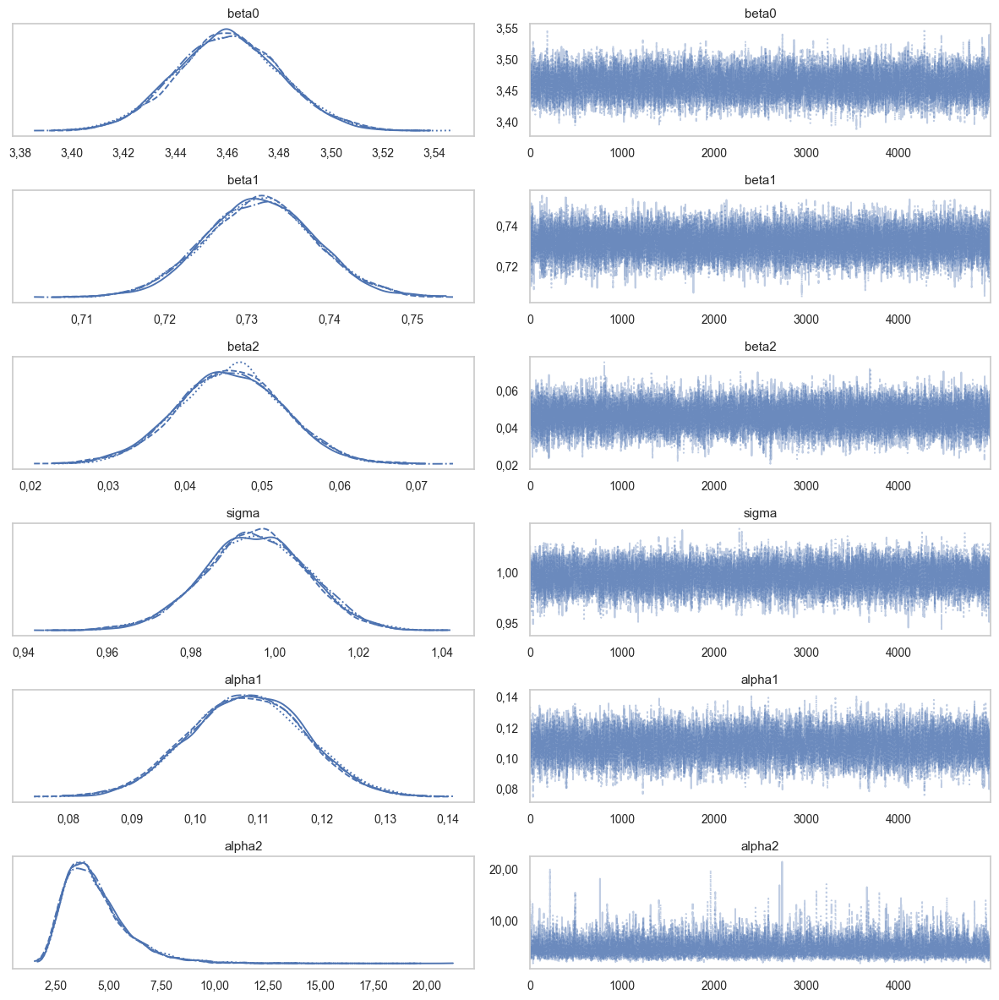

In [322]:
axes = az.plot_trace(traceCobaRegresi)
comma_formatter2 = FuncFormatter(lambda x, p: f'{x:.2f}'.replace('.', ','))
comma_formatter1 = FuncFormatter(lambda x, p: f'{x:.1f}'.replace('.', ','))
for ax in axes[:, 0]:
    ax.xaxis.set_major_formatter(comma_formatter2)
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
    ax.yaxis.set_major_formatter(comma_formatter2)
plt.tight_layout()
plt.show()

In [323]:
modelCobaRegresi1 = bmb.Model("y1 ~ x1 + x2", dataCobaRegresi, family=family)
paramsCobaRegresi1 = modelCobaRegresi1.fit(**sampler_kwargs)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha1, sigma, alpha2, Intercept, x1, x2]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 401 seconds.


In [324]:
az.summary(paramsCobaRegresi1, round_to=3, hdi_prob=0.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha1,0.109,0.009,0.092,0.125,0.000,0.000,7390.702,9493.714,1.0
sigma,0.995,0.012,0.971,1.018,0.000,0.000,9385.959,11675.522,1.0
alpha2,3.982,1.215,1.991,6.332,0.013,0.014,8842.122,12771.343,1.0
Intercept,3.456,0.020,3.418,3.494,0.000,0.000,8503.529,10998.527,1.0
x1,0.732,0.007,0.719,0.745,0.000,0.000,18102.578,12957.559,1.0
x2,0.046,0.007,0.033,0.059,0.000,0.000,18745.622,13730.963,1.0


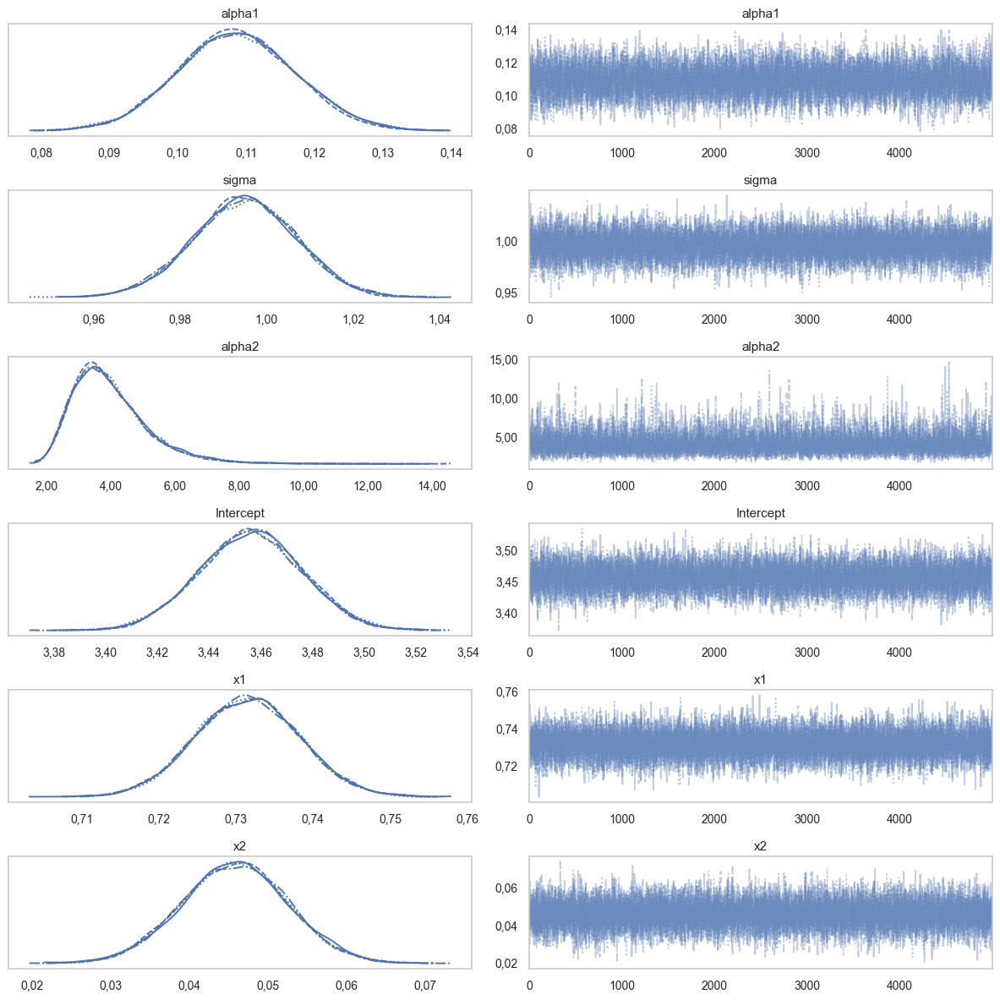

In [325]:
axes = az.plot_trace(paramsCobaRegresi1)
comma_formatter2 = FuncFormatter(lambda x, p: f'{x:.2f}'.replace('.', ','))
comma_formatter1 = FuncFormatter(lambda x, p: f'{x:.1f}'.replace('.', ','))
for ax in axes[:, 0]:
    ax.xaxis.set_major_formatter(comma_formatter2)
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
    ax.yaxis.set_major_formatter(comma_formatter2)
plt.tight_layout()
plt.show()

In [326]:
modelCobaRegresi2 = bmb.Model("y2 ~ x1 + x2", dataCobaRegresi, family=family, priors=priors)
paramsCobaRegresi2 = modelCobaRegresi2.fit(**sampler_kwargs)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha1, sigma, alpha2, Intercept, x1, x2]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 397 seconds.


In [327]:
az.summary(paramsCobaRegresi2, round_to=3, hdi_prob=0.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha1,2.013,0.330,1.430,2.683,0.003,0.003,9506.342,11440.727,1.000
sigma,0.991,0.012,0.967,1.016,0.000,0.000,9789.593,12475.278,1.001
alpha2,0.301,0.024,0.256,0.350,0.000,0.000,8569.618,11166.708,1.000
Intercept,4.496,0.017,4.463,4.531,0.000,0.000,11287.836,12646.854,1.000
x1,0.753,0.009,0.734,0.770,0.000,0.000,18915.182,13066.968,1.000
x2,0.044,0.009,0.025,0.062,0.000,0.000,19551.799,13526.106,1.000


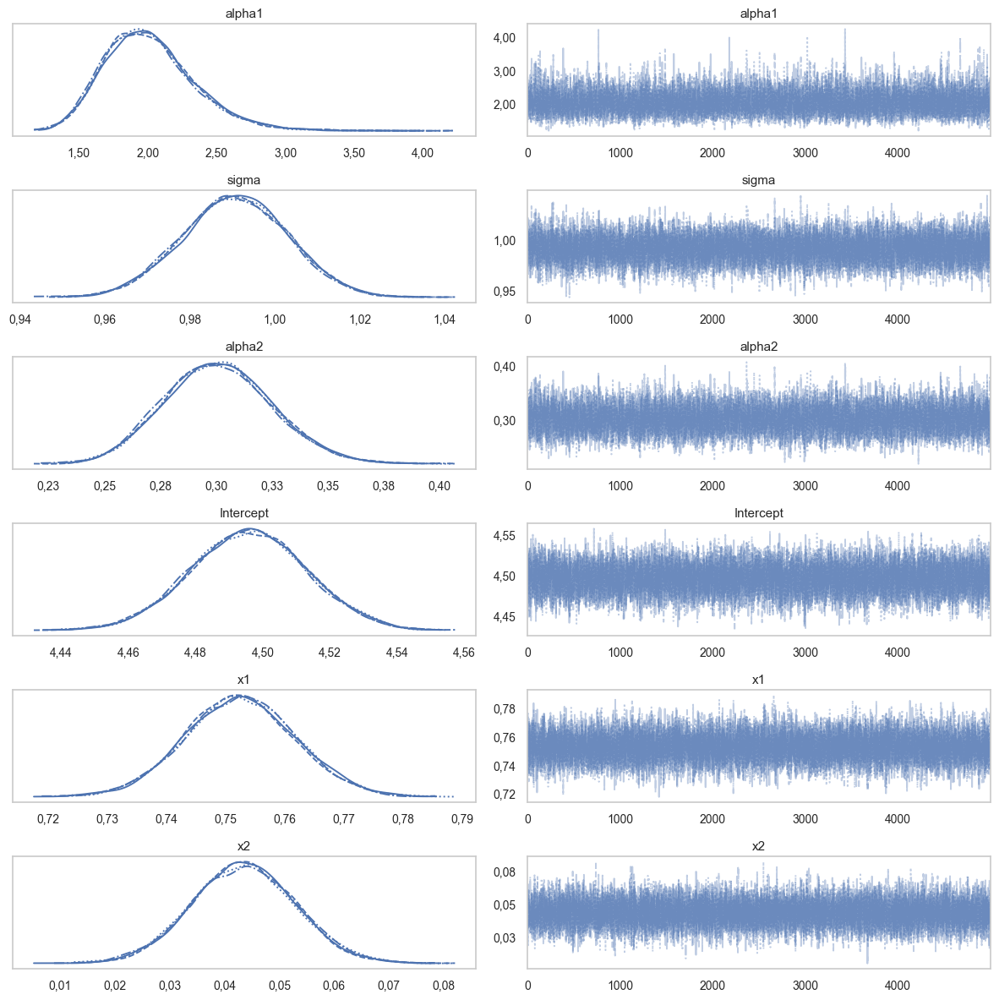

In [328]:
axes = az.plot_trace(paramsCobaRegresi2)
comma_formatter2 = FuncFormatter(lambda x, p: f'{x:.2f}'.replace('.', ','))
comma_formatter1 = FuncFormatter(lambda x, p: f'{x:.1f}'.replace('.', ','))
for ax in axes[:, 0]:
    ax.xaxis.set_major_formatter(comma_formatter2)
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
    ax.yaxis.set_major_formatter(comma_formatter2)
plt.tight_layout()
plt.show()

In [329]:
modelCobaRegresi3 = bmb.Model("y3 ~ x1 + x2", dataCobaRegresi, family=family, priors=priors)
paramsCobaRegresi3 = modelCobaRegresi3.fit(**sampler_kwargs, round_to=3, hdi_prob=0.95)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha1, sigma, alpha2, Intercept, x1, x2]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 433 seconds.


In [330]:
az.summary(paramsCobaRegresi3, round_to=3, hdi_prob=0.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha1,5.278,1.063,3.414,7.360,0.010,0.010,11862.592,12424.973,1.000
sigma,1.977,0.016,1.944,2.008,0.000,0.000,16372.556,13897.085,1.001
alpha2,6.192,1.346,3.851,8.827,0.012,0.013,11903.912,11689.987,1.000
Intercept,0.535,0.032,0.474,0.598,0.000,0.000,21680.988,13891.872,1.000
x1,0.748,0.020,0.709,0.788,0.000,0.000,20558.002,14030.182,1.000
x2,0.015,0.020,-0.024,0.055,0.000,0.000,26068.701,13192.652,1.000


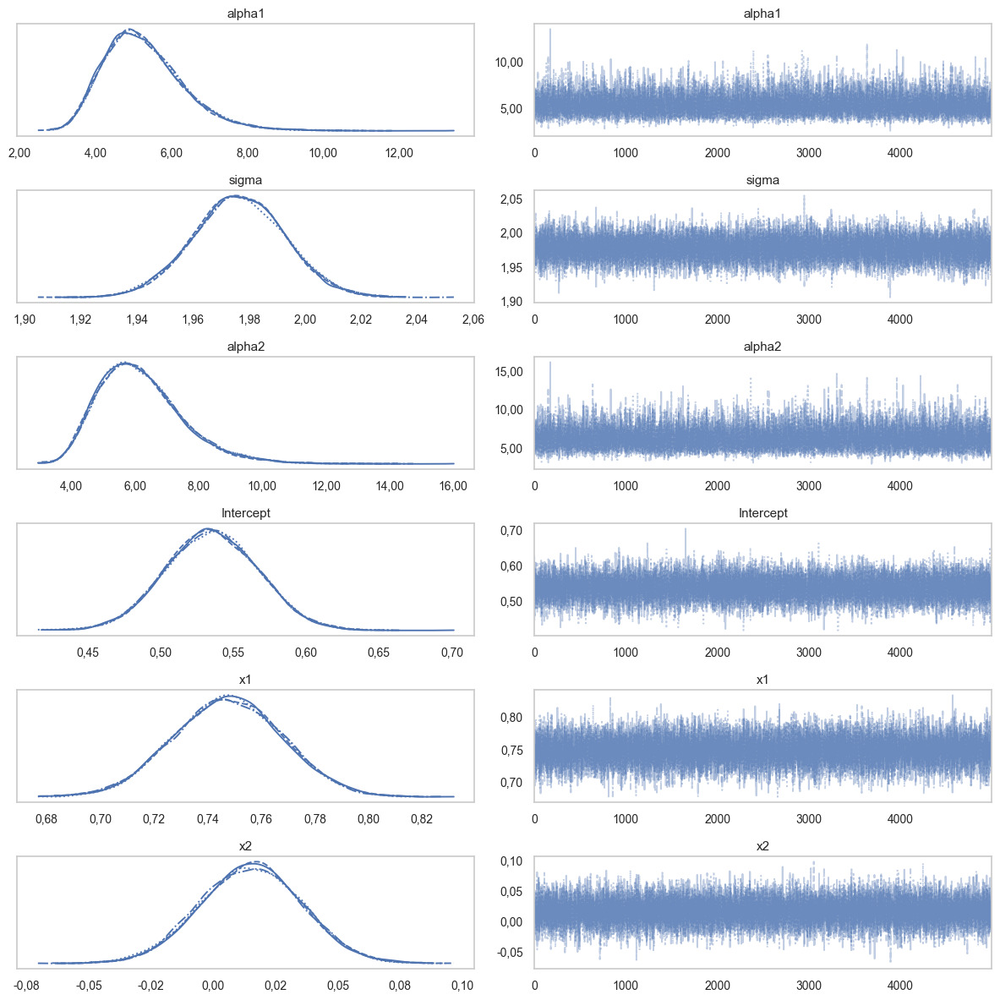

In [331]:
axes = az.plot_trace(paramsCobaRegresi3)
comma_formatter2 = FuncFormatter(lambda x, p: f'{x:.2f}'.replace('.', ','))
comma_formatter1 = FuncFormatter(lambda x, p: f'{x:.1f}'.replace('.', ','))
for ax in axes[:, 0]:
    ax.xaxis.set_major_formatter(comma_formatter2)
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
    ax.yaxis.set_major_formatter(comma_formatter2)
plt.tight_layout()
plt.show()

## Data BPS

### Data IPM Indonesia

IPM Tahun 2015 - 2024

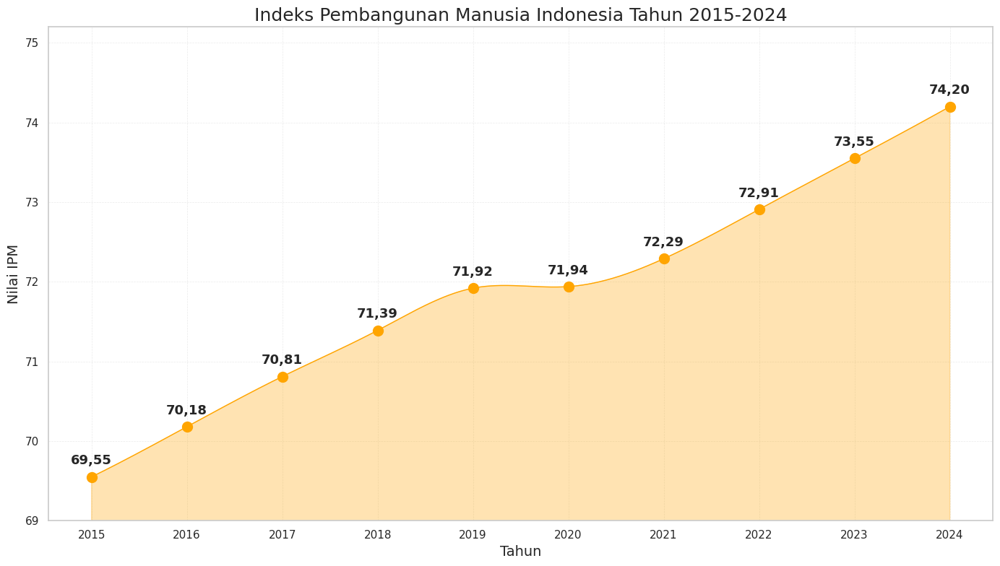

In [19]:
from scipy.interpolate import make_interp_spline

# Data IPM Indonesia dari tahun 2015-2024
dataIPM1524 = {
    'Tahun': [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024],
    'IPM': [69.55, 70.18, 70.81, 71.39, 71.92, 71.94, 72.29, 72.91, 73.55, 74.20]
}
df = pd.DataFrame(dataIPM1524)
X_Y_Spline = make_interp_spline(df['Tahun'], df['IPM'], k=3)
X_ = np.linspace(df['Tahun'].min(), df['Tahun'].max(), 500)
Y_ = X_Y_Spline(X_)
fig, ax = plt.subplots(figsize=(14, 8))
ax.fill_between(X_, Y_, color='orange', alpha=0.3)
ax.plot(X_, Y_, color='orange', linewidth=1)
ax.scatter(df['Tahun'], df['IPM'], color='orange', s=100, zorder=5)
for i, row in df.iterrows():
    tahun = row['Tahun']
    ipm = row['IPM']
    label_ipm = f"{ipm:.2f}".replace('.', ',')
    ax.text(
        tahun,
        ipm + 0.12,
        label_ipm,
        ha='center',
        va='bottom',
        fontsize=13,
        fontweight='bold'
    )
ax.set_title('Indeks Pembangunan Manusia Indonesia Tahun 2015-2024', fontsize=18)
ax.set_xlabel('Tahun', fontsize=14)
ax.set_ylabel('Nilai IPM', fontsize=14)
ax.set_ylim(69, df['IPM'].max() + 1)
ax.set_xticks(df['Tahun'])
ax.tick_params(axis='x', labelsize=11)
ax.tick_params(axis='y', labelsize=11)
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.4)
plt.tight_layout()
plt.show()

#### Prior

In [12]:
file_id = '1hE-7yT6Te0MwQw4EI9yw3mFrg_ba8EVm'
url = f'https://drive.google.com/uc?id={file_id}'
output = 'IPM.xlsx'
kolom_data = 2024
gdown.download(url, output, quiet=True)
data_ppc = pd.read_excel('IPM.xlsx')
data_ppc['Kabupaten/Kota'] = data_ppc['Kabupaten/Kota'].astype(str)
mask_capslock = data_ppc['Kabupaten/Kota'].str.isupper()
data_ppc = data_ppc[~mask_capslock]
data_ppc.reset_index(drop=True, inplace=True)
data_ppc = data_ppc[kolom_data].dropna()

##### Prior untuk Distribusi Normal

Prior predictive checking

Sampling: [NormalDist, mu, sigma]


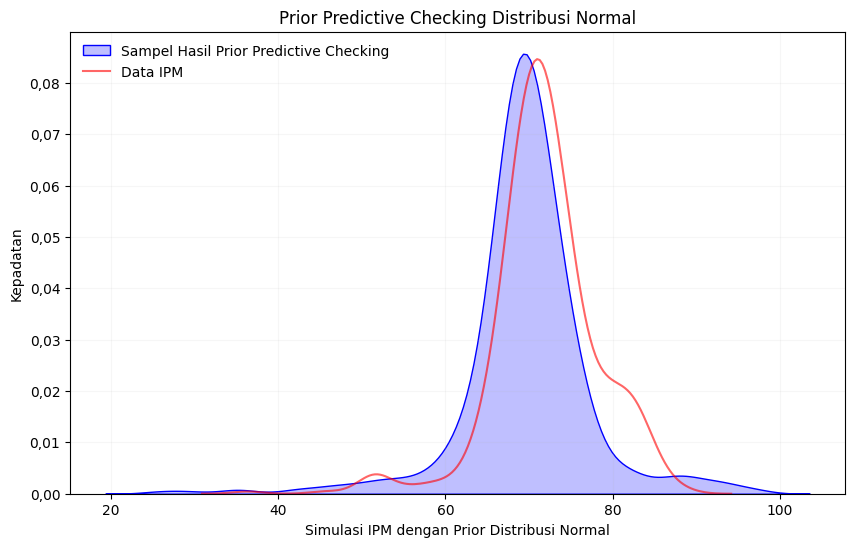

In [32]:
with pm.Model() as prior_model_normal:
    mu = pm.Normal('mu', mu=70, sigma=2)
    sigma = pm.HalfCauchy('sigma', 3)
    y = pm.Normal('NormalDist', mu=mu, sigma=sigma)
    prior_pred = pm.sample_prior_predictive(draws=500, random_seed= 42, return_inferencedata=True)

prior_samples = prior_pred["prior"]["NormalDist"].values.flatten()
filtered_samples = prior_samples[(prior_samples > 0) & (prior_samples < 100)]

plt.figure(figsize=(10,6))
sns.kdeplot(data=filtered_samples, color='blue',fill=True,label='Sampel Hasil Prior Predictive Checking')
sns.kdeplot(data_ppc,  color="red", alpha=0.6, label='Data IPM')

plt.title("Prior Predictive Checking Distribusi Normal")
plt.xlabel("Simulasi IPM dengan Prior Distribusi Normal")
plt.ylabel("Kepadatan")
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.legend(frameon = False, loc="upper left")
plt.grid(alpha=0.1)
plt.show()

In [55]:
# statistik hasil prior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 69.60
Median   : 69.70
Std Dev  : 7.58
Min      : 25.94
25% Qtl  : 67.11
75% Qtl  : 72.57
Max      : 96.97


In [13]:
with pm.Model() as prior_model_normal:
    mu = pm.Normal('mu', mu=70, sigma=2)
    sigma = pm.HalfCauchy('sigma', 3)
    y = pm.Normal('NormalDist', mu=mu, sigma=sigma)
    prior_pred = pm.sample_prior_predictive(draws=500, random_seed= 42, return_inferencedata=True)

Sampling: [NormalDist, mu, sigma]


In [16]:
prior_pred_idata = az.from_pymc3(prior=prior_pred, model=prior_model_normal)

AttributeError: module 'arviz' has no attribute 'from_pymc3'

In [ ]:
az.plot_ppc(prior_pred_idata, group="prior", data_pairs={"y": "y"})
plt.title("Prior Predictive Check")
plt.show()

TypeError: `data` argument must have the group "prior_predictive" for ppcplot

##### Prior untuk Distribusi GMSNBurr

Prior predictive checking

Sampling: [GMSNBurrDist, alpha1, alpha2, mu, sigma]


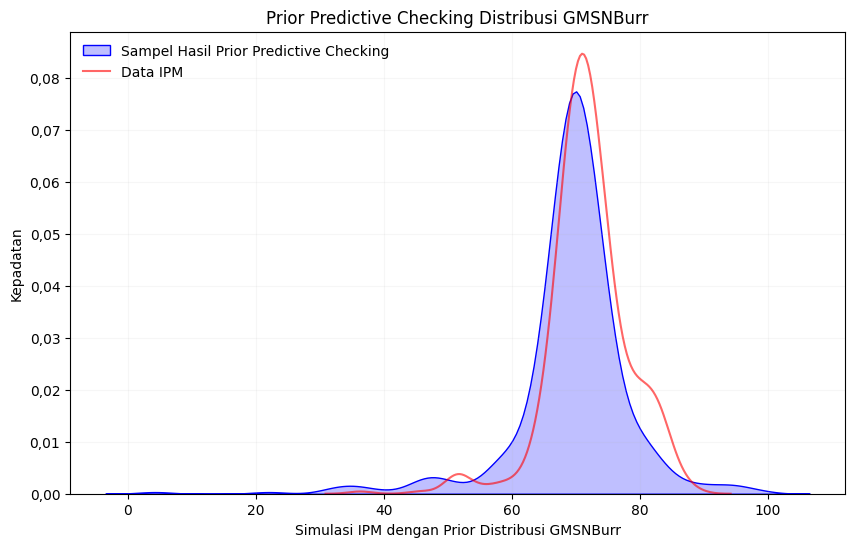

In [58]:
with pm.Model() as prior_model_gmsnburr:
    mu = pm.Normal("mu", mu=70, sigma=2)
    sigma = pm.HalfCauchy("sigma", beta=3)
    alpha1 = pm.Lognormal("alpha1", mu=0.75, sigma=0.75)
    alpha2 = pm.Lognormal("alpha2", mu=0.75, sigma=0.75)
    y = GMSNBurr.main("GMSNBurrDist", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2)
    prior_pred = pm.sample_prior_predictive(samples=500, random_seed= 42, return_inferencedata=True)

prior_samples = prior_pred["prior"]["GMSNBurrDist"].values.flatten()
filtered_samples = prior_samples[(prior_samples > 0) & (prior_samples < 100)]

plt.figure(figsize=(10,6))
sns.kdeplot(data=filtered_samples, color='blue',fill=True,label='Sampel Hasil Prior Predictive Checking')
sns.kdeplot(data_ppc,  color="red", alpha=0.6, label='Data IPM')
plt.legend(frameon = False, loc="upper left")
plt.title("Prior Predictive Checking Distribusi GMSNBurr")
plt.xlabel("Simulasi IPM dengan Prior Distribusi GMSNBurr")
plt.ylabel("Kepadatan")
plt.legend(frameon = False, loc="upper left")
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.grid(alpha=0.1)
plt.show()

In [59]:
# statistik hasil prior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 69.38
Median   : 69.95
Std Dev  : 8.92
Min      : 4.25
25% Qtl  : 67.16
75% Qtl  : 72.92
Max      : 98.77


##### Prior untuk Distribusi MSNBurr

Prior predictive checking

Sampling: [MSNBurrDist, alpha, mu, sigma]


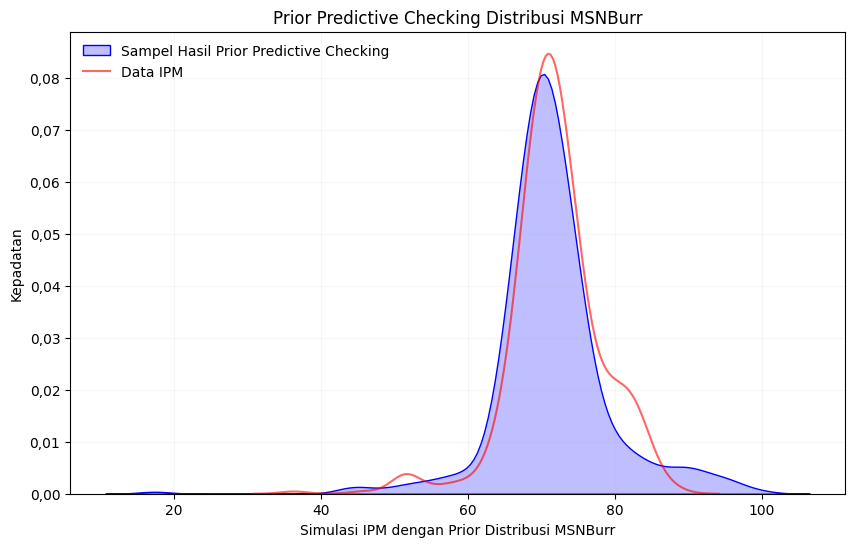

In [60]:
with pm.Model() as prior_model_msnburr:
    mu = pm.Normal("mu", mu=70, sigma=2)
    sigma = pm.HalfCauchy("sigma", beta=3)
    alpha = pm.Gamma("alpha", alpha=3, beta=0.5)
    y = MSNBurr.main("MSNBurrDist", mu=mu, sigma=sigma, alpha=alpha)
    prior_pred = pm.sample_prior_predictive(samples=500, random_seed= 42, return_inferencedata=True)

prior_samples = prior_pred["prior"]["MSNBurrDist"].values.flatten()
filtered_samples = prior_samples[(prior_samples > 0) & (prior_samples < 100)]

plt.figure(figsize=(10,6))
sns.kdeplot(data=filtered_samples, color='blue',fill=True,label='Sampel Hasil Prior Predictive Checking')
sns.kdeplot(data_ppc,  color="red", alpha=0.6, label='Data IPM')
plt.title("Prior Predictive Checking Distribusi MSNBurr")
plt.xlabel("Simulasi IPM dengan Prior Distribusi MSNBurr")
plt.ylabel("Kepadatan")
plt.legend(frameon = False, loc="upper left")
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.grid(alpha=0.1)
plt.show()

In [61]:
# statistik hasil prior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 71.47
Median   : 70.62
Std Dev  : 7.69
Min      : 17.39
25% Qtl  : 68.02
75% Qtl  : 74.13
Max      : 99.85


##### Prior untuk MSNBurr-IIa

Prior predictive checking

Sampling: [MSNBurrIIaDist, alpha, mu, sigma]


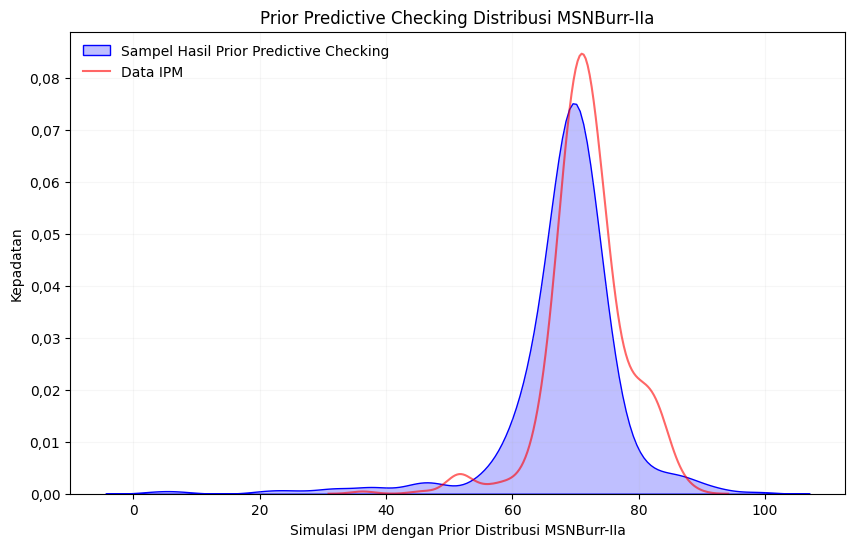

In [62]:
with pm.Model() as prior_model_msnburriia:
    mu = pm.Normal("mu", mu=70, sigma=2)
    sigma = pm.HalfCauchy("sigma", beta=3)
    alpha = pm.Gamma("alpha", alpha=3, beta=0.5)
    y = MSNBurrIIa.main("MSNBurrIIaDist", mu=mu, sigma=sigma, alpha=alpha)
    prior_pred = pm.sample_prior_predictive(samples=500, random_seed= 42, return_inferencedata=True)

prior_samples = prior_pred["prior"]["MSNBurrIIaDist"].values.flatten()
filtered_samples = prior_samples[(prior_samples > 0) & (prior_samples < 100)]

plt.figure(figsize=(10,6))
sns.kdeplot(data=filtered_samples, color='blue',fill=True,label='Sampel Hasil Prior Predictive Checking')
sns.kdeplot(data_ppc,  color="red", alpha=0.6, label='Data IPM')
plt.title("Prior Predictive Checking Distribusi MSNBurr-IIa")
plt.xlabel("Simulasi IPM dengan Prior Distribusi MSNBurr-IIa")
plt.ylabel("Kepadatan")
plt.legend(frameon = False, loc="upper left")
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.grid(alpha=0.1)
plt.show()

In [63]:
# statistik hasil prior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 68.36
Median   : 69.48
Std Dev  : 9.38
Min      : 3.71
25% Qtl  : 66.16
75% Qtl  : 72.19
Max      : 98.92


#### Likelihood

##### Import Data

In [163]:
# url data
file_id = '1hE-7yT6Te0MwQw4EI9yw3mFrg_ba8EVm'
url = f'https://drive.google.com/uc?id={file_id}'
output = 'IPM.xlsx'
kolom_data = 2024

# unduh data
gdown.download(url, output, quiet=True)
data = pd.read_excel('IPM.xlsx')

##### Eksplorasi Data

Cek struktur data

In [164]:
data.head()

,Kabupaten/Kota,2024
0,ACEH,74.03
1,Simeulue,69.01
2,Aceh Singkil,70.75
3,Aceh Selatan,69.10
4,Aceh Tenggara,71.70


Informasi dasar data

In [165]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 579 entries, 0 to 578
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Kabupaten/Kota  579 non-null    object 
 1   2024            553 non-null    float64
dtypes: float64(1), object(1)
memory usage: 9.2+ KB
None


Deskripsi data

In [166]:
data_kolom = data[kolom_data]

meanIPM = data_kolom.mean()                          # Mean (μ)
std_devIPM = data_kolom.std()                        # Standard Deviation (σ)
medianIPM = data_kolom.median()                      # Median
skewnessIPM = skew(data_kolom, nan_policy='omit')    # Skewness
kurtIPM = kurtosis(data_kolom, nan_policy='omit')    # Kurtosis
minIPM = data_kolom.min()
maxIPM = data_kolom.max()

print(f"Estimasi Parameter IPM Kabupaten/Kota Tahun 2024:")
print(f"Mean (μ): {meanIPM:.2f}")
print(f"Standard Deviation (σ): {std_devIPM:.2f}")
print(f"Median: {medianIPM:.2f}")
print(f"Skewness (Kemencengan): {skewnessIPM:.2f}")
print(f"Kurtosis (Keruncingan): {kurtIPM:.2f}")
print(f"Min: {minIPM:.2f}")
print(f"Max: {maxIPM:.2f}")

Estimasi Parameter IPM Kabupaten/Kota Tahun 2024:
Mean (μ): 71.96
Standard Deviation (σ): 6.21
Median: 71.78
Skewness (Kemencengan): -0.80
Kurtosis (Keruncingan): 3.66
Min: 36.30
Max: 88.77


Cek missing value

In [167]:
print(f"Jumlah baris data NaN : {data_kolom.isnull().sum()}")

Jumlah baris data NaN : 26


Cek baris data duplikat

In [168]:
print(f"Jumlah baris data duplikat: {data.duplicated().sum()}")

Jumlah baris data duplikat: 0


Plot visualisasi histogram

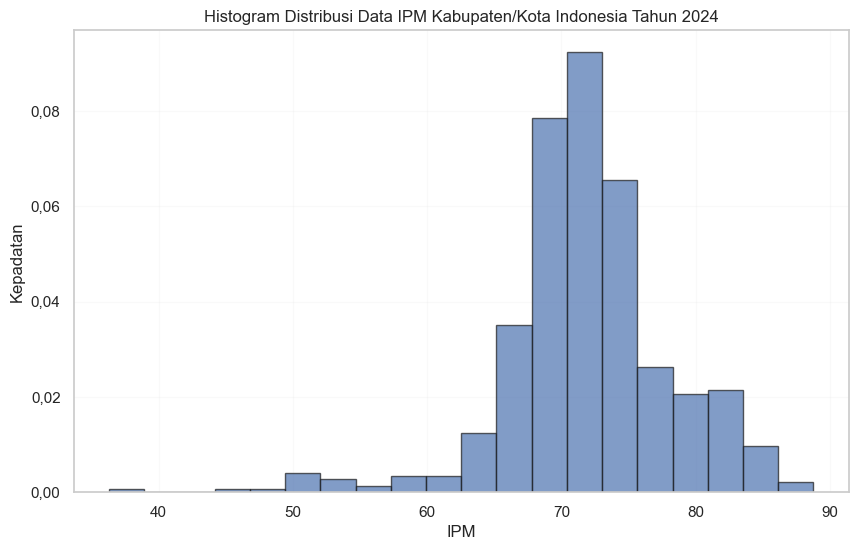

In [169]:
# drop missing value
kolom_ipm = data[2024]
data_plot = kolom_ipm.dropna()

# plot histogram
plt.figure(figsize=(10, 6))
count, bins, ignored = plt.hist(data_plot, bins=20, density=True, edgecolor='k', alpha=0.7)
plt.title(f'Histogram Distribusi Data IPM Kabupaten/Kota Indonesia Tahun 2024')
plt.xlabel('IPM')
plt.ylabel('Kepadatan')
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.grid(alpha=0.1)
plt.show()

Cek outlier dengan boxplot

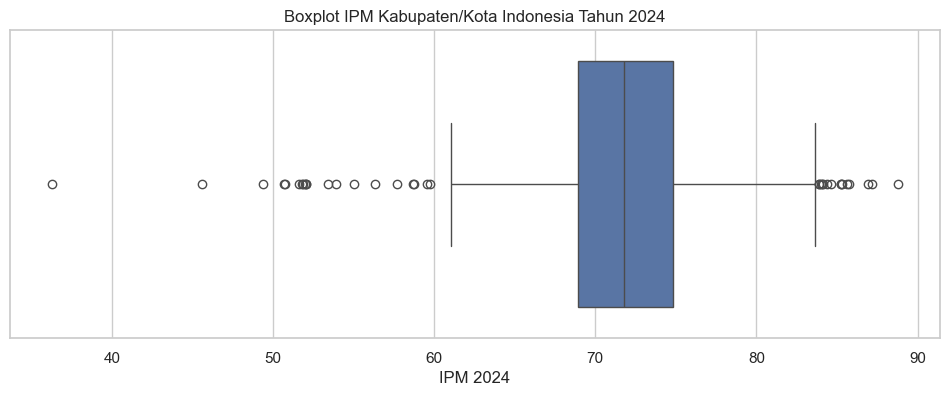

In [170]:
plt.figure(figsize=(12, 4))
sns.boxplot(x=data_kolom)
plt.title(f'Boxplot IPM Kabupaten/Kota Indonesia Tahun 2024')
plt.xlabel('IPM 2024')
plt.ylabel('')
plt.show()

Uji Kenormalan dengan Uji Shapiro-Wilk

In [171]:
# uji Shapiro-Wilk
shapiro_test_result = st.shapiro(data_kolom, nan_policy='omit')
skewness = st.skew(data_kolom, nan_policy='omit')

print("IPM Kabupaten/Kota Indonesia Tahun 2024")
print(f"Shapiro-Wilk test (p-value): {shapiro_test_result[1]}")
print(f"Skewness: {skewness}")

IPM Kabupaten/Kota Indonesia Tahun 2024
Shapiro-Wilk test (p-value): 4.5754266203602074e-15
Skewness: -0.7959080917866381


##### Cleaning Data

In [172]:
data['Kabupaten/Kota'] = data['Kabupaten/Kota'].astype(str)

# cek baris dengan isi IPM huruf kapital semua
mask_capslock = data['Kabupaten/Kota'].str.isupper()

# tampilkan baris-baris yang akan dihapus
print("Baris dengan IPM huruf kapital:")
print(data[mask_capslock])

# hapus data
data = data[~mask_capslock]
data.reset_index(drop=True, inplace=True)

Baris dengan IPM huruf kapital:
           Kabupaten/Kota   2024
0                    ACEH  74.03
24         SUMATERA UTARA  74.02
58         SUMATERA BARAT  74.49
78                   RIAU  74.79
91                  JAMBI  73.43
103      SUMATERA SELATAN  72.30
121              BENGKULU  73.39
132               LAMPUNG  71.81
148  KEP. BANGKA BELITUNG  73.33
156        KEPULAUAN RIAU  77.97
164           DKI JAKARTA  83.08
171            JAWA BARAT  74.43
199           JAWA TENGAH  73.88
235        D I YOGYAKARTA  81.55
241            JAWA TIMUR  74.09
280                BANTEN  74.48
289                  BALI  77.76
299   NUSA TENGGARA BARAT  70.93
310   NUSA TENGGARA TIMUR  67.39
333      KALIMANTAN BARAT  70.13
348     KALIMANTAN TENGAH  72.73
363    KALIMANTAN SELATAN  73.03
377      KALIMANTAN TIMUR  78.83
388      KALIMANTAN UTARA  73.02
394        SULAWESI UTARA  75.03
410       SULAWESI TENGAH  71.56
424      SULAWESI SELATAN  74.05
449     SULAWESI TENGGARA  73.48
467        

Drop Missing Value

In [173]:
data_kolom = data[kolom_data].dropna()
data_kolom

0      69.01
1      70.75
2      69.10
3      71.70
4      69.87
       ...  
535    52.05
536    50.72
537    51.85
538    51.98
539    49.36
Name: 2024, Length: 514, dtype: float64

#### Posterior

##### Pengecekan sampler yang digunakan

Sampler sama dengan estimasi parameter sebelumnya

In [30]:
# menggunakan sampler yang sama dengan estimasi sebelumnya
sampler_kwargs_tes1 = {
    "chains": 4,
    "cores": 4,
    "return_inferencedata": True,
    "random_seed": 42,
    "tune": 2000,
    "draws": 5000,
    "nuts_sampler_kwargs":{"target_accept": 0.9}
}

In [49]:
with pm.Model() as modelSampler1:
  mu = pm.Normal("mu", mu=70, sigma=2)
  sigma = pm.HalfCauchy("sigma", beta=3)
  alpha1 = pm.Gamma("alpha1", mu=2, sigma=0.1)
  alpha2 = pm.Gamma("alpha2", mu=2, sigma=0.1)
  y = GMSNBurr.main("GMSNBurrDist", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=data_kolom)
  traceSampler_tes1 = pm.sample(**sampler_kwargs_tes1)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 29 seconds.


In [53]:
summarySampler1 = az.summary(traceSampler_tes1, round_to=3, hdi_prob=0.95)
summarySampler1

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,72.026,0.262,71.521,72.549,0.002,0.002,27825.806,16923.672,1.0
sigma,5.541,0.199,5.148,5.930,0.001,0.001,29830.300,16805.848,1.0
alpha1,1.933,0.094,1.741,2.112,0.001,0.001,29749.868,16443.692,1.0
alpha2,2.007,0.098,1.817,2.197,0.001,0.001,28144.797,16215.110,1.0


Trace plot sampler

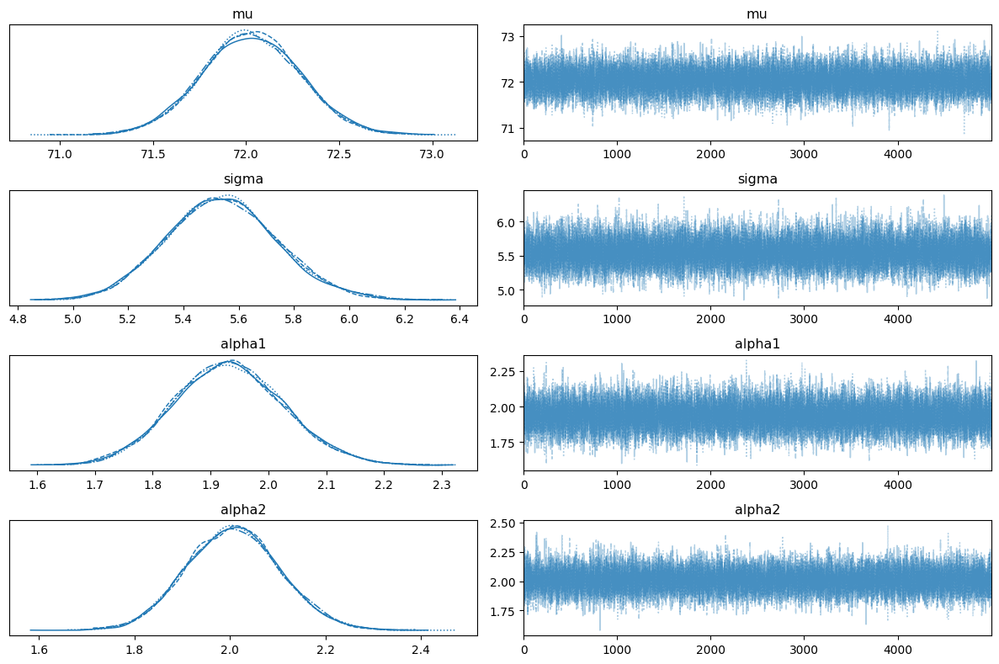

In [54]:
az.plot_trace(traceSampler_tes1)
plt.tight_layout()
plt.show()

arviz - WARNING - Shape validation failed: input_shape: (4, 2), minimum_shape: (chains=2, draws=4)


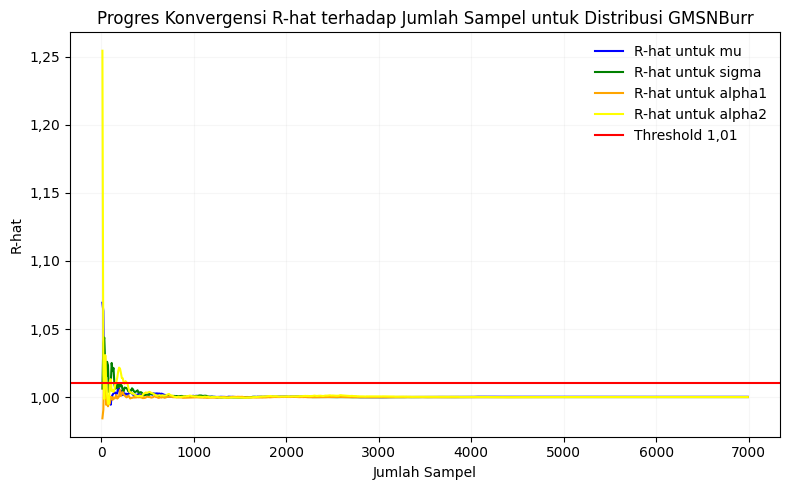

In [55]:
steps = range(1, 7001, 10)
mu_rhat_progress = []
sigma_rhat_progress = []
alpha1_rhat_progress = []
alpha2_rhat_progress = []

for step in steps:
    trace_subset = traceSampler_tes1.sel(draw=slice(0, step))
    rhat = az.rhat(trace_subset)
    mu_rhat_progress.append(rhat["mu"].values)
    sigma_rhat_progress.append(rhat["sigma"].values)
    alpha1_rhat_progress.append(rhat["alpha1"].values)
    alpha2_rhat_progress.append(rhat["alpha2"].values)

# Plot gabungan R-hat untuk mu, sigma, alpha1, dan alpha2
plt.figure(figsize=(8, 5))
plt.plot(steps, mu_rhat_progress, label='R-hat untuk mu', color='blue')
plt.plot(steps, sigma_rhat_progress, label='R-hat untuk sigma', color='green')
plt.plot(steps, alpha1_rhat_progress, label='R-hat untuk alpha1', color='orange')
plt.plot(steps, alpha2_rhat_progress, label='R-hat untuk alpha2', color='yellow')
plt.axhline(1.01, color='red', label='Threshold 1,01')
plt.xlabel("Jumlah Sampel")
plt.ylabel("R-hat")
plt.title("Progres Konvergensi R-hat terhadap Jumlah Sampel untuk Distribusi GMSNBurr")
plt.legend(frameon=False)
plt.grid(alpha=0.1)
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.tight_layout()
plt.show()

Ditemukan divergen pada proses sampling, menggunakan sampler yang lain

In [56]:
sampler_kwargs_tes2 = {
    "chains": 4,
    "cores": 4,
    "return_inferencedata": True,
    "random_seed": 42,
    "tune": 1000,
    "draws": 5000,
    "nuts_sampler_kwargs":{"target_accept": 0.9}
}

In [57]:
with pm.Model() as modelSampler2:
  mu = pm.Normal("mu", mu=70, sigma=2)
  sigma = pm.HalfCauchy("sigma", beta=3)
  alpha1 = pm.Gamma("alpha1", mu=2, sigma=0.1)
  alpha2 = pm.Gamma("alpha2", mu=2, sigma=0.1)
  y = GMSNBurr.main("GMSNBurrDist", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=data_kolom)
  traceSampler_tes2 = pm.sample(**sampler_kwargs_tes2)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 32 seconds.


In [58]:
summarySampler2 = az.summary(traceSampler_tes2, round_to=3, hdi_prob=0.95)
summarySampler2

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,72.029,0.264,71.511,72.549,0.002,0.002,24898.119,17213.820,1.0
sigma,5.540,0.197,5.159,5.926,0.001,0.001,32140.162,15604.556,1.0
alpha1,1.932,0.094,1.751,2.118,0.001,0.001,24656.096,16585.282,1.0
alpha2,2.007,0.097,1.816,2.195,0.001,0.001,25641.089,16650.929,1.0


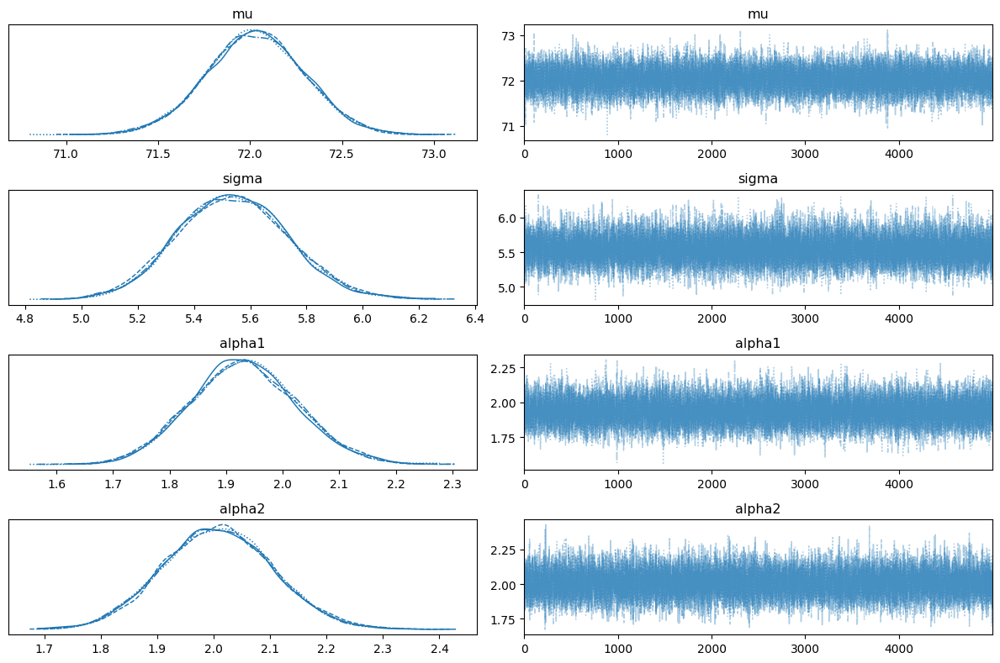

In [59]:
az.plot_trace(traceSampler_tes2)
plt.tight_layout()
plt.show()

Tidak ditemukan divergen saat sampling, sampler ini yang akan digunakan untuk estimasi parameter IPM

In [31]:
sampler_kwargs = sampler_kwargs_tes1

##### Pemodelan dengan Distribusi Normal

Sampling MCMC

In [174]:
with pm.Model() as modelNormalIPM:
  mu = pm.Normal('mu', mu=70, sigma=2)
  sigma = pm.HalfCauchy('sigma', 3)
  pm.Normal('NormalDist', mu=mu, sigma=sigma, observed=data_kolom)
  traceNormalIPM = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True}, discard_tuned_samples=False)
  log_evidence_H0 = pm.loo(traceNormalIPM).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 59 seconds.


Summary hasil

In [175]:
summaryNormalIPM = az.summary(traceNormalIPM, round_to=3, hdi_prob=0.95)
summaryNormalIPM

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,71.884,0.277,71.349,72.428,0.002,0.002,20194.714,14462.213,1.001
sigma,6.292,0.197,5.902,6.670,0.001,0.001,19453.062,15165.784,1.000


Trace plot

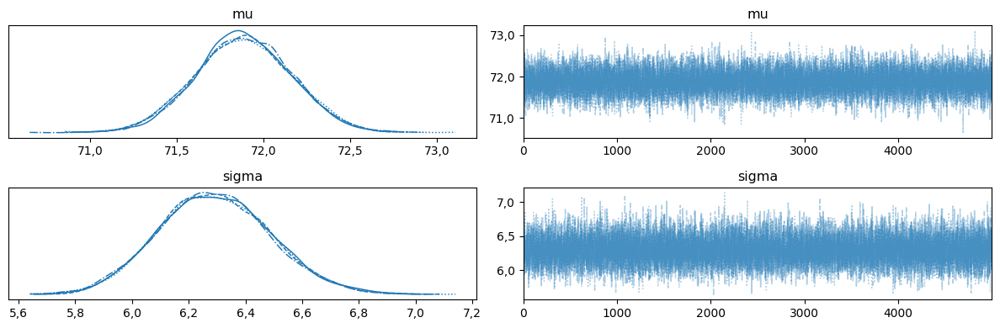

In [67]:
axes = az.plot_trace(traceNormalIPM)
comma_formatter2 = FuncFormatter(lambda x, p: f'{x:.2f}'.replace('.', ','))
comma_formatter1 = FuncFormatter(lambda x, p: f'{x:.1f}'.replace('.', ','))
for ax in axes[:, 0]:
    ax.xaxis.set_major_formatter(comma_formatter1)
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
    ax.yaxis.set_major_formatter(comma_formatter1)
plt.tight_layout()
plt.show()

Plot Rhat

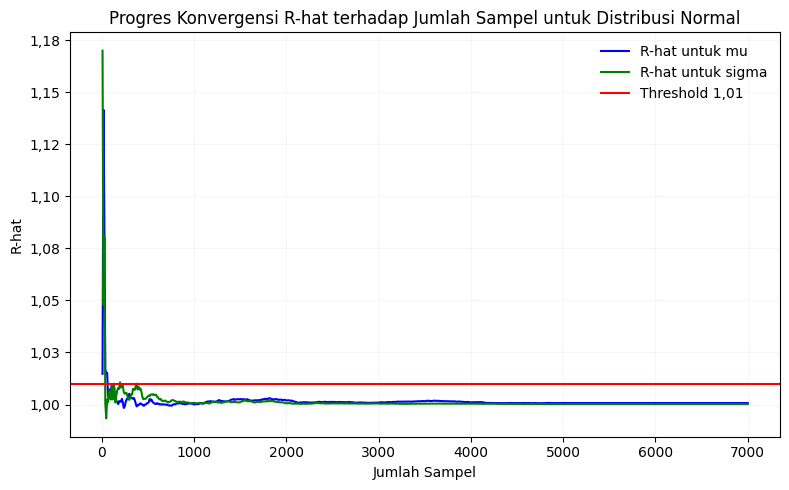

In [31]:
steps = range(10, 7001, 10)
mu_rhat_progress = []
sigma_rhat_progress = []

for step in steps:
    trace_subset = traceNormalIPM.sel(draw=slice(0, step))
    rhat = az.rhat(trace_subset)
    mu_rhat_progress.append(rhat["mu"].values)
    sigma_rhat_progress.append(rhat["sigma"].values)

# Plot gabungan R-hat untuk mu dan sigma
plt.figure(figsize=(8, 5))
plt.plot(steps, mu_rhat_progress, label='R-hat untuk mu', color='blue')
plt.plot(steps, sigma_rhat_progress, label='R-hat untuk sigma', color='green')
plt.axhline(1.01, color='red', label='Threshold 1,01')
plt.xlabel("Jumlah Sampel")
plt.ylabel("R-hat")
plt.title("Progres Konvergensi R-hat terhadap Jumlah Sampel untuk Distribusi Normal")
plt.legend(frameon=False)
plt.grid(alpha=0.1)
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.tight_layout()
plt.show()

##### Pemodelan dengan Distribusi GMSNBurr

Sampling MCMC

In [176]:
with pm.Model() as modelGMSNBurrIPM:
  mu = pm.Normal("mu", mu=70, sigma=2)
  sigma = pm.HalfCauchy("sigma", beta=3)
  alpha1 = pm.Lognormal("alpha1", mu=0.75, sigma=0.75)
  alpha2 = pm.Lognormal("alpha2", mu=0.75, sigma=0.75)

  y = GMSNBurr.main("GMSNBurrDist", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=data_kolom)
  traceGMSNBurrIPM = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H1 = pm.loo(traceGMSNBurrIPM).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 87 seconds.


Summary hasil

In [177]:
summaryGMSNBurrIPM = az.summary(traceGMSNBurrIPM, round_to=3, hdi_prob=0.95)
summaryGMSNBurrIPM

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,71.514,0.314,70.895,72.126,0.003,0.002,9513.545,11085.454,1.000
sigma,4.559,0.257,4.060,5.069,0.003,0.002,7878.181,9679.249,1.000
alpha1,0.405,0.122,0.188,0.643,0.002,0.002,6706.480,7742.703,1.000
alpha2,0.360,0.121,0.161,0.597,0.002,0.003,6312.595,7987.880,1.001


Trace plot

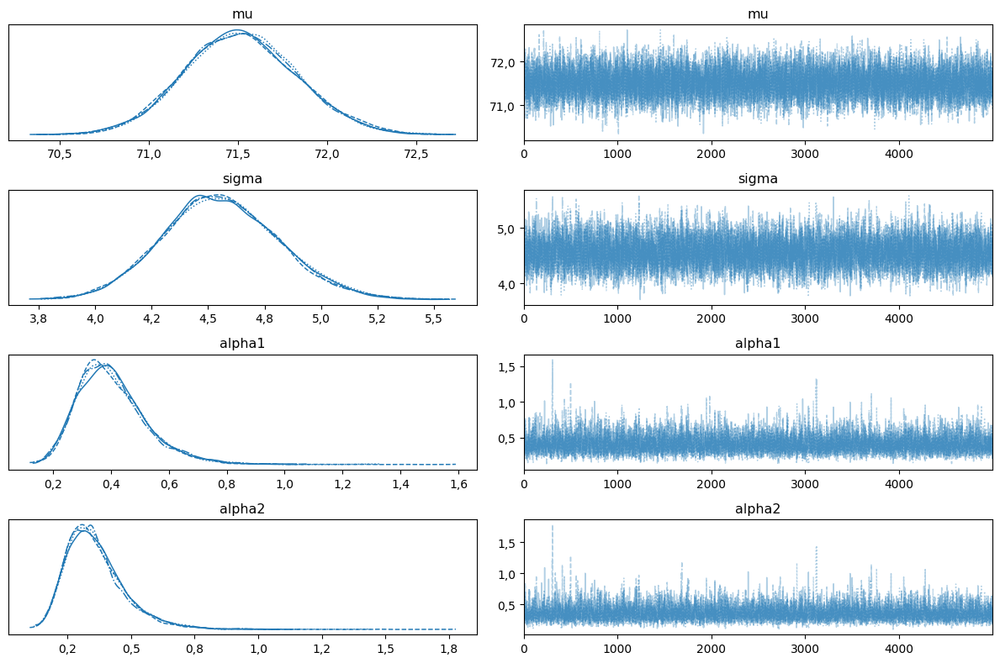

In [70]:
axes = az.plot_trace(traceGMSNBurrIPM)
comma_formatter2 = FuncFormatter(lambda x, p: f'{x:.2f}'.replace('.', ','))
comma_formatter1 = FuncFormatter(lambda x, p: f'{x:.1f}'.replace('.', ','))
for ax in axes[:, 0]:
    ax.xaxis.set_major_formatter(comma_formatter1)
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
    ax.yaxis.set_major_formatter(comma_formatter1)
plt.tight_layout()
plt.show()

Plot Rhat

arviz - WARNING - Shape validation failed: input_shape: (4, 2), minimum_shape: (chains=2, draws=4)


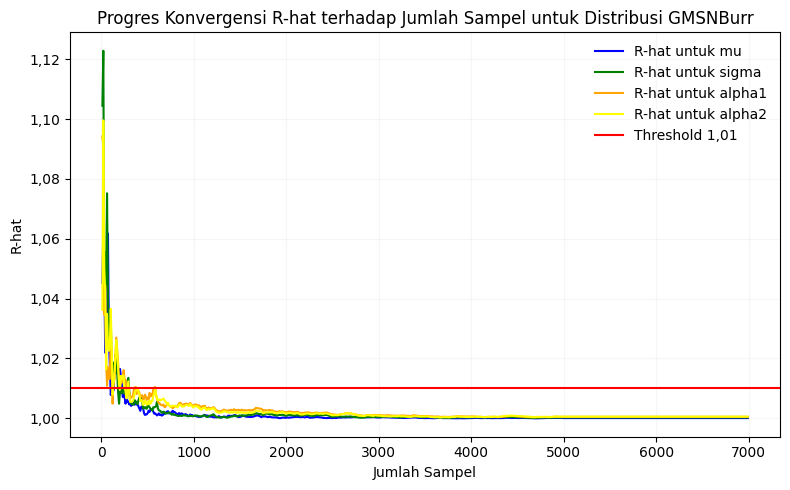

In [35]:
steps = range(1, 7001, 10)
mu_rhat_progress = []
sigma_rhat_progress = []
alpha1_rhat_progress = []
alpha2_rhat_progress = []

for step in steps:
    trace_subset = traceGMSNBurrIPM.sel(draw=slice(0, step))
    rhat = az.rhat(trace_subset)
    mu_rhat_progress.append(rhat["mu"].values)
    sigma_rhat_progress.append(rhat["sigma"].values)
    alpha1_rhat_progress.append(rhat["alpha1"].values)
    alpha2_rhat_progress.append(rhat["alpha2"].values)

# Plot gabungan R-hat untuk mu, sigma, alpha1, dan alpha2
plt.figure(figsize=(8, 5))
plt.plot(steps, mu_rhat_progress, label='R-hat untuk mu', color='blue')
plt.plot(steps, sigma_rhat_progress, label='R-hat untuk sigma', color='green')
plt.plot(steps, alpha1_rhat_progress, label='R-hat untuk alpha1', color='orange')
plt.plot(steps, alpha2_rhat_progress, label='R-hat untuk alpha2', color='yellow')
plt.axhline(1.01, color='red', label='Threshold 1,01')
plt.xlabel("Jumlah Sampel")
plt.ylabel("R-hat")
plt.title("Progres Konvergensi R-hat terhadap Jumlah Sampel untuk Distribusi GMSNBurr")
plt.legend(frameon=False)
plt.grid(alpha=0.1)
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.tight_layout()
plt.show()

##### Pemodelan dengan Distribusi MSNBurr

Sampling MCMC

In [178]:
with pm.Model() as modelMSNBurrIPM:
  mu = pm.Normal("mu", mu=70, sigma=2)
  sigma = pm.HalfCauchy("sigma", beta=3)
  alpha = pm.Gamma("alpha", alpha=3, beta=0.5)
  y = MSNBurr.main("MSNBurrDist", mu=mu, sigma=sigma, alpha=alpha, observed=data_kolom)
  traceMSNBurrIPM = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H2 = pm.loo(traceMSNBurrIPM).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 54 seconds.


Summary hasil

In [179]:
summaryMSNBurrIPM = az.summary(traceMSNBurrIPM, round_to=3, hdi_prob=0.95)
summaryMSNBurrIPM

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,72.017,0.297,71.454,72.612,0.003,0.002,12644.550,14273.907,1.000
sigma,5.174,0.195,4.804,5.566,0.001,0.001,21095.729,15514.962,1.001
alpha,0.940,0.113,0.730,1.164,0.001,0.001,12680.220,13847.499,1.000


Trace plot

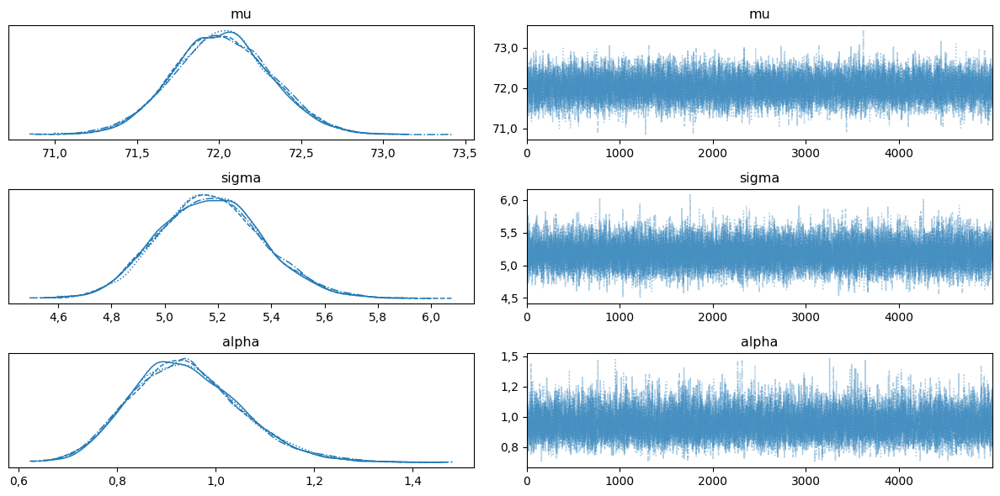

In [73]:
axes = az.plot_trace(traceMSNBurrIPM)
comma_formatter2 = FuncFormatter(lambda x, p: f'{x:.2f}'.replace('.', ','))
comma_formatter1 = FuncFormatter(lambda x, p: f'{x:.1f}'.replace('.', ','))
for ax in axes[:, 0]:
    ax.xaxis.set_major_formatter(comma_formatter1)
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
    ax.yaxis.set_major_formatter(comma_formatter1)
plt.tight_layout()
plt.show()

Plot Rhat

arviz - WARNING - Shape validation failed: input_shape: (4, 2), minimum_shape: (chains=2, draws=4)


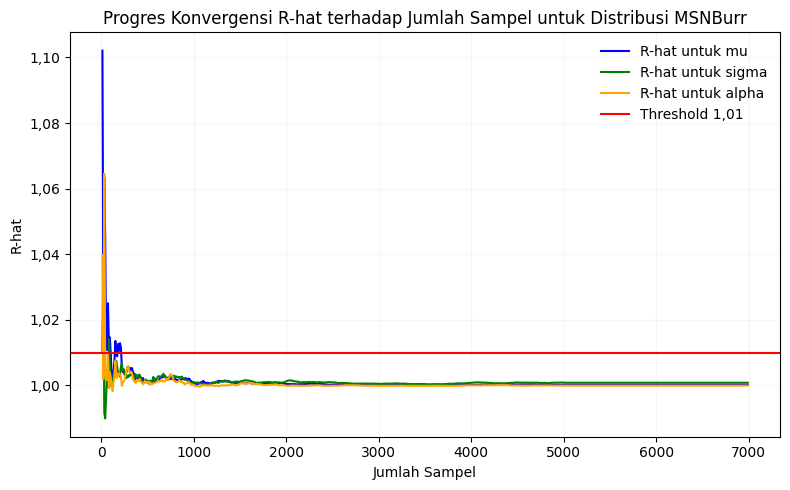

In [39]:
steps = range(1, 7001, 10)
mu_rhat_progress = []
sigma_rhat_progress = []
alpha_rhat_progress = []

for step in steps:
    trace_subset = traceMSNBurrIPM.sel(draw=slice(0, step))
    rhat = az.rhat(trace_subset)
    mu_rhat_progress.append(rhat["mu"].values)
    sigma_rhat_progress.append(rhat["sigma"].values)
    alpha_rhat_progress.append(rhat["alpha"].values)

# Plot gabungan R-hat untuk mu, sigma, dan alpha
plt.figure(figsize=(8, 5))
plt.plot(steps, mu_rhat_progress, label='R-hat untuk mu', color='blue')
plt.plot(steps, sigma_rhat_progress, label='R-hat untuk sigma', color='green')
plt.plot(steps, alpha_rhat_progress, label='R-hat untuk alpha', color='orange')
plt.axhline(1.01, color='red', label='Threshold 1,01')
plt.xlabel("Jumlah Sampel")
plt.ylabel("R-hat")
plt.title("Progres Konvergensi R-hat terhadap Jumlah Sampel untuk Distribusi MSNBurr")
plt.legend(frameon=False)
plt.grid(alpha=0.1)
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.tight_layout()
plt.show()

##### Pemodelan dengan Distribusi MSNBurr-IIa

Sampling MCMC

In [180]:
with pm.Model() as modelMSNBurrIIaIPM:
  mu = pm.Normal("mu", mu=70, sigma=2)
  sigma = pm.HalfCauchy("sigma", beta=3)
  alpha = pm.Gamma("alpha", alpha=3, beta=0.5)
  y = MSNBurrIIa.main("MSNBurrIIaDist", mu=mu, sigma=sigma, alpha=alpha, observed=data_kolom)
  traceMSNBurrIIaIPM = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H3 = pm.loo(traceMSNBurrIIaIPM).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 56 seconds.


Summary hasil

In [182]:
summaryMSNBurrIIaIPM = az.summary(traceMSNBurrIIaIPM, round_to=3, hdi_prob=0.95)
summaryMSNBurrIIaIPM

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,71.875,0.336,71.226,72.539,0.003,0.002,9766.103,11325.704,1.000
sigma,5.174,0.202,4.788,5.575,0.002,0.001,12995.087,12980.456,1.000
alpha,0.984,0.155,0.703,1.290,0.002,0.001,9215.206,10742.447,1.001


Trace plot

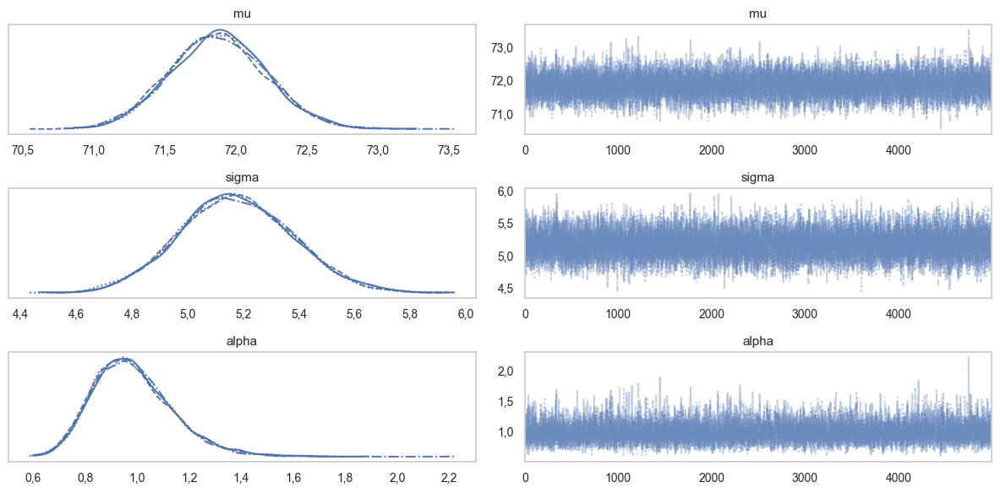

In [181]:
axes = az.plot_trace(traceMSNBurrIIaIPM)
comma_formatter2 = FuncFormatter(lambda x, p: f'{x:.2f}'.replace('.', ','))
comma_formatter1 = FuncFormatter(lambda x, p: f'{x:.1f}'.replace('.', ','))
for ax in axes[:, 0]:
    ax.xaxis.set_major_formatter(comma_formatter1)
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
    ax.yaxis.set_major_formatter(comma_formatter1)
plt.tight_layout()
plt.show()

Plot Rhat

arviz - WARNING - Shape validation failed: input_shape: (4, 1), minimum_shape: (chains=2, draws=4)


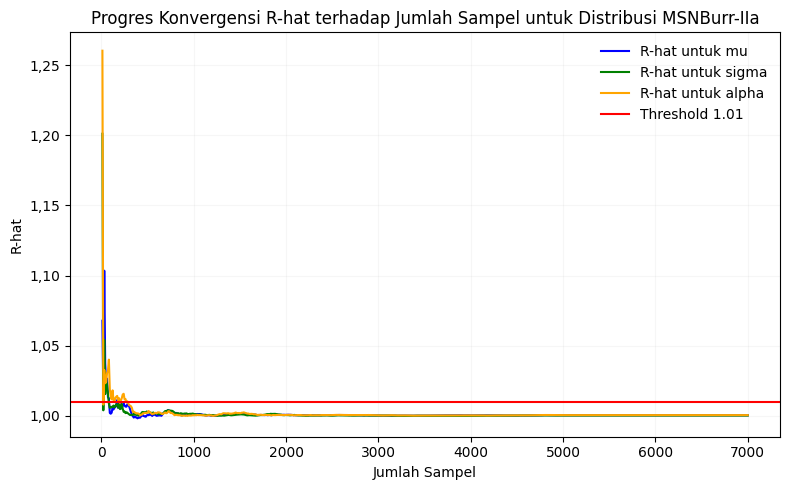

In [43]:
steps = range(0, 7001, 10)
mu_rhat_progress = []
sigma_rhat_progress = []
alpha_rhat_progress = []

for step in steps:
    trace_subset = traceMSNBurrIIaIPM.sel(draw=slice(0, step))
    rhat = az.rhat(trace_subset)
    mu_rhat_progress.append(rhat["mu"].values)
    sigma_rhat_progress.append(rhat["sigma"].values)
    alpha_rhat_progress.append(rhat["alpha"].values)

# Plot gabungan R-hat untuk mu, sigma, dan alpha
plt.figure(figsize=(8, 5))
plt.plot(steps, mu_rhat_progress, label='R-hat untuk mu', color='blue')
plt.plot(steps, sigma_rhat_progress, label='R-hat untuk sigma', color='green')
plt.plot(steps, alpha_rhat_progress, label='R-hat untuk alpha', color='orange')
plt.axhline(1.01, color='red', label='Threshold 1.01')
plt.xlabel("Jumlah Sampel")
plt.ylabel("R-hat")
plt.title("Progres Konvergensi R-hat terhadap Jumlah Sampel untuk Distribusi MSNBurr-IIa")
plt.legend(frameon=False)
plt.grid(alpha=0.1)
comma_formatter = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter)
plt.tight_layout()
plt.show()

#### Inferensi Posterior

##### Posterior Predictive Checking

Distribusi Normal

Sampling: [NormalDist]


Output()

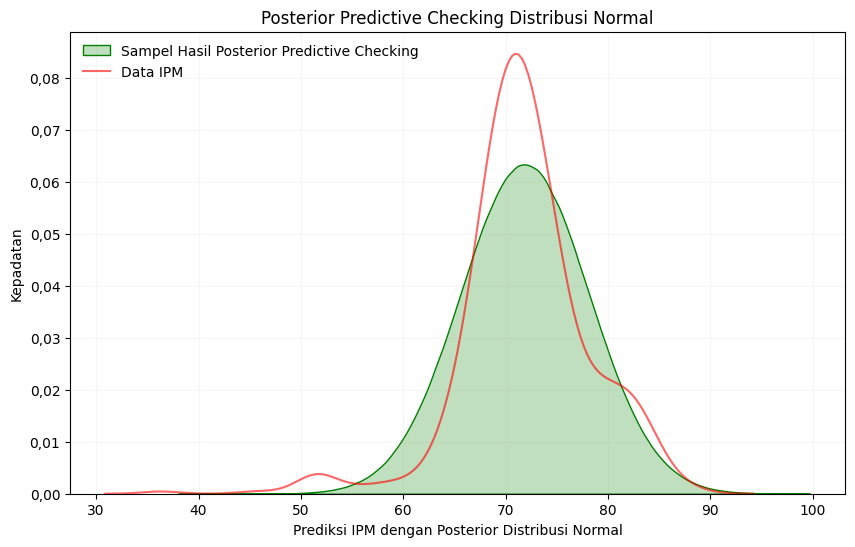

In [95]:
with modelNormalIPM:
  posterior_pred = pm.sample_posterior_predictive(traceNormalIPM, var_names=["NormalDist"])

posterior_samples = posterior_pred['posterior_predictive']['NormalDist'].values.flatten()
filtered_samples = posterior_samples[(posterior_samples >= 0) & (posterior_samples <= 99)]

# visualisasi
plt.figure(figsize=(10,6))
sns.kdeplot(data=filtered_samples, color='green',fill=True,label='Sampel Hasil Posterior Predictive Checking')
sns.kdeplot(data_ppc,  color="red", alpha=0.6, label='Data IPM')
plt.title("Posterior Predictive Checking Distribusi Normal")
plt.xlabel("Prediksi IPM dengan Posterior Distribusi Normal")
plt.ylabel("Kepadatan")
plt.legend(frameon = False, loc="upper left")
comma_formatter_2 = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter_2)
plt.grid(alpha=0.1)
plt.show()

In [96]:
# statistik hasil posterior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 71.88
Median   : 71.88
Std Dev  : 6.30
Min      : 38.77
25% Qtl  : 67.64
75% Qtl  : 76.13
Max      : 98.98


Distribusi GMSNBurr

Sampling: [GMSNBurrDist]


Output()

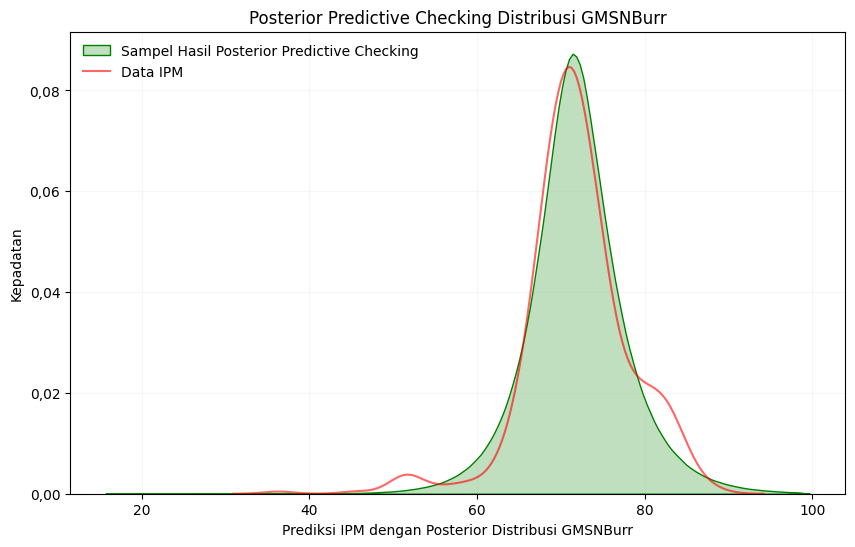

In [97]:
with modelGMSNBurrIPM:
  posterior_pred = pm.sample_posterior_predictive(traceGMSNBurrIPM, var_names=["GMSNBurrDist"])

posterior_samples = posterior_pred['posterior_predictive']['GMSNBurrDist'].values.flatten()
filtered_samples = posterior_samples[(posterior_samples >= 0) & (posterior_samples <= 99)]

# visualisasi
plt.figure(figsize=(10,6))
sns.kdeplot(data=filtered_samples, color='green',fill=True,label='Sampel Hasil Posterior Predictive Checking')
sns.kdeplot(data_ppc,  color="red", alpha=0.6, label='Data IPM')
plt.title("Posterior Predictive Checking Distribusi GMSNBurr")
plt.xlabel("Prediksi IPM dengan Posterior Distribusi GMSNBurr")
plt.ylabel("Kepadatan")
plt.legend(frameon = False, loc="upper left")
comma_formatter_2 = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter_2)
plt.grid(alpha=0.1)
plt.show()

In [98]:
# statistik hasil posterior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 71.88
Median   : 71.73
Std Dev  : 5.96
Min      : 16.36
25% Qtl  : 68.55
75% Qtl  : 75.08
Max      : 99.00


Distribusi MSNBurr

Sampling: [MSNBurrDist]


Output()

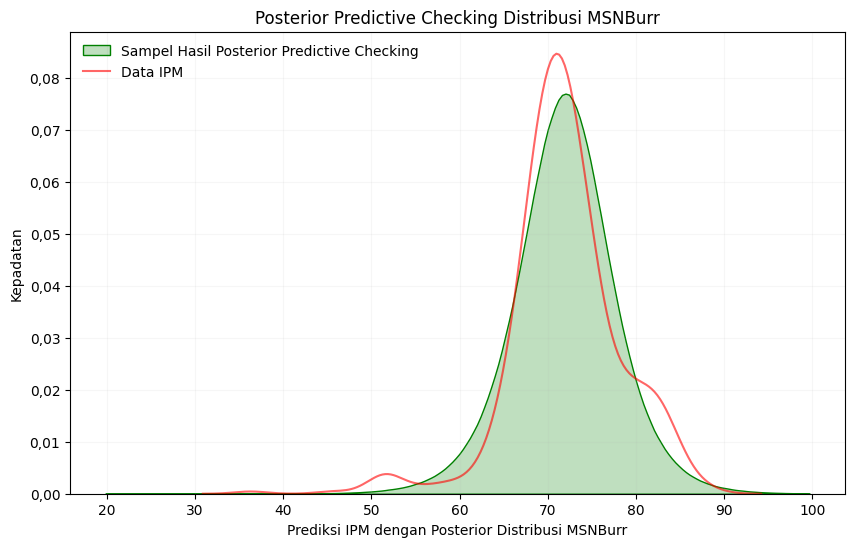

In [99]:
with modelMSNBurrIPM:
  posterior_pred = pm.sample_posterior_predictive(traceMSNBurrIPM, var_names=["MSNBurrDist"])

posterior_samples = posterior_pred['posterior_predictive']['MSNBurrDist'].values.flatten()
filtered_samples = posterior_samples[(posterior_samples >= 0) & (posterior_samples <= 99)]

# visualisasi
plt.figure(figsize=(10,6))
sns.kdeplot(data=filtered_samples, color='green',fill=True,label='Sampel Hasil Posterior Predictive Checking')
sns.kdeplot(data_ppc,  color="red", alpha=0.6, label='Data IPM')
plt.title("Posterior Predictive Checking Distribusi MSNBurr")
plt.xlabel("Prediksi IPM dengan Posterior Distribusi MSNBurr")
plt.ylabel("Kepadatan")
plt.legend(frameon = False, loc="upper left")
comma_formatter_2 = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter_2)
plt.grid(alpha=0.1)
plt.show()

In [100]:
# statistik hasil posterior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 71.86
Median   : 71.92
Std Dev  : 5.91
Min      : 20.53
25% Qtl  : 68.33
75% Qtl  : 75.46
Max      : 99.00


Distribusi MSNBurr-IIa

Sampling: [MSNBurrIIaDist]


Output()

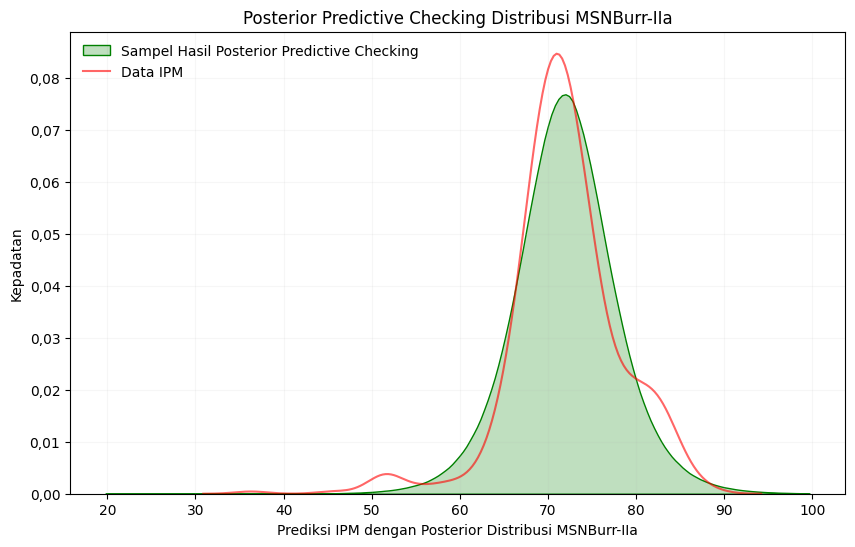

In [101]:
with modelMSNBurrIIaIPM:
  posterior_pred = pm.sample_posterior_predictive(traceMSNBurrIIaIPM, var_names=["MSNBurrIIaDist"])

posterior_samples = posterior_pred['posterior_predictive']['MSNBurrIIaDist'].values.flatten()
filtered_samples = posterior_samples[(posterior_samples >= 0) & (posterior_samples <= 99)]

# visualisasi
plt.figure(figsize=(10,6))
sns.kdeplot(data=filtered_samples, color='green',fill=True,label='Sampel Hasil Posterior Predictive Checking')
sns.kdeplot(data_ppc,  color="red", alpha=0.6, label='Data IPM')
plt.title("Posterior Predictive Checking Distribusi MSNBurr-IIa")
plt.xlabel("Prediksi IPM dengan Posterior Distribusi MSNBurr-IIa")
plt.ylabel("Kepadatan")
plt.legend(frameon = False, loc="upper left")
comma_formatter_2 = FuncFormatter(lambda x, _: f"{x:.2f}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter_2)
plt.grid(alpha=0.1)
plt.show()

In [102]:
# statistik hasil posterior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 71.93
Median   : 71.91
Std Dev  : 5.89
Min      : 20.47
25% Qtl  : 68.36
75% Qtl  : 75.50
Max      : 99.00


##### Bayes Factor

In [183]:
models = {
    "Normal": log_evidence_H0,
    "GMSNBurr": log_evidence_H1,
    "MSNBurr": log_evidence_H2,
    "MSNBurr-IIa": log_evidence_H3
}

model_names = list(models.keys())
bf_matrix = pd.DataFrame(index=model_names, columns=model_names, dtype=float)
log_bf_matrix = pd.DataFrame(index=model_names, columns=model_names, dtype=float)

for model_row in model_names:
    for model_col in model_names:
        log_evidence_row = models[model_row]
        log_evidence_col = models[model_col]

        log_bf = log_evidence_row - log_evidence_col
        bf = np.exp(log_bf)

        bf_matrix.loc[model_row, model_col] = bf
        log_bf_matrix.loc[model_row, model_col] = log_bf

Bayes Factor

In [186]:
print("--- Matriks Perbandingan Bayes Factor (Baris vs. Kolom) ---")
display(bf_matrix.style.format("{:.2f}").background_gradient(cmap='viridis', axis=None))

--- Matriks Perbandingan Bayes Factor (Baris vs. Kolom) ---


,Normal,GMSNBurr,MSNBurr,MSNBurr-IIa
Normal,1.00,0.00,0.00,0.00
GMSNBurr,58490641034962320.00,1.00,6761.63,9359.98
MSNBurr,8650376282113.18,0.00,1.00,1.38
MSNBurr-IIa,6249015633735.64,0.00,0.72,1.00


Log Bayes Factor

In [184]:
print("--- Matriks Perbandingan Log Bayes Factor (Baris vs. Kolom) ---")
display(log_bf_matrix.style.format("{:.2f}").background_gradient(cmap='plasma', axis=None)) # <-- BLOK TAMBAHAN

--- Matriks Perbandingan Log Bayes Factor (Baris vs. Kolom) ---


,Normal,GMSNBurr,MSNBurr,MSNBurr-IIa
Normal,0.00,-38.61,-29.79,-29.46
GMSNBurr,38.61,0.00,8.82,9.14
MSNBurr,29.79,-8.82,0.00,0.33
MSNBurr-IIa,29.46,-9.14,-0.33,0.00


##### LOO-CV

In [185]:
# evaluasi loo
loo_IPM = az.compare({"Normal": traceNormalIPM, "GMSNBurr": traceGMSNBurrIPM, "MSNBurr": traceMSNBurrIPM, "MSNBurrIIa": traceMSNBurrIIaIPM})
loo_IPM

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
GMSNBurr,0,-1638.208178,3.896331,0.000000,1.000000e+00,24.090548,0.000000,False,log
MSNBurr,1,-1647.027197,3.721452,8.819019,0.000000e+00,23.807607,2.389941,False,log
MSNBurrIIa,2,-1647.352376,3.798320,9.144198,0.000000e+00,24.313519,2.547261,False,log
Normal,3,-1676.815821,3.800572,38.607643,2.014389e-12,27.205119,10.126337,False,log


In [187]:
loo_normal = az.loo(traceNormalIPM)
print("--- LOO Normal ---")
print(loo_normal)
loo_gmsnburr = az.loo(traceGMSNBurrIPM)
print("\n--- LOO GMSNBurr ---")
print(loo_gmsnburr)
loo_msnburr = az.loo(traceMSNBurrIPM)
print("\n--- LOO MSNBurr ---")
print(loo_msnburr)
loo_msnburriia = az.loo(traceMSNBurrIIaIPM)
print("\n--- LOO MSNBurr-IIa ---")
print(loo_msnburriia)

--- LOO Normal ---
Computed from 20000 posterior samples and 514 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -1676.82    27.21
p_loo        3.80        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      514  100.0%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%


--- LOO GMSNBurr ---
Computed from 20000 posterior samples and 514 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -1638.21    24.09
p_loo        3.90        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      514  100.0%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%


--- LOO MSNBurr ---
Computed from 20000 posterior samples and 514 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -1647.03    23.81
p_loo        3.72        -
------

Pareto k diagnostic values:
                         Cou

##### Visualiasasi Perbandingan Model

Visualisasi perbandingan data asli dengan hasil estimasi distribusi GMSNBurr dan Normal

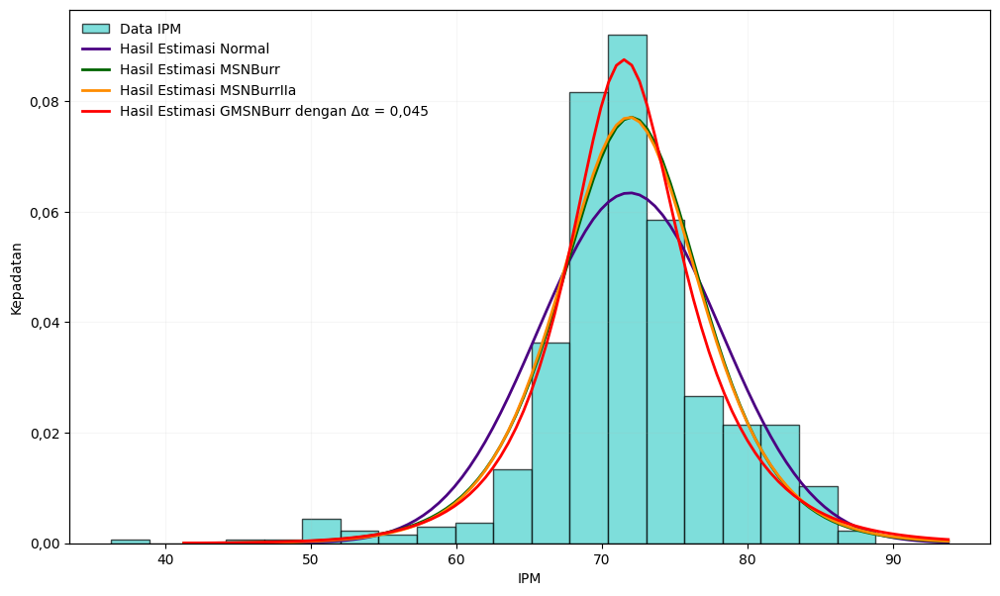

In [52]:
# rentang data
x = np.linspace(minIPM + 5, maxIPM + 5, 100)

# distribusi
NormalIPMParams = summaryNormalIPM['mean']
GMSNBurrIPMParams = summaryGMSNBurrIPM['mean']
MSNBurrIPMParams = summaryMSNBurrIPM['mean']
MSNBurrIIaIPMParams = summaryMSNBurrIIaIPM['mean']
y1 = [math.exp(rv_logp_fn(value=xi,
                          mu=GMSNBurrIPMParams.iloc[0],
                          sigma=GMSNBurrIPMParams.iloc[1],
                          alpha1=GMSNBurrIPMParams.iloc[2],
                          alpha2=GMSNBurrIPMParams.iloc[3])) for xi in x]
y2 = [norm.pdf(x, NormalIPMParams.iloc[0], NormalIPMParams.iloc[1]) for x in x]
y3 = [math.exp(rv_logpMSNBurr_fn(value=xi,
                          mu=MSNBurrIPMParams.iloc[0],
                          sigma=MSNBurrIPMParams.iloc[1],
                          alpha=MSNBurrIPMParams.iloc[2])) for xi in x]
y4 = [math.exp(rv_logpMSNBurrIIa_fn(value=xi,
                          mu=MSNBurrIIaIPMParams.iloc[0],
                          sigma=MSNBurrIIaIPMParams.iloc[1],
                          alpha=MSNBurrIIaIPMParams.iloc[2])) for xi in x]


# delta alpha
delta_alpha_ipm = GMSNBurrIPMParams.iloc[2] - GMSNBurrIPMParams.iloc[3]
delta_alpha_ipm_str = str(round(delta_alpha_ipm, 3)).replace('.', ',')
comma_formatter = FuncFormatter(lambda val, pos: f"{val:.2f}".replace('.', ','))

# visualisasi
fig, ax = plt.subplots(figsize=(12, 7))
ax.hist(data_kolom, label='Data IPM', color='mediumturquoise', density=True, bins=20, alpha=0.7, edgecolor='k')
ax.yaxis.set_major_formatter(comma_formatter)
ax2 = ax.twinx()
ax2.plot(x, y2, label='Hasil Estimasi Normal', color='indigo', linewidth=2)
ax2.plot(x, y3, label='Hasil Estimasi MSNBurr', color='darkgreen', linewidth=2)
ax2.plot(x, y4, label='Hasil Estimasi MSNBurrIIa', color='darkorange', linewidth=2)
ax2.plot(x, y1, label=f'Hasil Estimasi GMSNBurr dengan \u0394\u03B1 = {delta_alpha_ipm_str}', color='red', linewidth=2)
ax2.set_ylim(ax.get_ylim())
ax2.set_yticklabels([])
ax2.set_yticks([])
ax.set_xlabel("IPM")
ax.set_ylabel("Kepadatan")
ax.grid(True, alpha=0.1, zorder=0)
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left', fontsize=10, frameon=False)
plt.show()

##### Analisis Sensitivitas

Analisis sensitivitas untuk model terpilih yaitu GMSNBurr

In [ ]:
summaryGMSNBurrIPM = az.summary(traceGMSNBurrIPM, round_to=3, hdi_prob=0.95)
summaryGMSNBurrIPM

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,71.506,0.305,70.884,72.086,0.003,0.003,8447.579,9355.298,1.000
sigma,4.556,0.254,4.068,5.049,0.003,0.002,6537.433,8800.817,1.001
alpha1,0.403,0.118,0.195,0.638,0.002,0.001,5531.863,7148.093,1.001
alpha2,0.357,0.114,0.164,0.588,0.002,0.001,5325.997,6685.076,1.001


In [119]:
with pm.Model() as modelGMSNBurrIPMInformatif:
  mu = pm.Normal("mu", mu=71, sigma=1)
  sigma = pm.HalfCauchy("sigma", beta=1)
  alpha1 = pm.Lognormal("alpha1", mu=-0.9, sigma=0.1)
  alpha2 = pm.Lognormal("alpha2", mu=-1, sigma=0.1)
  y = GMSNBurr.main("GMSNBurrDist", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=data_kolom)
  traceGMSNBurrIPMInformatif = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H1 = pm.loo(traceGMSNBurrIPMInformatif).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 62 seconds.


In [120]:
summaryGMSNBurrIPMInformatif = az.summary(traceGMSNBurrIPMInformatif, round_to=3, hdi_prob=0.95)
summaryGMSNBurrIPMInformatif

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,71.514,0.263,70.991,72.024,0.002,0.002,12510.260,12230.108,1.0
sigma,4.567,0.191,4.179,4.922,0.001,0.001,17364.041,11766.185,1.0
alpha1,0.399,0.032,0.337,0.460,0.000,0.000,12754.714,12304.766,1.0
alpha2,0.354,0.029,0.300,0.412,0.000,0.000,12673.124,12652.508,1.0


In [122]:
with pm.Model() as modelGMSNBurrIPMNon:
  mu = pm.Uniform("mu", upper=100, lower=0)
  sigma = pm.HalfCauchy("sigma", beta=25)
  alpha1 = pm.Lognormal("alpha1", mu=0.75, sigma=0.75)
  alpha2 = pm.Lognormal("alpha2", mu=0.75, sigma=0.75)
  y = GMSNBurr.main("GMSNBurrDist", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2, observed=data_kolom)
  traceGMSNBurrIPMNon = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H1 = pm.loo(traceGMSNBurrIPMNon).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma, alpha1, alpha2]


Output()

Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 79 seconds.


In [123]:
summaryGMSNBurrIPMNon = az.summary(traceGMSNBurrIPMNon, round_to=3, hdi_prob=0.95)
summaryGMSNBurrIPMNon

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,71.549,0.318,70.923,72.172,0.004,0.003,7649.532,8396.996,1.0
sigma,4.582,0.258,4.093,5.109,0.003,0.002,6142.184,8227.873,1.0
alpha1,0.411,0.123,0.199,0.663,0.002,0.001,5928.454,7379.600,1.0
alpha2,0.369,0.122,0.165,0.610,0.002,0.002,5701.978,6784.988,1.0


Visualisasi perbandingan model GMSNBurr dengan prior yang berbeda-beda

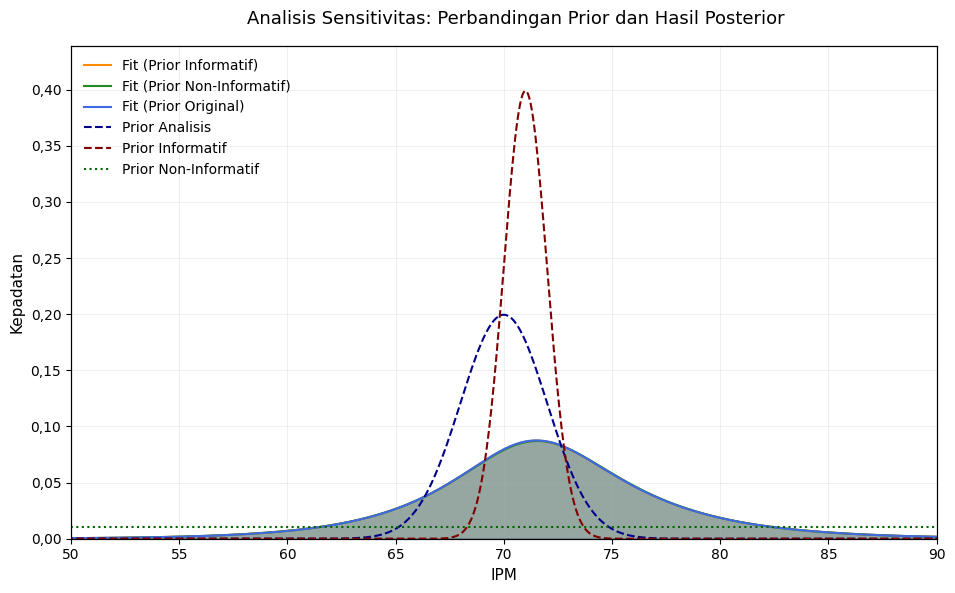

In [151]:
x = np.linspace(40, 100, 1000)

# prior terpilih
GMSNBurrIPMParams = summaryGMSNBurrIPM['mean']
pdf_ori = [math.exp(rv_logp_fn(value=xi,
                              mu=GMSNBurrIPMParams.iloc[0],
                              sigma=GMSNBurrIPMParams.iloc[1],
                              alpha1=GMSNBurrIPMParams.iloc[2],
                              alpha2=GMSNBurrIPMParams.iloc[3])) for xi in x]

# prior informatif
GMSNBurrInformatifParams = summaryGMSNBurrIPMInformatif['mean']
pdf_informatif = [math.exp(rv_logp_fn(value=xi,
                                      mu=GMSNBurrInformatifParams.iloc[0],
                                      sigma=GMSNBurrInformatifParams.iloc[1],
                                      alpha1=GMSNBurrInformatifParams.iloc[2],
                                      alpha2=GMSNBurrInformatifParams.iloc[3])) for xi in x]

# prior non-informatif
GMSNBurrNonParams = summaryGMSNBurrIPMNon['mean']
pdf_non = [math.exp(rv_logp_fn(value=xi,
                              mu=GMSNBurrNonParams.iloc[0],
                              sigma=GMSNBurrNonParams.iloc[1],
                              alpha1=GMSNBurrNonParams.iloc[2],
                              alpha2=GMSNBurrNonParams.iloc[3])) for xi in x]

# PDF untuk distribusi prior
prior_pdf_informatif = st.norm.pdf(x, loc=71, scale=1)
prior_pdf_non = st.uniform.pdf(x, loc=0, scale=100)
prior_pdf_original = st.norm.pdf(x, loc=70, scale=2) 

fig, ax1 = plt.subplots(figsize=(10, 6))
ax1.plot(x, pdf_informatif, label='Fit (Prior Informatif)', color='darkorange')
ax1.plot(x, pdf_non, label='Fit (Prior Non-Informatif)', color='forestgreen')
ax1.plot(x, pdf_ori, label='Fit (Prior Original)', color='royalblue')
ax1.fill_between(x, pdf_informatif, color='darkorange', alpha=0.3)
ax1.fill_between(x, pdf_non, color='forestgreen', alpha=0.3)
ax1.fill_between(x, pdf_ori, color='royalblue', alpha=0.3)
ax1.set_xlabel("IPM", fontsize=11)
ax1.tick_params(axis='y', labelcolor='black')
comma_formatter_left = FuncFormatter(lambda y, _: f"{y:.2f}".replace('.', ','))
ax1.yaxis.set_major_formatter(comma_formatter_left)
ax1.grid(alpha=0.2)
ax2 = ax1.twinx() 
ax2.plot(x, prior_pdf_original, label='Prior Analisis', color='darkblue', linestyle='--')
ax2.plot(x, prior_pdf_informatif, label='Prior Informatif', color='maroon', linestyle='--')
ax2.plot(x, prior_pdf_non, label='Prior Non-Informatif', color='darkgreen', linestyle=':')
ax2.set_ylabel("Kepadatan Prior", color='black', fontsize=12)
ax2.tick_params(axis='y', labelcolor='black')
comma_formatter_right = FuncFormatter(lambda y, _: f"{y:.2f}".replace('.', ','))
ax2.yaxis.set_major_formatter(comma_formatter_right)
ax2.set_ylim(bottom=0)
fig.suptitle('Analisis Sensitivitas: Perbandingan Prior dan Hasil Posterior', fontsize=13)
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper left', frameon=False)
fig.tight_layout()
max_pdf = max(max(pdf_ori), max(pdf_informatif), max(pdf_non))
max_prior = max(max(prior_pdf_original), max(prior_pdf_informatif), max(prior_pdf_non))
y_max = max(max_pdf, max_prior) * 1.1
ax1.set_xlim(50, 90)
ax2.set_xlim(50, 90)
ax1.set_ylim(0, y_max)
ax2.set_ylim(0, y_max)
ax1.set_ylabel("Kepadatan", color='black', fontsize=11)
ax2.set_yticklabels([])
ax2.set_ylabel("")
ax2.tick_params(axis='y', which='both', length=0)
plt.show()

#### Tambahan

Cari kuantil dengan rumus kuantil GMSNBurr menjadi 4 kelompok

In [ ]:
mu_est = GMSNBurrIPMParams.iloc[2]
sigma_est = GMSNBurrIPMParams.iloc[3]
alpha1_est = GMSNBurrIPMParams.iloc[0]
alpha2_est = GMSNBurrIPMParams.iloc[1]

q1_ipm = GMSNBurr.quantile(0.25, mu_est, sigma_est, alpha1_est, alpha2_est)
q2_ipm = GMSNBurr.quantile(0.50, mu_est, sigma_est, alpha1_est, alpha2_est)
q3_ipm = GMSNBurr.quantile(0.75, mu_est, sigma_est, alpha1_est, alpha2_est)

print(f"Quantile 0.25: {q1_ipm}")
print(f"Quantile 0.50: {q2_ipm}")
print(f"Quantile 0.75: {q3_ipm}")

Quantile 0.25: 68.36178176349348
Quantile 0.50: 71.93150471058492
Quantile 0.75: 75.67651570403515


Labeling sesuai dengan kelompok kuantil

In [ ]:
def kelompokkan(ipm):
    if pd.isna(ipm):
        return 'Tidak Ada Data'
    elif ipm < q1_ipm:
        return 'A'
    elif ipm < q2_ipm:
        return 'B'
    elif ipm < q3_ipm:
        return 'C'
    else:
        return 'D'

data['kelompok'] = data[2024].apply(kelompokkan)
data

,Kabupaten/Kota,2024,kelompok
0,Simeulue,69.01,B
1,Aceh Singkil,70.75,B
2,Aceh Selatan,69.10,B
3,Aceh Tenggara,71.70,B
4,Aceh Timur,69.87,B
...,...,...,...
535,Tolikara,52.05,A
536,Mamberamo Tengah,50.72,A
537,Yalimo,51.85,A
538,Yahukimo,51.98,A


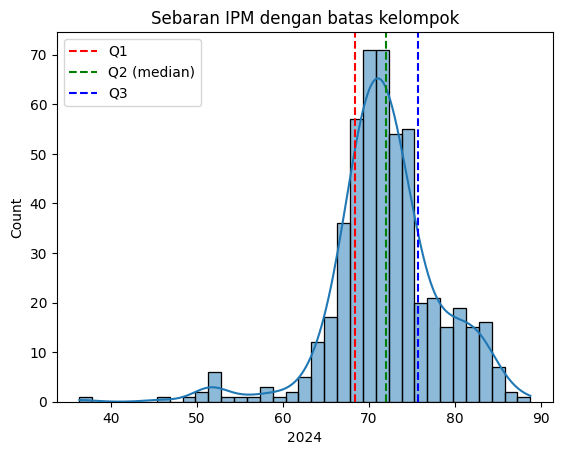

In [ ]:
sns.histplot(data[2024], kde=True)
plt.axvline(q1_ipm, color='red', linestyle='--', label='Q1')
plt.axvline(q2_ipm, color='green', linestyle='--', label='Q2 (median)')
plt.axvline(q3_ipm, color='blue', linestyle='--', label='Q3')
plt.legend()
plt.title('Sebaran IPM dengan batas kelompok')
plt.show()

Unduh shape file Indonesia

In [ ]:
import geopandas as gpd
import zipfile

file_id_shp = '1d7_Ut1y5J2ZtAJQnxQ-2_AsEddacuFk2'
url_shp = f'https://drive.google.com/uc?id={file_id_shp}'
output_shp = 'Kab_Kota.zip'
gdown.download(url_shp, output_shp, quiet=True)
with zipfile.ZipFile(output_shp, 'r') as zip_ref:
    zip_ref.extractall('Kab_Kota')
gdf = gpd.read_file('Kab_Kota/Kab_Kota.shp')
data.rename(columns={"Kabupaten/Kota": "KAB_KOTA"}, inplace=True)
gdf = gdf.merge(data, on='KAB_KOTA')

Visualisasi

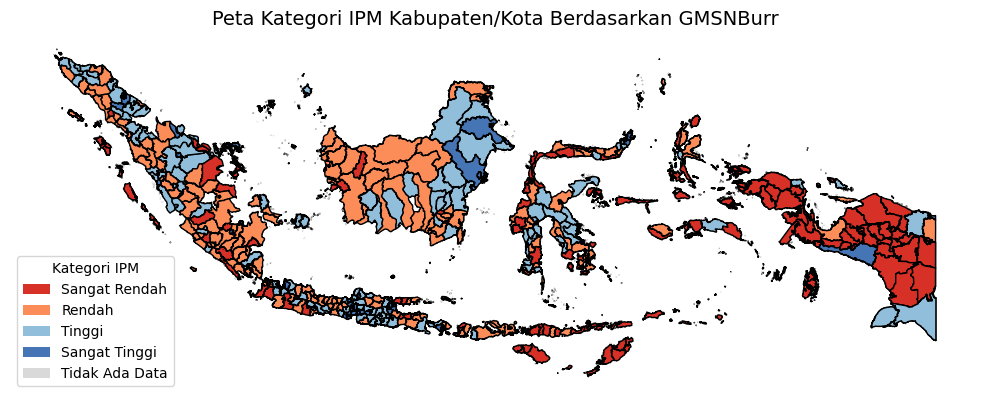

In [ ]:
warna = {
    'A': '#d73027',              # sangat rendah (merah tua)
    'B': '#fc8d59',              # rendah (oranye)
    'C': '#91bfdb',              # tinggi (biru muda)
    'D': '#4575b4',              # sangat tinggi (biru tua)
    'Tidak Ada Data': '#d9d9d9'  # abu-abu
}

label_legenda = {
    'A': 'Sangat Rendah',
    'B': 'Rendah',
    'C': 'Tinggi',
    'D': 'Sangat Tinggi',
    'Tidak Ada Data': 'Tidak Ada Data'
}

gdf['warna'] = gdf['kelompok'].map(warna)
fig, ax = plt.subplots(figsize=(10, 12))
gdf.plot(color=gdf['warna'], edgecolor='black', ax=ax)

from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=warna[k], label=label_legenda[k]) for k in warna.keys()]
ax.legend(handles=legend_elements, title="Kategori IPM", loc='lower left')

plt.title("Peta Kategori IPM Kabupaten/Kota Berdasarkan GMSNBurr", fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()


### Data PDRB Regresi

#### Prior

In [12]:
# url data
file_id = '1U-ZcwXiPx6jjyZs5oyccN0y2J4pCJLWu'
url = f'https://drive.google.com/uc?id={file_id}'
output = 'Regres.xlsx'

# unduh data
gdown.download(url, output, quiet=True)
data_ppc_regresi = pd.read_excel('Regres.xlsx')

In [14]:
b0_inter = 29614000
b_jp = -36.270
b_invest = 4.6615

##### Prior untuk Distribusi Normal

Sampling: [NormalRegres, b0, b1, b2, sigma]


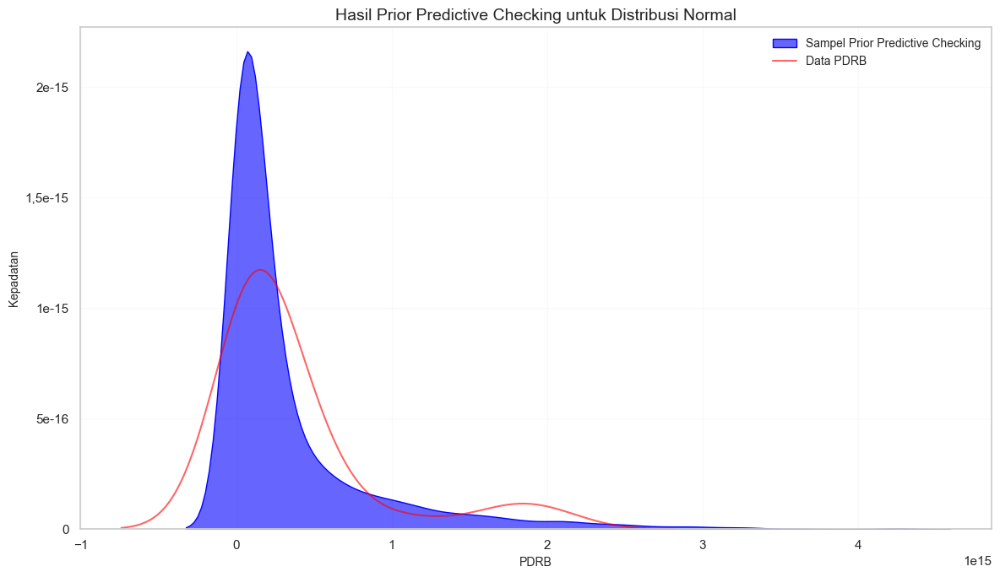

In [164]:
with pm.Model() as ppc_normal_regresi:
    b0 = pm.Normal('b0', mu=29614000, sigma=10) # Prior untuk intercept
    b1 = pm.Normal('b1', mu=-30, sigma=10)  # Prior untuk jp
    b2 = pm.Normal('b2', mu=6, sigma=5) # Prior unntuk invest
    sigma = pm.HalfCauchy('sigma', 10e5) # Prior untuk standar deviasi
    mu = b0 + b1 * data_ppc_regresi['JP'] + b2 * data_ppc_regresi['Invest'] 
    y = pm.Normal('NormalRegres', mu=mu, sigma=sigma)
    prior_pred = pm.sample_prior_predictive(samples=100, random_seed=42, return_inferencedata=True)
prior_samples = prior_pred["prior"]["NormalRegres"].values.flatten()
prior_samples = prior_samples[(prior_samples > 0)]
fig, ax = plt.subplots(figsize=(12, 7))
sns.kdeplot(prior_samples, ax=ax, fill=True, color="blue", alpha=0.6, label='Sampel Prior Predictive Checking')
sns.kdeplot(data_ppc_regresi['PDRB'], ax=ax, color="red", alpha=0.6, label='Data PDRB')
ax.set_title('Hasil Prior Predictive Checking untuk Distribusi Normal', fontsize=14)
ax.set_xlabel('PDRB', fontsize=10)
ax.set_ylabel('Kepadatan', fontsize=10)
ax.grid(alpha=0.1)
comma_formatter_1 = FuncFormatter(lambda x, _: f"{x:g}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter_1)
ax.legend(loc="upper right", fontsize=10, frameon=False)
plt.tight_layout()
plt.show()

In [155]:
# statistik hasil prior predictive checking
mean_val = np.mean(prior_samples)
median_val = np.median(prior_samples)
std_val = np.std(prior_samples)
min_val = np.min(prior_samples)
max_val = np.max(prior_samples)
q25, q75 = np.percentile(prior_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 331219268911397.62
Median   : 117994041180104.73
Std Dev  : 530821566591737.25
Min      : 77080890651.11
25% Qtl  : 37510547230094.34
75% Qtl  : 343595040940579.81
Max      : 4268846421361356.00


##### Prior Distribusi GMSNBurr

Sampling: [GMSNBurrRegres, alpha1, alpha2, b0, b1, b2, sigma]


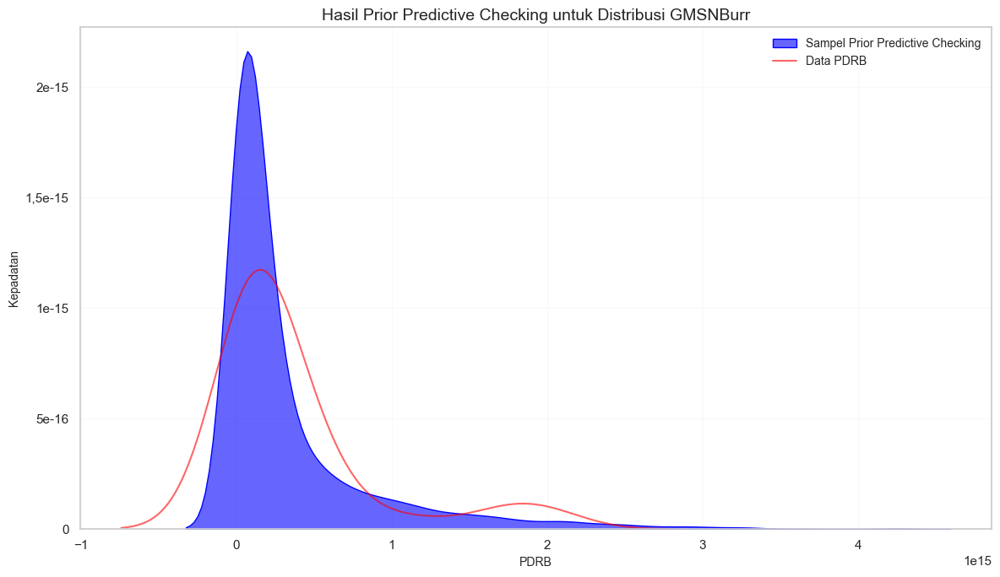

In [156]:
with pm.Model() as ppc_gmsnburr_regresi:
    b0 = pm.Normal('b0', mu=29614000, sigma=10) # Prior untuk intercept
    b1 = pm.Normal('b1', mu=-30, sigma=10)  # Prior untuk jp
    b2 = pm.Normal('b2', mu=6, sigma=5) # Prior unntuk invest
    sigma = pm.HalfCauchy('sigma', 10e5) # Prior untuk standar deviasi eror
    alpha1 = pm.LogNormal("alpha1", mu=1.25, sigma=0.5)
    alpha2 = pm.LogNormal("alpha2", mu=0.25, sigma=0.5)
    mu = b0 + b1 * data_ppc_regresi['JP'] + b2 * data_ppc_regresi['Invest']
    y = GMSNBurr.main("GMSNBurrRegres", mu=mu, sigma=sigma, alpha1=alpha1, alpha2=alpha2) 
    prior_pred = pm.sample_prior_predictive(samples=100, random_seed=42, return_inferencedata=True)
prior_samples = prior_pred["prior"]["GMSNBurrRegres"].values.flatten()
prior_samples = prior_samples[(prior_samples > 0)]
fig, ax = plt.subplots(figsize=(12, 7))
sns.kdeplot(prior_samples, ax=ax, fill=True, color="blue", alpha=0.6, label='Sampel Prior Predictive Checking')
sns.kdeplot(data_ppc_regresi['PDRB'], ax=ax, color="red", alpha=0.6, label='Data PDRB')
ax.set_title('Hasil Prior Predictive Checking untuk Distribusi GMSNBurr', fontsize=14)
ax.set_xlabel('PDRB', fontsize=10)
ax.set_ylabel('Kepadatan', fontsize=10)
ax.grid(alpha=0.1)
comma_formatter_1 = FuncFormatter(lambda x, _: f"{x:g}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter_1)
ax.legend(loc="upper right", fontsize=10, frameon=False)
plt.tight_layout()
plt.show()

In [157]:
# statistik hasil prior predictive checking
mean_val = np.mean(prior_samples)
median_val = np.median(prior_samples)
std_val = np.std(prior_samples)
min_val = np.min(prior_samples)
max_val = np.max(prior_samples)
q25, q75 = np.percentile(prior_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 331219271108824.81
Median   : 117994179969270.69
Std Dev  : 530821566996268.94
Min      : 77086897292.49
25% Qtl  : 37510546362938.22
75% Qtl  : 343595060686525.75
Max      : 4268846421437128.50


##### Prior Distribusi MSNBurr

Sampling: [MSNBurrRegres, alpha, b0, b1, b2, sigma]


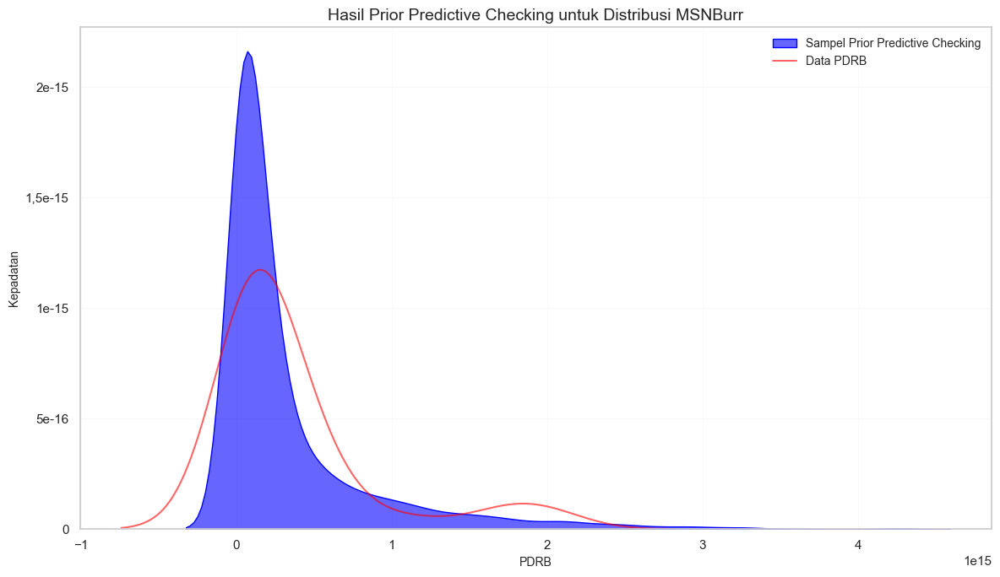

In [158]:
with pm.Model() as ppc_msnburr_regresi:
    b0 = pm.Normal('b0', mu=29614000, sigma=10) # Prior untuk intercept
    b1 = pm.Normal('b1', mu=-30, sigma=10)  # Prior untuk jp
    b2 = pm.Normal('b2', mu=6, sigma=5) # Prior unntuk invest
    sigma = pm.HalfCauchy('sigma', 10e5) # Prior untuk standar deviasi eror
    alpha = pm.Gamma("alpha", alpha=4, beta=2)
    mu = b0 + b1 * data_ppc_regresi['JP'] + b2 * data_ppc_regresi['Invest']
    y = MSNBurr.main("MSNBurrRegres", mu=mu, sigma=sigma, alpha=alpha) 
    prior_pred = pm.sample_prior_predictive(samples=100, random_seed=42, return_inferencedata=True)
prior_samples = prior_pred["prior"]["MSNBurrRegres"].values.flatten()
prior_samples = prior_samples[(prior_samples > 0)]
fig, ax = plt.subplots(figsize=(12, 7))
sns.kdeplot(prior_samples, ax=ax, fill=True, color="blue", alpha=0.6, label='Sampel Prior Predictive Checking')
sns.kdeplot(data_ppc_regresi['PDRB'], ax=ax, color="red", alpha=0.6, label='Data PDRB')
ax.set_title('Hasil Prior Predictive Checking untuk Distribusi MSNBurr', fontsize=14)
ax.set_xlabel('PDRB', fontsize=10)
ax.set_ylabel('Kepadatan', fontsize=10)
ax.grid(alpha=0.1)
comma_formatter_1 = FuncFormatter(lambda x, _: f"{x:g}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter_1)
ax.legend(loc="upper right", fontsize=10, frameon=False)
plt.tight_layout()
plt.show()

In [159]:
# statistik hasil prior predictive checking
mean_val = np.mean(prior_samples)
median_val = np.median(prior_samples)
std_val = np.std(prior_samples)
min_val = np.min(prior_samples)
max_val = np.max(prior_samples)
q25, q75 = np.percentile(prior_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 331219268070971.75
Median   : 117994061400408.72
Std Dev  : 530821566128120.38
Min      : 77080036459.89
25% Qtl  : 37510549486885.57
75% Qtl  : 343595027519175.12
Max      : 4268846421369126.00


##### Prior Distribusi MSNBurr-IIa

Sampling: [MSNBurrIIaRegres, alpha, b0, b1, b2, sigma]


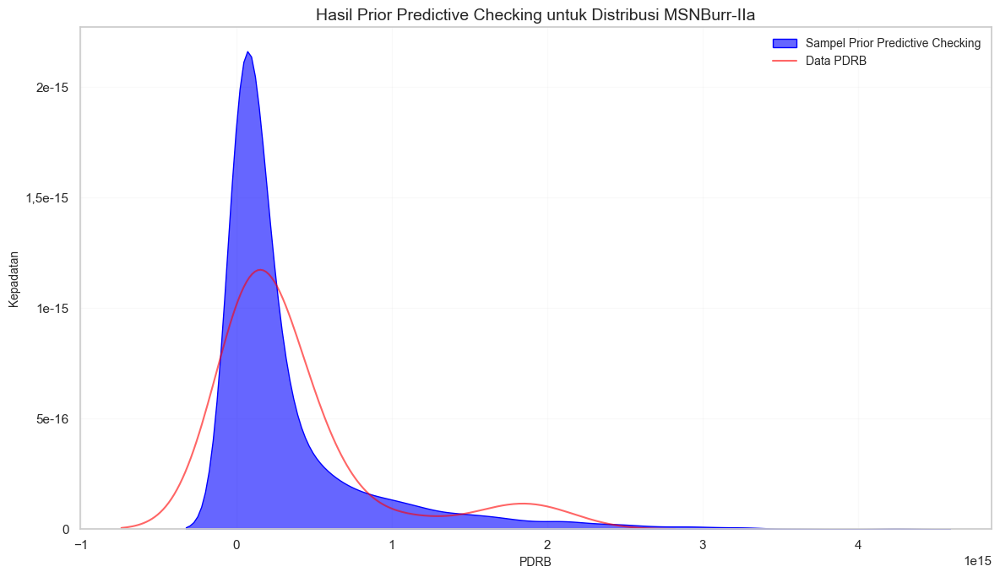

In [160]:
with pm.Model() as ppc_msnburriia_regresi:
    b0 = pm.Normal('b0', mu=29614000, sigma=10) # Prior untuk intercept
    b1 = pm.Normal('b1', mu=-30, sigma=10)  # Prior untuk jp
    b2 = pm.Normal('b2', mu=6, sigma=5) # Prior unntuk invest
    sigma = pm.HalfCauchy('sigma', 10e5) # Prior untuk standar deviasi eror
    alpha = pm.Gamma("alpha", alpha=4, beta=2)
    mu = b0 + b1 * data_ppc_regresi['JP'] + b2 * data_ppc_regresi['Invest']
    y = MSNBurrIIa.main("MSNBurrIIaRegres", mu=mu, sigma=sigma, alpha=alpha) 
    prior_pred = pm.sample_prior_predictive(samples=100, random_seed=42, return_inferencedata=True)
prior_samples = prior_pred["prior"]["MSNBurrIIaRegres"].values.flatten()
prior_samples = prior_samples[(prior_samples > 0)]
fig, ax = plt.subplots(figsize=(12, 7))
sns.kdeplot(prior_samples, ax=ax, fill=True, color="blue", alpha=0.6, label='Sampel Prior Predictive Checking')
sns.kdeplot(data_ppc_regresi['PDRB'], ax=ax, color="red", alpha=0.6, label='Data PDRB')
ax.set_title('Hasil Prior Predictive Checking untuk Distribusi MSNBurr-IIa', fontsize=14)
ax.set_xlabel('PDRB', fontsize=10)
ax.set_ylabel('Kepadatan', fontsize=10)
ax.grid(alpha=0.1)
comma_formatter_1 = FuncFormatter(lambda x, _: f"{x:g}".replace('.', ','))
plt.gca().yaxis.set_major_formatter(comma_formatter_1)
ax.legend(loc="upper right", fontsize=10, frameon=False)
plt.tight_layout()
plt.show()

In [161]:
# statistik hasil prior predictive checking
mean_val = np.mean(prior_samples)
median_val = np.median(prior_samples)
std_val = np.std(prior_samples)
min_val = np.min(prior_samples)
max_val = np.max(prior_samples)
q25, q75 = np.percentile(prior_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 331219266070462.38
Median   : 117994013529950.75
Std Dev  : 530821565799165.56
Min      : 77079256198.81
25% Qtl  : 37510549166406.63
75% Qtl  : 343595025192259.00
Max      : 4268846421303313.00


#### Likelihood

##### Import Data

In [12]:
# url data
file_id = '1U-ZcwXiPx6jjyZs5oyccN0y2J4pCJLWu'
url = f'https://drive.google.com/uc?id={file_id}'
output = 'Regres.xlsx'

# unduh data
gdown.download(url, output, quiet=True)
dataRegresi = pd.read_excel('Regres.xlsx')

##### Eksplorasi Data

In [13]:
# data awal
dataRegresi.head()

,Provinsi,JP,Invest,PDRB
0,ACEH,3991532,12739831800000,1.469324e+14
1,SUMATERA UTARA,11153308,39899506900000,6.022360e+14
2,SUMATERA BARAT,4287696,6360619100000,1.910706e+14
3,RIAU,4873512,79925499900000,5.518285e+14
4,JAMBI,2728376,9638636300000,1.692776e+14


In [14]:
# informasi dasar data
print(dataRegresi.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Provinsi  34 non-null     object 
 1   JP        34 non-null     int64  
 2   Invest    34 non-null     int64  
 3   PDRB      34 non-null     float64
dtypes: float64(1), int64(2), object(1)
memory usage: 1.2+ KB
None


In [15]:
# deskripsi data
data_kolom = dataRegresi.drop(columns=['Provinsi'])
hasil_statistik = []

for kolom in data_kolom.columns:
    mean = data_kolom[kolom].mean()
    std_dev = data_kolom[kolom].std()
    median = data_kolom[kolom].median()
    skewness = skew(data_kolom[kolom], nan_policy='omit')
    kurt = kurtosis(data_kolom[kolom], nan_policy='omit')
    min_val = data_kolom[kolom].min()
    max_val = data_kolom[kolom].max()

    hasil_statistik.append({
        'Kolom': kolom,
        'Mean (μ)': round(mean, 2),
        'Std Dev (σ)': round(std_dev, 2),
        'Median': round(median, 2),
        'Skewness': round(skewness, 2),
        'Kurtosis': round(kurt, 2),
        'Min': round(min_val, 2),
        'Max': round(max_val, 2)
    })

tabel_statistik = pd.DataFrame(hasil_statistik)
print("Deskripsi Data:")
print(tabel_statistik.to_string(index=False))

Deskripsi Data:
 Kolom     Mean (μ)  Std Dev (σ)       Median  Skewness  Kurtosis          Min          Max
    JP 6.223202e+06 8.989720e+06 3.187790e+06      2.60      5.63 5.565530e+05 3.805249e+07
Invest 4.219078e+13 5.342571e+13 1.954721e+13      1.76      2.37 1.302858e+12 2.165179e+14
  PDRB 3.658622e+14 5.214665e+14 1.572142e+14      2.22      3.82 3.164379e+13 2.050473e+15


In [16]:
# cek missing value
print(f"Jumlah baris data NaN :")
print(dataRegresi.isnull().sum())

Jumlah baris data NaN :
Provinsi    0
JP          0
Invest      0
PDRB        0
dtype: int64


In [17]:
# cek baris data yang duplikat
print(f"Jumlah baris data duplikat: {dataRegresi.duplicated().sum()}")

Jumlah baris data duplikat: 0


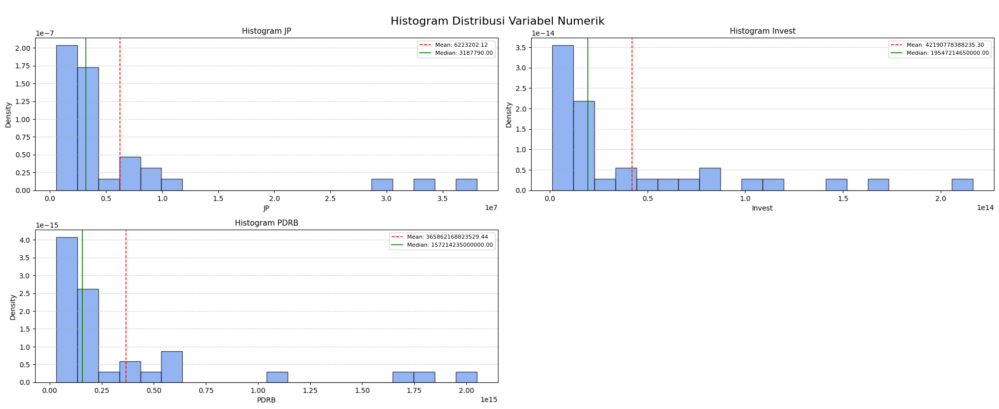

In [18]:
# histogram
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(20, 15))
axes = axes.flatten()

for i, kolom in enumerate(data_kolom.columns):
    ax = axes[i]

    count, bins, ignored = ax.hist(
        data_kolom[kolom],
        bins=20,
        density=True,
        edgecolor='k',
        alpha=0.7,
        color='cornflowerblue'
    )

    mean_val = data_kolom[kolom].mean()
    median_val = data_kolom[kolom].median()

    ax.axvline(mean_val, color='red', linestyle='--', linewidth=1.2, label=f'Mean: {mean_val:.2f}')
    ax.axvline(median_val, color='green', linestyle='-', linewidth=1.2, label=f'Median: {median_val:.2f}')

    ax.set_title(f'Histogram {kolom}', fontsize=11)
    ax.set_xlabel(kolom)
    ax.set_ylabel('Density')
    ax.grid(axis='y', linestyle='--', alpha=0.6)
    ax.legend(fontsize=8)

for j in range(len(data_kolom.columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle('\nHistogram Distribusi Variabel Numerik \n', fontsize=16, y=1.02)
plt.show()

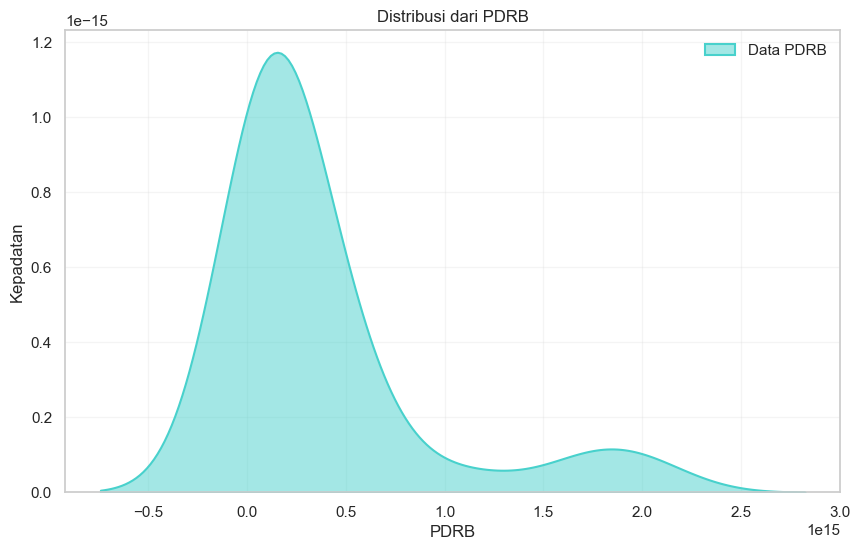

In [58]:
plt.figure(figsize=(10, 6))

sns.kdeplot(data=dataRegresi['PDRB'], 
            fill=True, 
            color='mediumturquoise', 
            alpha=0.5, 
            linewidth=1.5, 
            label='Data PDRB')

plt.title("Distribusi dari PDRB")
plt.xlabel("PDRB")
plt.ylabel("Kepadatan")
plt.legend(loc="upper right", frameon=False)
plt.grid(True, alpha=0.2)
plt.show()

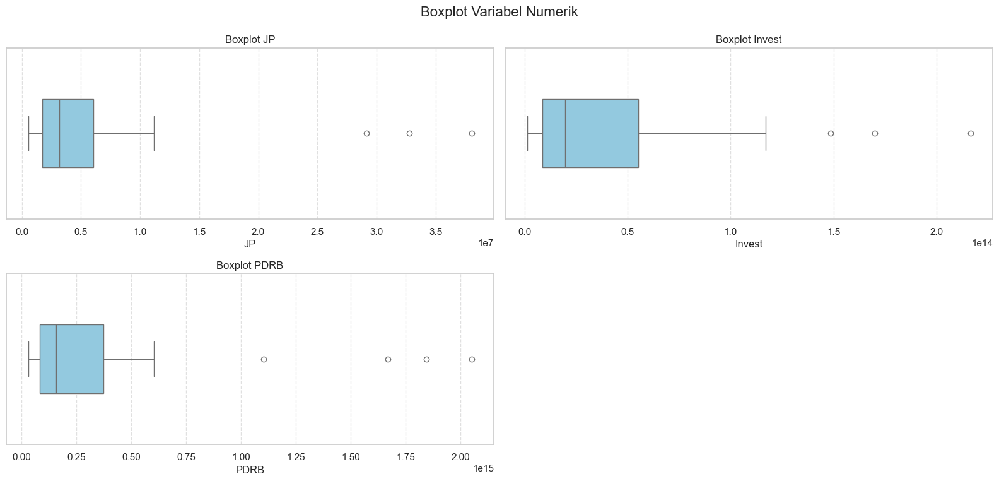

In [19]:
# boxplot
sns.set(style="whitegrid")

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(16, 14))
axes = axes.flatten()

for i, kolom in enumerate(data_kolom.columns):
    ax = axes[i]
    sns.boxplot(x=data_kolom[kolom], ax=ax, color='skyblue', width=0.4)

    ax.set_title(f'Boxplot {kolom}', fontsize=12)
    ax.set_xlabel(kolom)
    ax.grid(axis='x', linestyle='--', alpha=0.6)

for j in range(len(data_kolom.columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle('Boxplot Variabel Numerik', fontsize=16, y=1.02)
plt.show()

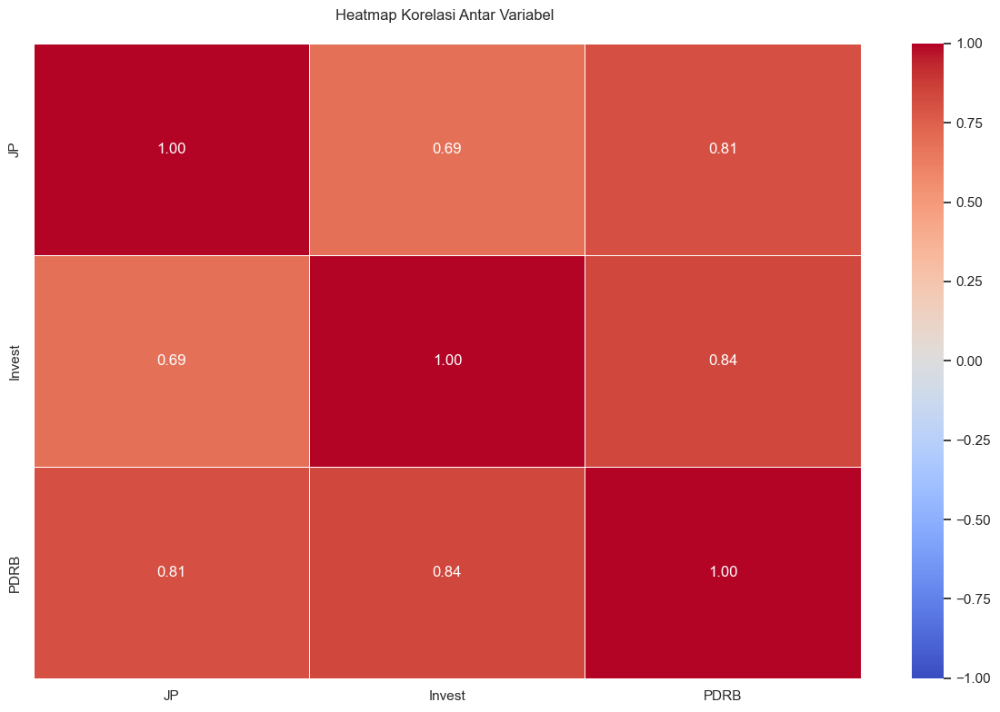

In [20]:
korelasi = data_kolom.corr()

# Setup ukuran figure
plt.figure(figsize=(12, 8))

# Membuat heatmap
sns.heatmap(korelasi, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, cbar=True, vmin=-1, vmax=1)

# Judul dan label
plt.title('Heatmap Korelasi Antar Variabel \n', fontsize=12)
plt.tight_layout()
plt.show()

In [21]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
data_kolom_const = add_constant(data_kolom)
vif_data = pd.DataFrame()
vif_data["Variabel"] = data_kolom_const.columns
vif_data["VIF"] = [variance_inflation_factor(data_kolom_const.values, i) for i in range(data_kolom_const.shape[1])]

# Menampilkan hasil VIF
print(vif_data)

  Variabel       VIF
0    const  0.000000
1       JP  2.911552
2   Invest  3.344530
3     PDRB  5.163424


c:\Users\Ezra\OneDrive\Documents\Ezra\Kuliah\Skripsi\gpu-py-env\venv-py311\Lib\site-packages\statsmodels\regression\linear_model.py:1782: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


Uji Kenormalan dengan Uji Shapiro-Wilk tiap Variabel

In [22]:
import scipy.stats as st

for col in data_kolom.columns:
    stat, p = st.shapiro(data_kolom[col])
    print(f"{col}: statistic={stat:.3f}, p-value={p:.3f}")

JP: statistic=0.576, p-value=0.000
Invest: statistic=0.742, p-value=0.000
PDRB: statistic=0.628, p-value=0.000


--- Visualisasi Uji Linearitas ---


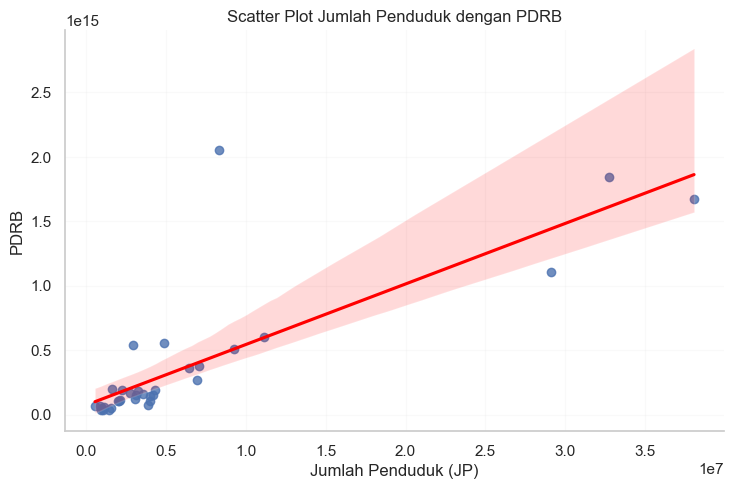

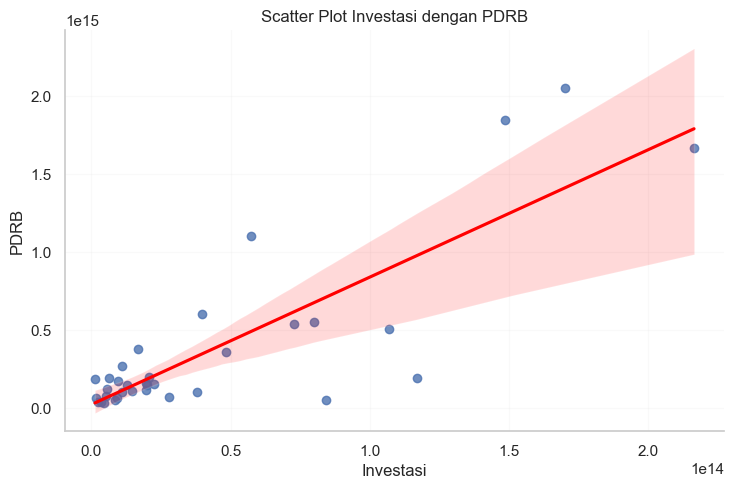

In [23]:
print("--- Visualisasi Uji Linearitas ---")

comma_formatter = FuncFormatter(lambda x, pos: f'{x:.1f}'.replace('.', ','))
# Plot untuk JP vs PDRB
sns.lmplot(x='JP', y='PDRB', data=data_kolom, line_kws={'color': 'red'}, height=5, aspect=1.5)
plt.title('Scatter Plot Jumlah Penduduk dengan PDRB')
plt.xlabel('Jumlah Penduduk (JP)')
plt.ylabel('PDRB')
plt.grid(alpha=0.1)
plt.show()

# Plot untuk Invest vs PDRB
sns.lmplot(x='Invest', y='PDRB', data=data_kolom, line_kws={'color': 'red'}, height=5, aspect=1.5)
plt.title('Scatter Plot Investasi dengan PDRB')
plt.xlabel('Investasi')
plt.ylabel('PDRB')
plt.grid(alpha=0.1)
plt.show()

##### Preprocessing Data

In [24]:
Y_regres = data_kolom['PDRB']
X_regres = data_kolom[['JP','Invest']]

#### Posterior

##### Pengecekan Sampler

Menggunakan sampler yang sama dengan estimasi parameter sebelumnya.

In [25]:
sampler_kwargs = {
    "chains": 4,
    "cores": 4,
    "return_inferencedata": True,
    "random_seed": 42,
    "tune": 2000,
    "draws": 5000,
}

##### Pemodelan dengan Distribusi Normal

In [ ]:
with pm.Model() as modelNormalRegresi:
  sigma = pm.HalfCauchy('sigma', beta=10e5)
  b0 = pm.Normal('b0', mu=29614000, sigma=10)
  b_JP = pm.Normal('b_JP', mu=-30, sigma=10)
  b_Invest = pm.Normal('b_Invest', mu=6, sigma=5)
  
  eps = b0 + b_JP * X_regres['JP'] + b_Invest * X_regres['Invest']
  y_obs = pm.Normal('NormalDist', mu=eps, sigma=sigma, observed=Y_regres)
  traceNormalRegresi = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H0 = pm.loo(traceNormalRegresi).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b0, b_JP, b_Invest]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 32 seconds.


In [122]:
summaryNormalRegresi = az.summary(traceNormalRegresi, round_to=3, hdi_prob=0.95)
summaryNormalRegresi

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b0,2.961400e+07,1.009300e+01,2.961398e+07,2.961402e+07,5.600000e-02,6.900000e-02,31996.138,15985.960,1.000
b_JP,-2.996900e+01,1.004100e+01,-4.995800e+01,-1.089200e+01,5.700000e-02,6.900000e-02,30758.045,16045.591,1.000
b_Invest,8.319000e+00,7.330000e-01,6.892000e+00,9.742000e+00,4.000000e-03,5.000000e-03,27122.481,15129.520,1.000
sigma,2.881028e+14,3.595865e+13,2.242759e+14,3.611553e+14,2.212906e+11,2.857106e+11,28146.656,16319.474,1.001


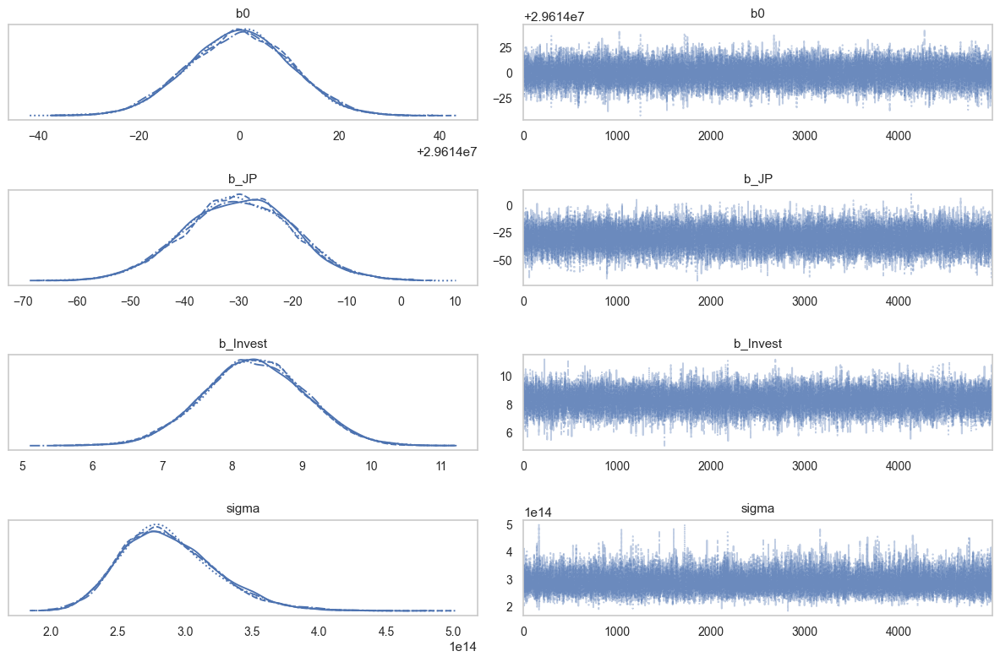

In [123]:
axes = az.plot_trace(traceNormalRegresi)
for ax in axes[:, 0]:
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
plt.tight_layout()
plt.show()

##### Pemodelan dengan Distribusi GMSNBurr

PyMC

In [ ]:
with pm.Model() as modelGMSNBurrRegresi:
  # prior untuk parameter
  sigma = pm.HalfCauchy("sigma", beta=10e5)
  alpha1 = pm.LogNormal("alpha1", mu=1.25, sigma=0.5)
  alpha2 = pm.LogNormal("alpha2", mu=0.25, sigma=0.5)
  b0 = pm.Normal('b0', mu=29614000, sigma=10)
  b_JP = pm.Normal('b_JP', mu=-30, sigma=10)
  b_Invest = pm.Normal('b_Invest', mu=6, sigma=5)
  eps = b0 + b_JP * X_regres['JP'] + b_Invest * X_regres['Invest']
  
  # likelihood
  y_obs = GMSNBurr.main("GMSNBurrDist", 
                        mu=eps, 
                        sigma=sigma, 
                        alpha1=alpha1, 
                        alpha2=alpha2, 
                        observed=Y_regres)

  # posterior
  traceGMSNBurrRegresi = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H1 = pm.loo(traceGMSNBurrRegresi).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, alpha1, alpha2, b0, b_JP, b_Invest]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 38 seconds.


In [115]:
summaryGMSNBurrRegresi = az.summary(traceGMSNBurrRegresi, round_to=3, hdi_prob=0.95)
summaryGMSNBurrRegresi

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b0,2.961400e+07,1.002100e+01,2.961398e+07,2.961402e+07,5.900000e-02,8.000000e-02,28958.104,13976.468,1.0
b_JP,-3.007400e+01,9.993000e+00,-5.025200e+01,-1.151300e+01,6.200000e-02,7.300000e-02,26045.237,15523.432,1.0
b_Invest,6.725000e+00,1.387000e+00,3.781000e+00,9.244000e+00,1.100000e-02,1.100000e-02,15476.971,11844.257,1.0
sigma,2.402591e+14,3.813279e+13,1.676460e+14,3.140797e+14,2.654871e+11,2.950924e+11,20304.708,12536.084,1.0
alpha1,3.075000e+00,1.748000e+00,6.860000e-01,6.526000e+00,1.300000e-02,2.200000e-02,19279.153,14948.524,1.0
alpha2,1.218000e+00,6.330000e-01,3.040000e-01,2.458000e+00,5.000000e-03,8.000000e-03,15802.023,12594.187,1.0


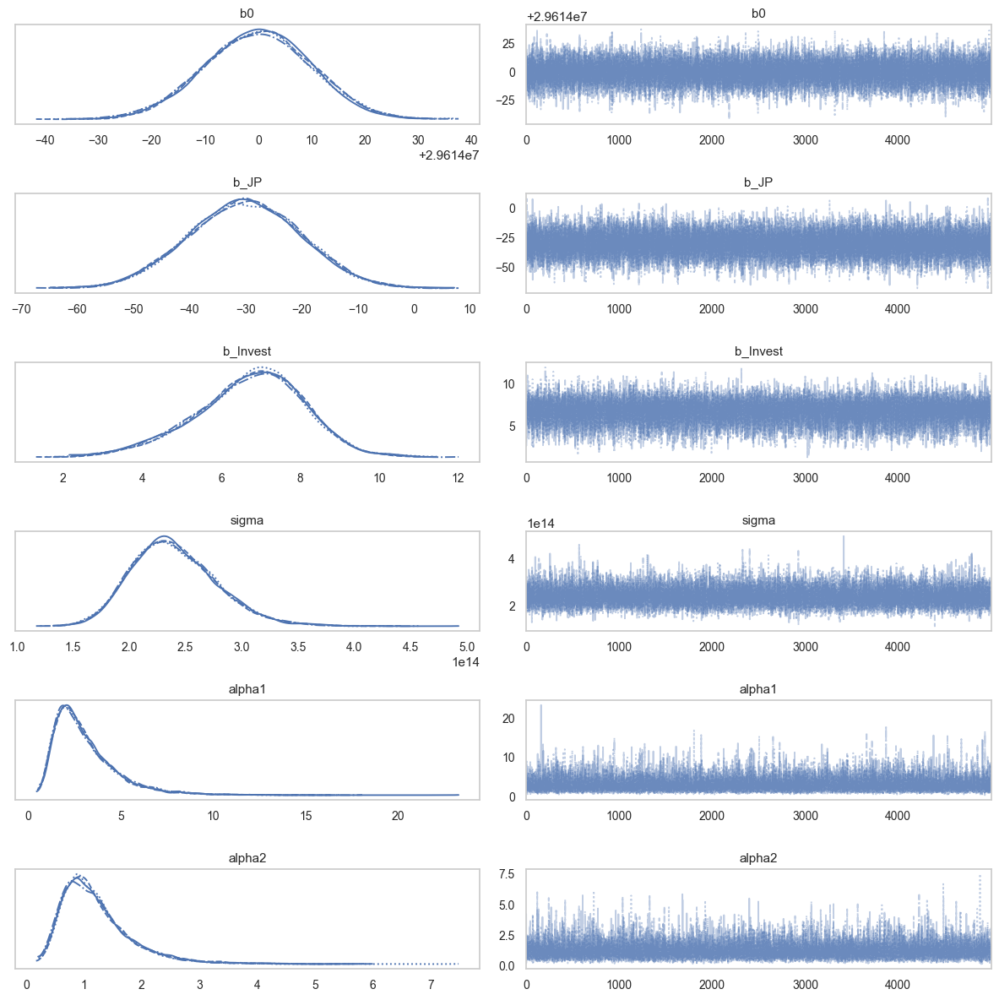

In [116]:
axes = az.plot_trace(traceGMSNBurrRegresi)
for ax in axes[:, 0]:
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
plt.tight_layout()
plt.show()

Bambi

In [62]:
databpsregresi = pd.DataFrame({'pdrb': Y_regres, 'jp': X_regres['JP'], 'invest': X_regres['Invest']})
prior_regresi = {"sigma": bmb.Prior("HalfCauchy", beta=3),
                 "alpha1": bmb.Prior("Lognormal", mu=0.75, sigma=0.75),
                 "alpha2": bmb.Prior("Lognormal", mu=0.75, sigma=0.75),
                 "Intercept": bmb.Prior('Normal', mu=300000, sigma=5),
                 "jp": bmb.Prior('Normal', mu=-36, sigma=5),
                 "invest": bmb.Prior('Normal', mu=4, sigma=5)}

In [63]:
regresibps = bmb.Model("pdrb ~ jp + invest", databpsregresi, family=family, priors=prior_regresi)
modelregresibps = regresibps.fit(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
az.summary(modelregresibps)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha1, alpha2, sigma, Intercept, jp, invest]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 38 seconds.
There were 10 divergences after tuning. Increase `target_accept` or reparameterize.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha1,2.032,1.742,0.275,4.826,0.016,0.040,11975.0,14160.0,1.0
alpha2,1.154,0.809,0.208,2.517,0.007,0.013,12030.0,14332.0,1.0
sigma,324918.312,61674.667,212216.586,437786.017,543.253,426.386,12495.0,12077.0,1.0
Intercept,63118.225,70637.080,-64462.318,197043.779,494.117,507.028,21046.0,14090.0,1.0
jp,-24.800,5.310,-34.776,-14.942,0.039,0.037,18222.0,13760.0,1.0
invest,9.273,1.710,5.970,12.364,0.013,0.012,18454.0,14632.0,1.0


In [64]:
regresibps

       Formula: pdrb ~ jp + invest
        Family: GMSNBurr
          Link: mu = identity
  Observations: 34
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 300000.0, sigma: 5.0)
            jp ~ Normal(mu: -36.0, sigma: 5.0)
            invest ~ Normal(mu: 4.0, sigma: 5.0)
        
        Auxiliary parameters
            alpha1 ~ Lognormal(mu: 0.75, sigma: 0.75)
            alpha2 ~ Lognormal(mu: 0.75, sigma: 0.75)
            sigma ~ HalfCauchy(beta: 3.0)
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .fit() to az.summary() or az.plot_trace()

##### Pemodelan dengan Distribusi MSNBurr

In [145]:
with pm.Model() as modelMSNBurrRegresi:
  sigma = pm.HalfCauchy("sigma", beta=10e5)
  alpha = pm.Gamma("alpha", alpha=4, beta=2)
  b0 = pm.Normal('b0', mu=29614000, sigma=10)
  b_JP = pm.Normal('b_JP', mu=-36, sigma=5)
  b_Invest = pm.Normal('b_Invest', mu=4, sigma=5)
  eps = b0 + b_JP * X_regres['JP'] + b_Invest * X_regres['Invest']
  y = MSNBurr.main("MSNBurrDist", mu=eps, sigma=sigma, alpha=alpha, observed=Y_regres)
  traceMSNBurrRegresi = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H2 = pm.loo(traceMSNBurrRegresi).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, alpha, b0, b_JP, b_Invest]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 32 seconds.


In [146]:
summaryMSNBurrRegresi = az.summary(traceMSNBurrRegresi, round_to=3, hdi_prob=0.95)
summaryMSNBurrRegresi

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b0,2.961400e+07,9.981000e+00,2.961398e+07,2.961402e+07,6.900000e-02,6.800000e-02,20870.393,14079.676,1.0
b_JP,-3.604500e+01,5.001000e+00,-4.578700e+01,-2.634000e+01,3.600000e-02,3.500000e-02,19365.835,14500.554,1.0
b_Invest,7.444000e+00,1.117000e+00,5.142000e+00,9.631000e+00,1.000000e-02,1.100000e-02,14090.879,9649.622,1.0
sigma,2.278884e+14,3.559275e+13,1.594468e+14,2.953771e+14,2.569451e+11,2.653556e+11,18993.367,14407.036,1.0
alpha,1.649000e+00,7.860000e-01,4.220000e-01,3.236000e+00,6.000000e-03,7.000000e-03,14532.154,11650.971,1.0


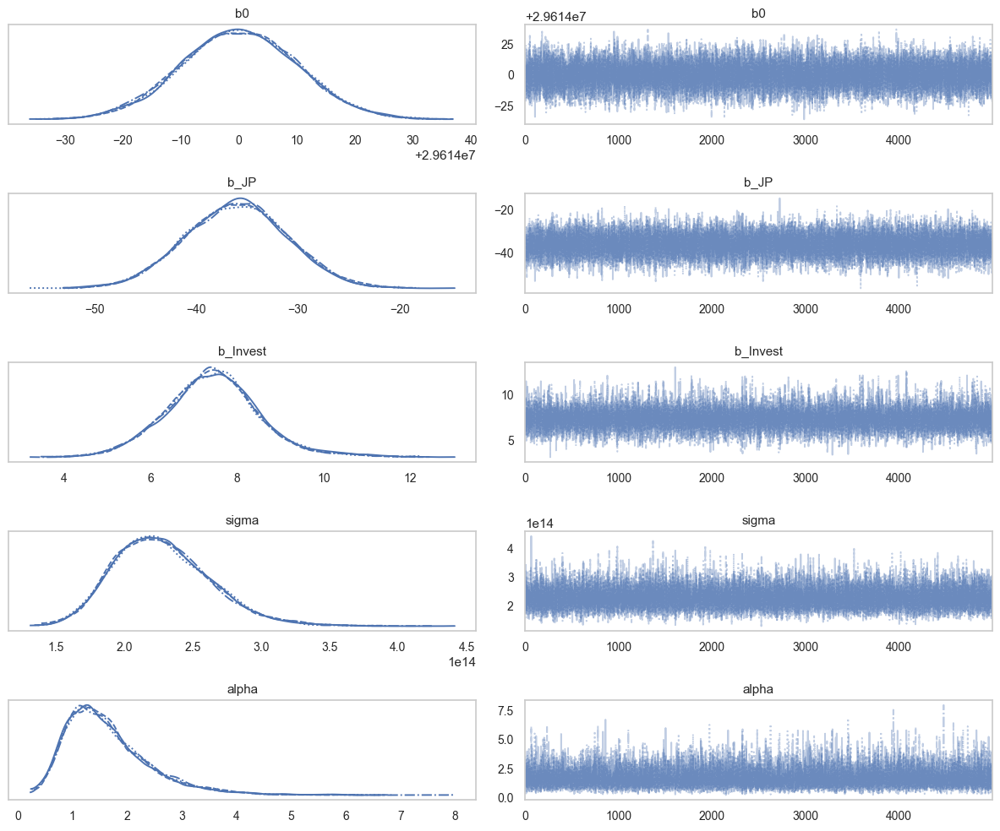

In [147]:
axes = az.plot_trace(traceMSNBurrRegresi)
for ax in axes[:, 0]:
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
plt.tight_layout()
plt.show()

##### Pemodelan dengan Distribusi MSNBurr-IIa

In [138]:
with pm.Model() as modelMSNBurrIIaRegresi:
  sigma = pm.HalfCauchy("sigma", beta=10e5)
  alpha = pm.Gamma("alpha", alpha=4, beta=2)
  b0 = pm.Normal('b0', mu=29614000, sigma=10)
  b_JP = pm.Normal('b_JP', mu=-30, sigma=10)
  b_Invest = pm.Normal('b_Invest', mu=6, sigma=5)
  eps = b0 + b_JP * X_regres['JP'] + b_Invest * X_regres['Invest']
  y = MSNBurrIIa.main("MSNBurrIIaDist", mu=eps, sigma=sigma, alpha=alpha, observed=Y_regres)
  traceMSNBurrIIaRegresi = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H3 = pm.loo(traceMSNBurrIIaRegresi).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, alpha, b0, b_JP, b_Invest]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 31 seconds.


In [136]:
summaryMSNBurrIIaRegresi = az.summary(traceMSNBurrIIaRegresi, round_to=3, hdi_prob=0.95)
summaryMSNBurrIIaRegresi

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b0,2.961400e+07,1.002400e+01,2.961398e+07,2.961402e+07,7.200000e-02,7.700000e-02,19574.875,13426.641,1.0
b_JP,-2.995300e+01,9.998000e+00,-4.988400e+01,-1.095100e+01,7.000000e-02,7.200000e-02,20655.435,14822.191,1.0
b_Invest,8.818000e+00,1.363000e+00,6.320000e+00,1.134500e+01,1.300000e-02,8.000000e-03,10739.806,12856.584,1.0
sigma,2.319364e+14,3.826905e+13,1.613999e+14,3.080139e+14,3.068148e+11,2.987310e+11,15669.585,12983.690,1.0
alpha,1.744000e+00,1.033000e+00,3.210000e-01,3.818000e+00,9.000000e-03,8.000000e-03,10903.769,13697.517,1.0


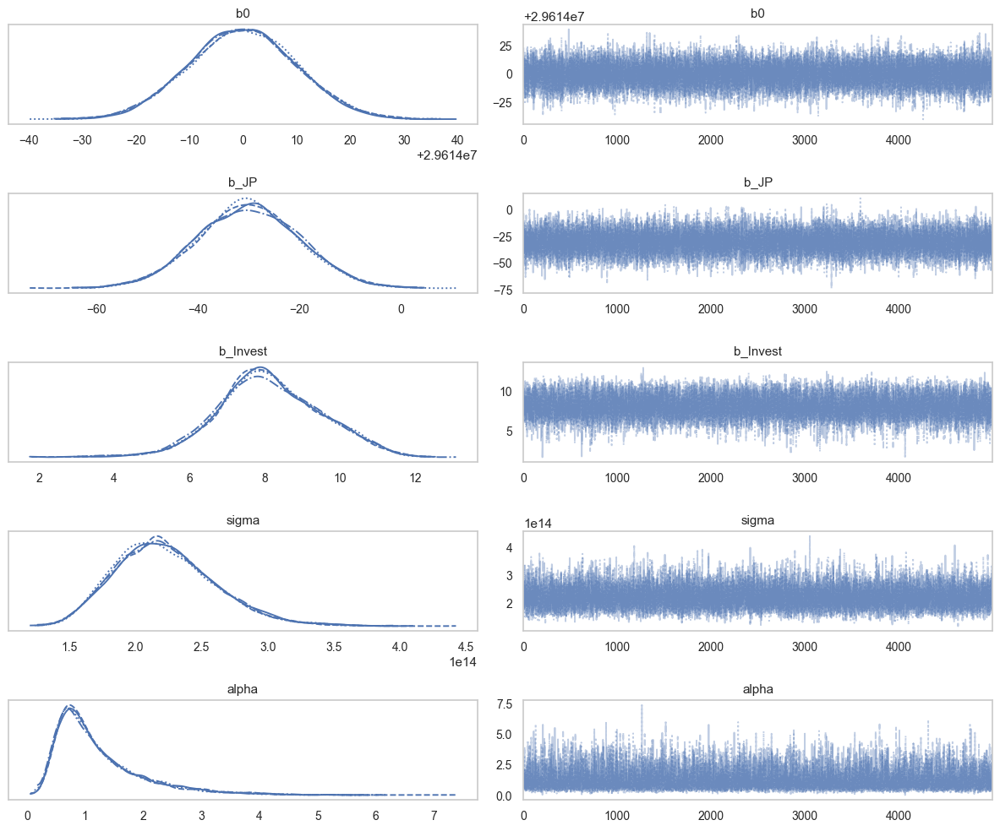

In [148]:
axes = az.plot_trace(traceMSNBurrIIaRegresi)
for ax in axes[:, 0]:
    ax.grid(False)
for ax in axes[:, 1]:
    ax.grid(False)
plt.tight_layout()
plt.show()

#### Inferensi Posterior

##### Posterior Predictive Checking

Distribusi Normal

Sampling: [NormalDist]


Output()

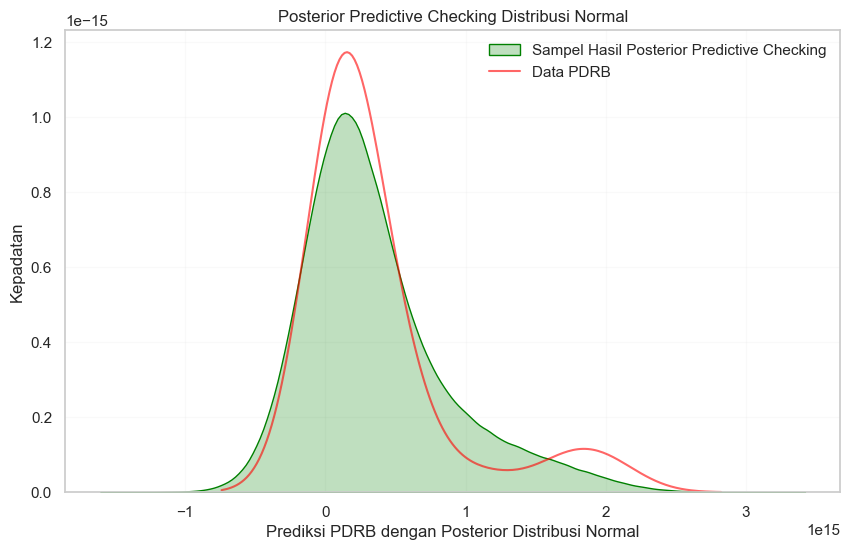

In [187]:
with modelNormalRegresi:
  posterior_pred = pm.sample_posterior_predictive(traceNormalRegresi, var_names=["NormalDist"])

posterior_samples = posterior_pred['posterior_predictive']['NormalDist'].values.flatten()
filtered_samples = posterior_samples[(posterior_samples >= 0)]

# visualisasi
plt.figure(figsize=(10,6))
sns.kdeplot(data=posterior_samples, color='green',fill=True,label='Sampel Hasil Posterior Predictive Checking')
sns.kdeplot(Y_regres,  color="red", alpha=0.6, label='Data PDRB')
plt.title("Posterior Predictive Checking Distribusi Normal")
plt.xlabel("Prediksi PDRB dengan Posterior Distribusi Normal")
plt.ylabel("Kepadatan")
plt.legend(frameon = False, loc="upper right")
plt.grid(alpha=0.1)
plt.show()

In [189]:
# statistik hasil posterior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 538203462005000.62
Median   : 394710805231000.81
Std Dev  : 474338695749003.75
Min      : 1415390726.02
25% Qtl  : 188662841753060.00
75% Qtl  : 742392303745854.75
Max      : 3313949907265368.50


Distribusi GMSNBurr

Sampling: [GMSNBurrDist]


Output()

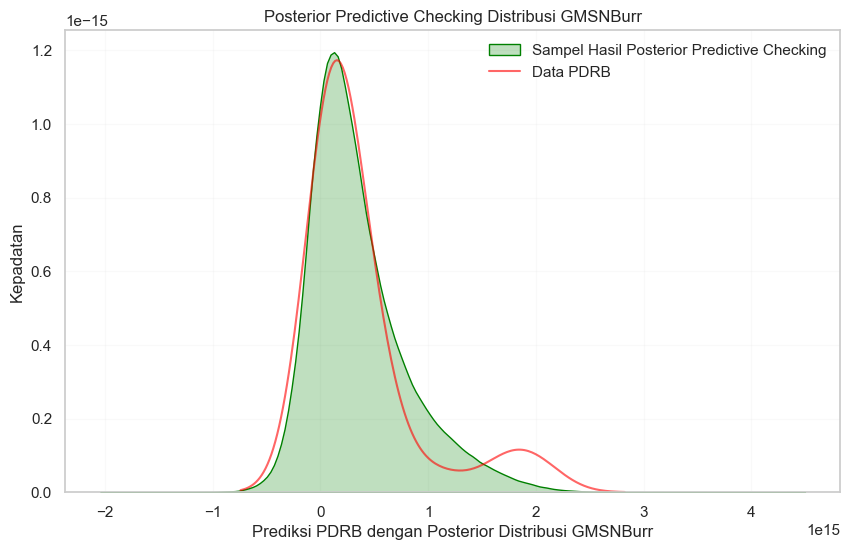

In [193]:
with modelGMSNBurrRegresi:
  posterior_pred = pm.sample_posterior_predictive(traceGMSNBurrRegresi, var_names=["GMSNBurrDist"])

posterior_samples = posterior_pred['posterior_predictive']['GMSNBurrDist'].values.flatten()
filtered_samples = posterior_samples[(posterior_samples >= 0)]

# visualisasi
plt.figure(figsize=(10,6))
sns.kdeplot(data=posterior_samples, color='green',fill=True,label='Sampel Hasil Posterior Predictive Checking')
sns.kdeplot(Y_regres,  color="red", alpha=0.6, label='Data PDRB')
plt.title("Posterior Predictive Checking Distribusi GMSNBurr")
plt.xlabel("Prediksi PDRB dengan Posterior Distribusi GMSNBurr")
plt.ylabel("Kepadatan")
plt.legend(frameon = False, loc="upper right")
plt.grid(alpha=0.1)
plt.show()

In [192]:
# statistik hasil posterior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 479861119490520.88
Median   : 356701033231147.81
Std Dev  : 419786419220413.62
Min      : 1711344258.05
25% Qtl  : 167795375941026.16
75% Qtl  : 670600589502740.00
Max      : 4005343298925690.50


Distribusi MSNBurr

Sampling: [MSNBurrDist]


Output()

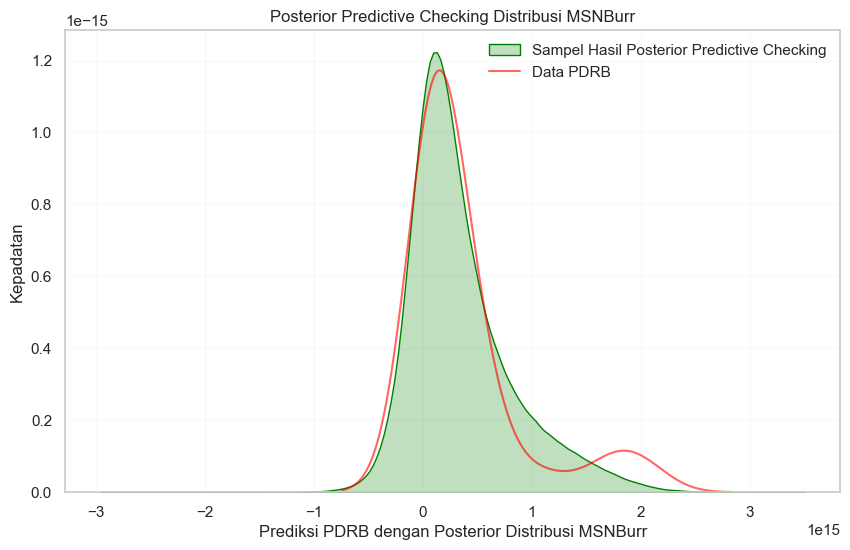

In [194]:
with modelMSNBurrRegresi:
  posterior_pred = pm.sample_posterior_predictive(traceMSNBurrRegresi, var_names=["MSNBurrDist"])

posterior_samples = posterior_pred['posterior_predictive']['MSNBurrDist'].values.flatten()
filtered_samples = posterior_samples[(posterior_samples >= 0)]

# visualisasi
plt.figure(figsize=(10,6))
sns.kdeplot(data=posterior_samples, color='green',fill=True,label='Sampel Hasil Posterior Predictive Checking')
sns.kdeplot(Y_regres,  color="red", alpha=0.6, label='Data PDRB')
plt.title("Posterior Predictive Checking Distribusi MSNBurr")
plt.xlabel("Prediksi PDRB dengan Posterior Distribusi MSNBurr")
plt.ylabel("Kepadatan")
plt.legend(frameon = False, loc="upper right")
plt.grid(alpha=0.1)
plt.show()

In [195]:
# statistik hasil posterior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 485526788742739.19
Median   : 347678075584120.38
Std Dev  : 438158183183712.19
Min      : 1169555266.80
25% Qtl  : 162426446142860.19
75% Qtl  : 677288171982578.38
Max      : 3408686059383677.00


Distribusi MSNBurr-IIa

Sampling: [MSNBurrIIaDist]


Output()

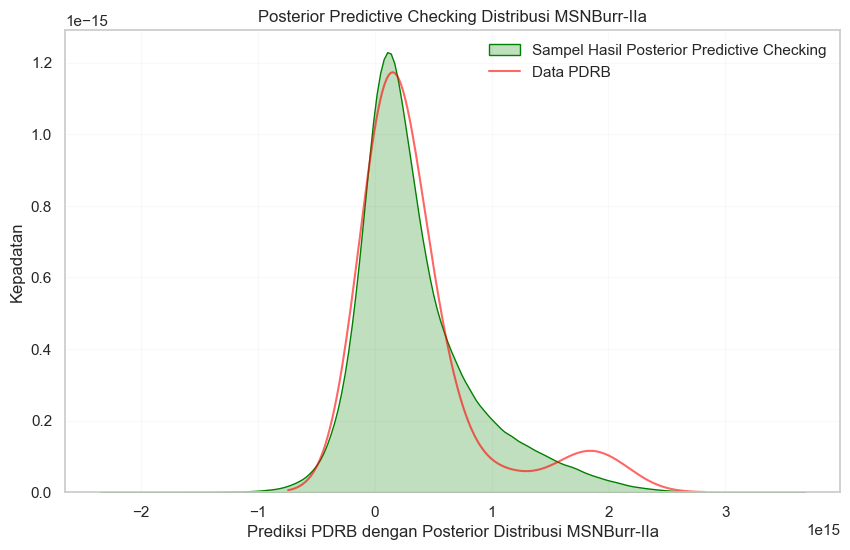

In [196]:
with modelMSNBurrIIaRegresi:
  posterior_pred = pm.sample_posterior_predictive(traceMSNBurrIIaRegresi, var_names=["MSNBurrIIaDist"])

posterior_samples = posterior_pred['posterior_predictive']['MSNBurrIIaDist'].values.flatten()
filtered_samples = posterior_samples[(posterior_samples >= 0)]

# visualisasi
plt.figure(figsize=(10,6))
sns.kdeplot(data=posterior_samples, color='green',fill=True,label='Sampel Hasil Posterior Predictive Checking')
sns.kdeplot(Y_regres,  color="red", alpha=0.6, label='Data PDRB')
plt.title("Posterior Predictive Checking Distribusi MSNBurr-IIa")
plt.xlabel("Prediksi PDRB dengan Posterior Distribusi MSNBurr-IIa")
plt.ylabel("Kepadatan")
plt.legend(frameon = False, loc="upper right")
plt.grid(alpha=0.1)
plt.show()

In [197]:
# statistik hasil posterior predictive checking
mean_val = np.mean(filtered_samples)
median_val = np.median(filtered_samples)
std_val = np.std(filtered_samples)
min_val = np.min(filtered_samples)
max_val = np.max(filtered_samples)
q25, q75 = np.percentile(filtered_samples, [25, 75])

print("Summary Statistics (NumPy):")
print(f"Mean     : {mean_val:.2f}")
print(f"Median   : {median_val:.2f}")
print(f"Std Dev  : {std_val:.2f}")
print(f"Min      : {min_val:.2f}")
print(f"25% Qtl  : {q25:.2f}")
print(f"75% Qtl  : {q75:.2f}")
print(f"Max      : {max_val:.2f}")

Summary Statistics (NumPy):
Mean     : 501679650618073.69
Median   : 345827724774904.62
Std Dev  : 468720678905455.00
Min      : 2762355265.52
25% Qtl  : 160479319571807.06
75% Qtl  : 697497356256988.62
Max      : 3578051895031359.50


##### Bayes Factor

In [149]:
models = {
    "Normal": log_evidence_H0,
    "GMSNBurr": log_evidence_H1,
    "MSNBurr": log_evidence_H2,
    "MSNBurr-IIa": log_evidence_H3
}

model_names = list(models.keys())
bf_matrix = pd.DataFrame(index=model_names, columns=model_names, dtype=float)
log_bf_matrix = pd.DataFrame(index=model_names, columns=model_names, dtype=float)

for model_row in model_names:
    for model_col in model_names:
        log_evidence_row = models[model_row]
        log_evidence_col = models[model_col]

        log_bf = log_evidence_row - log_evidence_col
        bf = np.exp(log_bf)

        bf_matrix.loc[model_row, model_col] = bf
        log_bf_matrix.loc[model_row, model_col] = log_bf

In [150]:
print("--- Matriks Perbandingan Bayes Factor (Baris vs. Kolom) ---")
display(bf_matrix.style.format("{:.2f}").background_gradient(cmap='viridis', axis=None))

--- Matriks Perbandingan Bayes Factor (Baris vs. Kolom) ---


,Normal,GMSNBurr,MSNBurr,MSNBurr-IIa
Normal,1.00,0.71,0.18,0.22
GMSNBurr,1.41,1.00,0.25,0.31
MSNBurr,5.59,3.95,1.00,1.21
MSNBurr-IIa,4.62,3.27,0.83,1.00


In [151]:
print("--- Matriks Perbandingan Bayes Factor (Baris vs. Kolom) ---")
display(log_bf_matrix.style.format("{:.2f}").background_gradient(cmap='viridis', axis=None))

--- Matriks Perbandingan Bayes Factor (Baris vs. Kolom) ---


,Normal,GMSNBurr,MSNBurr,MSNBurr-IIa
Normal,0.00,-0.35,-1.72,-1.53
GMSNBurr,0.35,0.00,-1.37,-1.18
MSNBurr,1.72,1.37,0.00,0.19
MSNBurr-IIa,1.53,1.18,-0.19,0.00


##### LOO-CV

In [152]:
# evaluasi loo
loo_Regresi = az.compare({"Normal": traceNormalRegresi, "GMSNBurr": traceGMSNBurrRegresi, "MSNBurr": traceMSNBurrRegresi, "MSNBurrIIa": traceMSNBurrIIaRegresi})
loo_Regresi

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
MSNBurr,0,-1181.816129,6.489449,0.000000,8.772553e-01,8.368683,0.000000,False,log
MSNBurrIIa,1,-1182.006063,7.534836,0.189934,1.204626e-01,8.202997,0.718119,False,log
GMSNBurr,2,-1183.190241,7.568282,1.374112,3.054459e-15,8.345029,0.725398,False,log
Normal,3,-1183.536667,5.130505,1.720537,2.282124e-03,7.007986,1.725924,False,log


In [153]:
loo_normal = az.loo(traceNormalRegresi)
print("--- LOO Normal ---")
print(loo_normal)
loo_gmsnburr = az.loo(traceGMSNBurrRegresi)
print("\n--- LOO GMSNBurr ---")
print(loo_gmsnburr)
loo_msnburr = az.loo(traceMSNBurrRegresi)
print("\n--- LOO MSNBurr ---")
print(loo_msnburr)
loo_msnburriia = az.loo(traceMSNBurrIIaRegresi)
print("\n--- LOO MSNBurr-IIa ---")
print(loo_msnburriia)

--- LOO Normal ---
Computed from 20000 posterior samples and 34 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -1183.54     7.01
p_loo        5.13        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)       34  100.0%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%


--- LOO GMSNBurr ---
Computed from 20000 posterior samples and 34 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -1183.19     8.35
p_loo        7.57        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)       34  100.0%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%


--- LOO MSNBurr ---
Computed from 20000 posterior samples and 34 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -1181.82     8.37
p_loo        6.49        -
------

Pareto k diagnostic values:
                         Count 

##### Visualisasi Perbandingan

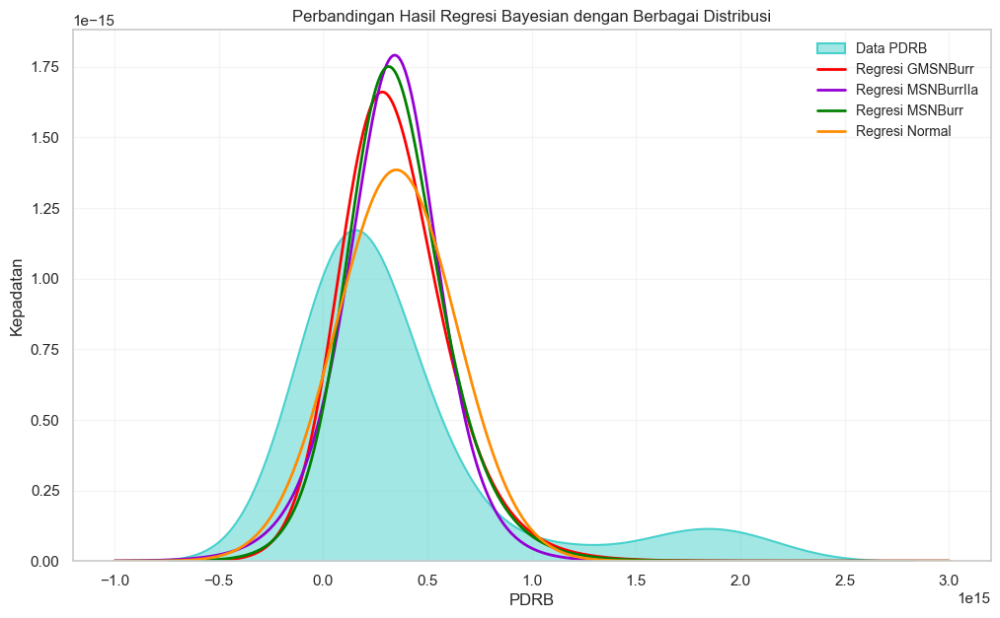

In [198]:
# Ambil parameter posterior mean
params = az.summary(traceGMSNBurrRegresi, kind="stats")['mean']
b0_ = params['b0']
b_JP_ = params['b_JP']
b_Invest_ = params['b_Invest']
sigma_ = params['sigma']
alpha1_ = params['alpha1']
alpha2_ = params['alpha2']
params_msnburriia = az.summary(traceMSNBurrIIaRegresi, kind="stats")['mean']
b0_msn2a = params_msnburriia['b0']
b_JP_msn2a = params_msnburriia['b_JP']
b_Invest_msn2a = params_msnburriia['b_Invest']
sigma_msn2a = params_msnburriia['sigma']
alpha_msn2a = params_msnburriia['alpha']
params_norm = az.summary(traceNormalRegresi, kind="stats")['mean']
b0_norm = params_norm['b0']
b_JP_norm = params_norm['b_JP']
b_Invest_norm = params_norm['b_Invest']
sigma_norm = params_norm['sigma']
params_msn = az.summary(traceMSNBurrRegresi, kind="stats")['mean']
b0_msn = params_msn['b0']
b_JP_msn = params_msn['b_JP']
b_Invest_msn = params_msn['b_Invest']
sigma_msn = params_msn['sigma']
alpha_msn = params_msn['alpha']

# Rentang X untuk visualisasi
minY, maxY = Y_regres.min(), Y_regres.max()
x = np.linspace(-1e15, 3e15, 400)
JP_mean = X_regres['JP'].mean()
Invest_mean = X_regres['Invest'].mean()
mu_pred = b0_ + b_JP_ * JP_mean + b_Invest_ * Invest_mean

# PDF dari distribusi
mu_pred_msn2a = b0_msn2a + b_JP_msn2a * JP_mean + b_Invest_msn2a * Invest_mean
y_msnburriia = [math.exp(rv_logpMSNBurrIIa_fn(value=xi, 
                                             mu=mu_pred_msn2a, 
                                             sigma=sigma_msn2a, 
                                             alpha=alpha_msn2a)) for xi in x]
mu_pred_msn = b0_msn + b_JP_msn * JP_mean + b_Invest_msn * Invest_mean
y_msnburr = [math.exp(rv_logpMSNBurr_fn(value=xi, 
                                        mu=mu_pred_msn, 
                                        sigma=sigma_msn, 
                                        alpha=alpha_msn)) for xi in x]
y_gmsnburr = [math.exp(rv_logp_fn(value=xi,
                                  mu=mu_pred,
                                  sigma=sigma_,
                                  alpha1=alpha1_,
                                  alpha2=alpha2_)) for xi in x]
mu_pred_norm = b0_norm + b_JP_norm * JP_mean + b_Invest_norm * Invest_mean
y_normal = norm.pdf(x, loc=mu_pred_norm, scale=sigma_norm)


# Visualisasi
comma_formatter = FuncFormatter(lambda val, pos: f"{val:.2f}".replace('.', ','))
fig, ax = plt.subplots(figsize=(12, 7))
sns.kdeplot(Y_regres, fill=True, color='mediumturquoise', alpha=0.5, linewidth=1.5, label='Data PDRB', ax=ax)
ax.plot(x, y_gmsnburr, label='Regresi GMSNBurr', color='red', linewidth=2)
ax.plot(x, y_msnburriia, label='Regresi MSNBurrIIa', color='darkviolet', linewidth=2)
ax.plot(x, y_msnburr, label='Regresi MSNBurr', color='green', linewidth=2)
ax.plot(x, y_normal, label='Regresi Normal', color='darkorange', linewidth=2)
ax.set_xlabel("PDRB")
ax.set_ylabel("Kepadatan")
ax.grid(True, alpha=0.2, zorder=0)
ax.legend(loc='upper right', fontsize=10, frameon=False)
ax.set_ylim(bottom=0)
ax.set_title("Perbandingan Hasil Regresi Bayesian dengan Berbagai Distribusi")

plt.show()

##### Analisis Sensitivitas

Prior Model

In [26]:
with pm.Model() as modelRegresi:
  sigma = pm.HalfCauchy('sigma', beta=10e5)
  b0 = pm.Normal('b0', mu=29614000, sigma=10)
  b_JP = pm.Normal('b_JP', mu=-30, sigma=10)
  b_Invest = pm.Normal('b_Invest', mu=6, sigma=5)
  eps = b0 + b_JP * X_regres['JP'] + b_Invest * X_regres['Invest']
  y_obs = pm.Normal('NormalDist', mu=eps, sigma=sigma, observed=Y_regres)
  traceModelRegresi = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H0 = pm.loo(traceModelRegresi).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b0, b_JP, b_Invest]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 39 seconds.


In [27]:
summaryModelRegresi = az.summary(traceModelRegresi, round_to=3, hdi_prob=0.95)
summaryModelRegresi

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b0,2.961400e+07,1.009300e+01,2.961398e+07,2.961402e+07,5.600000e-02,6.900000e-02,31996.138,15985.960,1.000
b_JP,-2.996900e+01,1.004100e+01,-4.995800e+01,-1.089200e+01,5.700000e-02,6.900000e-02,30758.045,16045.591,1.000
b_Invest,8.319000e+00,7.330000e-01,6.892000e+00,9.742000e+00,4.000000e-03,5.000000e-03,27122.481,15129.520,1.000
sigma,2.881028e+14,3.595865e+13,2.242759e+14,3.611553e+14,2.212906e+11,2.857106e+11,28146.656,16319.474,1.001


Prior Informatif

In [30]:
with pm.Model() as modelRegresiInformatif:
  sigma = pm.Normal('sigma', mu=2.88*10e14, sigma=5)
  b0 = pm.Normal('b0', mu=29614000, sigma=5)
  b_JP = pm.Normal('b_JP', mu=-30, sigma=2)
  b_Invest = pm.Normal('b_Invest', mu=8, sigma=2)
  eps = b0 + b_JP * X_regres['JP'] + b_Invest * X_regres['Invest']
  y_obs = pm.Normal('NormalDist', mu=eps, sigma=sigma, observed=Y_regres)
  traceRegresiInformatif = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H0 = pm.loo(traceRegresiInformatif).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b0, b_JP, b_Invest]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 34 seconds.


In [31]:
summaryRegresiInformatif = az.summary(traceRegresiInformatif, round_to=3, hdi_prob=0.95)
summaryRegresiInformatif

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,2.880000e+15,4.995,2.880000e+15,2.880000e+15,0.027,0.034,35390.569,16800.822,1.000
b0,2.961400e+07,4.942,2.961399e+07,2.961401e+07,0.030,0.034,27609.285,15870.709,1.000
b_JP,-3.000800e+01,1.994,-3.391300e+01,-2.614900e+01,0.011,0.014,33929.073,15780.169,1.001
b_Invest,8.021000e+00,1.943,4.295000e+00,1.186200e+01,0.010,0.014,34540.370,14619.327,1.000


Prior Weakly Informatif

In [33]:
with pm.Model() as modelRegresiWeakly:
  sigma = pm.HalfCauchy('sigma', beta=10e5)
  b0 = pm.Normal('b0', mu=29614000, sigma=100)
  b_JP = pm.Normal('b_JP', mu=-30, sigma=20)
  b_Invest = pm.Normal('b_Invest', mu=6, sigma=10)
  eps = b0 + b_JP * X_regres['JP'] + b_Invest * X_regres['Invest']
  y_obs = pm.Normal('NormalDist', mu=eps, sigma=sigma, observed=Y_regres)
  traceRegresiWeakly = pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True})
  log_evidence_H0 = pm.loo(traceRegresiWeakly).elpd_loo

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b0, b_JP, b_Invest]


Output()

Sampling 4 chains for 2_000 tune and 5_000 draw iterations (8_000 + 20_000 draws total) took 34 seconds.


In [34]:
summaryRegresiWeakly = az.summary(traceRegresiWeakly, round_to=3, hdi_prob=0.95)
summaryRegresiWeakly

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
b0,2.961400e+07,1.004610e+02,2.961380e+07,2.961419e+07,6.120000e-01,7.020000e-01,26943.345,16150.790,1.000
b_JP,-2.989200e+01,2.015300e+01,-6.872100e+01,1.023700e+01,1.100000e-01,1.410000e-01,33459.718,15994.902,1.000
b_Invest,8.352000e+00,7.320000e-01,6.955000e+00,9.841000e+00,4.000000e-03,5.000000e-03,28239.751,15059.819,1.001
sigma,2.873347e+14,3.603210e+13,2.218487e+14,3.602680e+14,2.136450e+11,2.887542e+11,29990.048,14523.599,1.000


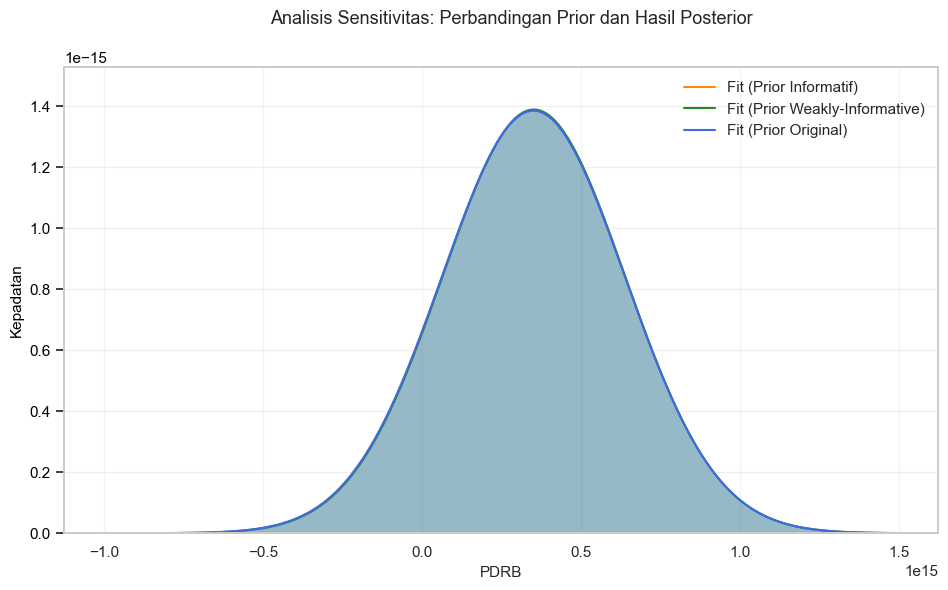

In [54]:
# x = np.linspace(40, 100, 1000)
x = np.linspace(-1e15, 1.5e15, 400)
jp_mean = X_regres['JP'].mean()
invest_mean = X_regres['Invest'].mean()

# prior terpilih
RegresiOrifParams = summaryModelRegresi['mean']
mu_ori = RegresiOrifParams.iloc[0] + RegresiOrifParams.iloc[1] * jp_mean + RegresiOrifParams.iloc[2] * invest_mean 
sigma_ori = RegresiOrifParams.iloc[3]
pdf_ori = st.norm.pdf(x, loc = mu_ori, scale = sigma_ori)

# prior informatif
RegresiInformatifParams = summaryRegresiInformatif['mean']
mu_info = RegresiInformatifParams.iloc[0] + RegresiInformatifParams.iloc[1] * jp_mean + RegresiInformatifParams.iloc[2] * invest_mean 
sigma_info = RegresiInformatifParams.iloc[3]
pdf_info = st.norm.pdf(x, loc = mu_info, scale = sigma_info)

# prior weakly-informatif
RegresiWeaklyParams = summaryRegresiWeakly['mean']
mu_weak = RegresiWeaklyParams.iloc[0] + RegresiWeaklyParams.iloc[1] * jp_mean + RegresiWeaklyParams.iloc[2] * invest_mean 
sigma_weak = RegresiWeaklyParams.iloc[3]
pdf_weak = st.norm.pdf(x, loc = mu_weak, scale = sigma_weak)

# PDF untuk distribusi prior
prior_pdf_informatif = st.norm.pdf(x, loc=29614000, scale=10)
prior_pdf_non = st.uniform.pdf(x, loc=0, scale=100)
prior_pdf_original = st.norm.pdf(x, loc=1e15, scale=1e10) 

fig, ax1 = plt.subplots(figsize=(10, 6))
ax1.plot(x, pdf_info, label='Fit (Prior Informatif)', color='darkorange')
ax1.plot(x, pdf_weak, label='Fit (Prior Weakly-Informative)', color='forestgreen')
ax1.plot(x, pdf_ori, label='Fit (Prior Original)', color='royalblue')
ax1.fill_between(x, pdf_info, color='darkorange', alpha=0.3)
ax1.fill_between(x, pdf_weak, color='forestgreen', alpha=0.3)
ax1.fill_between(x, pdf_ori, color='royalblue', alpha=0.3)
ax1.set_xlabel("PDRB", fontsize=11)
ax1.tick_params(axis='y', labelcolor='black')
ax1.grid(alpha=0.2)
ax2 = ax1.twinx() 
ax2.set_ylabel("Kepadatan Prior", color='black', fontsize=12)
ax2.tick_params(axis='y', labelcolor='black')
ax2.set_ylim(bottom=0)
fig.suptitle('Analisis Sensitivitas: Perbandingan Prior dan Hasil Posterior', fontsize=13)
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper right', frameon=False)
fig.tight_layout()
max_pdf = max(max(pdf_ori), max(pdf_info), max(pdf_weak))
max_prior = max(max(prior_pdf_original), max(prior_pdf_informatif), max(prior_pdf_non))
y_max = max(max_pdf, max_prior) * 1.1
ax1.set_ylim(0, y_max)
ax2.set_ylim(0, y_max)
ax1.set_ylabel("Kepadatan", color='black', fontsize=11)
ax2.set_yticklabels([])
ax2.set_ylabel("")
ax2.tick_params(axis='y', which='both', length=0)
plt.grid(True, alpha=0.1)
plt.show()